# Proyecto Final
## Jason Solano
## Percy Herrera

El set de datos es sobre informacion de campana de recoleccion de dineros de cuentas en mora, es la informacion sobre clientes contactados, con una oferta concreta para cerrar su cuenta en mora por un monto inferior al actual.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

df1 = pd.read_csv('proyectoF1T.csv')
df2 = pd.read_csv('proyectoF2F.csv')
print(df1.shape)
df1.head()

(2595, 31)


,id,approval_amount,recommendation,redeem_ts,contacted,email_contacted_ts,sms_contacted_ts,birth_dt,state,city,...,account_payment_method,collections_category,days_past_due,number_of_payments,amount_financed,data_correction,merchant_id,source,initial_decision,last_payment_amount
0,503603788,250.0,APPROVE,2019-01-24 09:50:41.115000,False,NaN,2019-01-24 09:36:27.784000,1988-05-21,CO,Aurora,...,MANUAL,NaN,0,52,NaN,False,14206566,MERCHANT,APPROVED,70.34
1,399999590,80.0,APPROVE,2019-01-24 17:34:47.768000,False,2019-01-24 12:16:54.626000,NaN,1998-01-13,TX,Weatherford,...,MANUAL,NaN,0,26,0.0,False,107313386,INTERNET,APPROVED,NaN
2,330633304,956.0,APPROVE,2019-01-24 18:18:53.120000,False,2019-01-24 13:17:29.359000,2019-01-24 13:15:59.087000,1975-12-09,WA,Othello,...,MANUAL,NaN,0,12,0.0,False,230266536,MERCHANT,APPROVED,NaN
3,422247835,9.0,APPROVE,2019-01-24 18:36:06.694000,False,NaN,2019-01-24 13:19:17.988000,1985-09-09,CA,Imperial,...,MANUAL,NaN,0,26,0.0,False,332752404,MERCHANT,APPROVED,NaN
4,427183074,250.0,APPROVE,2019-01-25 08:47:49.726000,False,2019-01-24 09:08:46.690000,2019-01-24 09:08:20.447000,1980-11-23,OH,Cleveland,...,MANUAL,NaN,0,26,0.0,False,358414568,MERCHANT,APPROVED,NaN


# Preprocesado de la data

Ahora necesitamos procesar los dos dataframes para unirlos y eliminar algunas columnas para lograr una primera version del set de datos lo suficientemente simple para empezar nuestros analysis e ir agregando columnda y datos conforme necesitemos.

In [2]:
df1 = df1.append(df2)
df2 = None    
print(df1.shape)

(6095, 31)


In [3]:
df1.columns

Index([u'id', u'approval_amount', u'recommendation', u'redeem_ts',
       u'contacted', u'email_contacted_ts', u'sms_contacted_ts', u'birth_dt',
       u'state', u'city', u'zip_code', u'rent_or_own',
       u'months_at_current_residence', u'years_at_current_residence',
       u'direct_deposit', u'black_listed', u'language_preference',
       u'military_applicant', u'payment_frequency', u'scheduled_payment_amt',
       u'past_due_amt', u'account_payment_method', u'collections_category',
       u'days_past_due', u'number_of_payments', u'amount_financed',
       u'data_correction', u'merchant_id', u'source', u'initial_decision',
       u'last_payment_amount'],
      dtype='object')

In [4]:
dfp = df1.filter(['approval_amount','contacted','email_contacted_ts','sms_contacted_ts'
                  ,'birth_dt','rent_or_own','months_at_current_residence','years_at_current_residence'
                  ,'direct_deposit','black_listed','language_preference','military_applicant'
                  ,'scheduled_payment_amt','number_of_payments','initial_decision','last_payment_amount'], axis=1)
print(dfp.shape)
dfp.head()

(6095, 16)


,approval_amount,contacted,email_contacted_ts,sms_contacted_ts,birth_dt,rent_or_own,months_at_current_residence,years_at_current_residence,direct_deposit,black_listed,language_preference,military_applicant,scheduled_payment_amt,number_of_payments,initial_decision,last_payment_amount
0,250.0,False,NaN,2019-01-24 09:36:27.784000,1988-05-21,RENT,1,2,True,False,EN,False,18.84,52,APPROVED,70.34
1,80.0,False,2019-01-24 12:16:54.626000,NaN,1998-01-13,RENT,0,1,True,False,EN,False,32.88,26,APPROVED,NaN
2,956.0,False,2019-01-24 13:17:29.359000,2019-01-24 13:15:59.087000,1975-12-09,RENT,0,1,False,False,ES,False,423.50,12,APPROVED,NaN
3,9.0,False,NaN,2019-01-24 13:19:17.988000,1985-09-09,RENT,11,0,False,False,EN,False,18.15,26,APPROVED,NaN
4,250.0,False,2019-01-24 09:08:46.690000,2019-01-24 09:08:20.447000,1980-11-23,RENT,0,6,True,False,EN,False,87.73,26,APPROVED,NaN


In [5]:
dfp_target = df1.filter(['redeem_ts'], axis=1)
print(dfp_target.shape)
dfp_target.head()

(6095, 1)


,redeem_ts
0,2019-01-24 09:50:41.115000
1,2019-01-24 17:34:47.768000
2,2019-01-24 18:18:53.120000
3,2019-01-24 18:36:06.694000
4,2019-01-25 08:47:49.726000


## Analisis de porcentaje de nulos
 
En este paso analizamos el porcentaje de las columnas para validar si hay columnas que no nos aporten datos validos para el caso

In [6]:
dfp.isna().mean().round(4) * 100

approval_amount                 0.00
contacted                       0.00
email_contacted_ts              7.86
sms_contacted_ts               39.93
birth_dt                        0.00
rent_or_own                     0.00
months_at_current_residence     0.00
years_at_current_residence      0.00
direct_deposit                  0.28
black_listed                    0.00
language_preference             0.00
military_applicant              0.00
scheduled_payment_amt           0.00
number_of_payments              0.00
initial_decision                0.00
last_payment_amount            50.06
dtype: float64

Ahora hacemos el mismo analisis para el data frame con la data de target

In [7]:
dfp_target.isna().mean().round(4) * 100

redeem_ts    57.42
dtype: float64

### last_payment_amount

Es la candidata a eliminar por tener un porcentaje muy alto de valores nulos (50.06%) por lo cual no nos aportaria informacion importante para nuestro modelo.

### sms_contacted_ts

Esta columna no aplica dado que los nulos equivalen a personas que no fueron contactadas por SMS, esta informacion si es importante para nuestro analisis, en un paso posterior remplazaremos estos valores por valores booleanos para identificar las personas contactadas por este medio.

### Dataframe de target redeem_ts

Un caso muy similar a las otra columnas donde los valores nulos serian personas que no canjearon su oferta, y las instancias con valores de fecha serian las personas que si cancelaron aprovechando la oferta.

In [8]:
dfp.shape

print(dfp.shape)
dfp = dfp.drop('last_payment_amount', 1)
print(dfp.columns)

(6095, 16)
Index([u'approval_amount', u'contacted', u'email_contacted_ts',
       u'sms_contacted_ts', u'birth_dt', u'rent_or_own',
       u'months_at_current_residence', u'years_at_current_residence',
       u'direct_deposit', u'black_listed', u'language_preference',
       u'military_applicant', u'scheduled_payment_amt', u'number_of_payments',
       u'initial_decision'],
      dtype='object')


## Conversion de los campos fecha a boolean

Tomando en cuenta el conocimiento del negocio estas dos columnas "email_contacted_ts" y "sms_contacted_ts" son tipo timestamp pero indican el momento que la persona fue contactado, para efectos de nuestro analysis vamos a convertir las columnas con dato en valor "True" y las nulas en "False".

In [9]:
dfp.loc[~dfp.email_contacted_ts.isnull(),"email_contacted_ts"]=True 
dfp.loc[~dfp.sms_contacted_ts.isnull(),"sms_contacted_ts"]=True 

dfp.head()

,approval_amount,contacted,email_contacted_ts,sms_contacted_ts,birth_dt,rent_or_own,months_at_current_residence,years_at_current_residence,direct_deposit,black_listed,language_preference,military_applicant,scheduled_payment_amt,number_of_payments,initial_decision
0,250.0,False,NaN,True,1988-05-21,RENT,1,2,True,False,EN,False,18.84,52,APPROVED
1,80.0,False,True,NaN,1998-01-13,RENT,0,1,True,False,EN,False,32.88,26,APPROVED
2,956.0,False,True,True,1975-12-09,RENT,0,1,False,False,ES,False,423.50,12,APPROVED
3,9.0,False,NaN,True,1985-09-09,RENT,11,0,False,False,EN,False,18.15,26,APPROVED
4,250.0,False,True,True,1980-11-23,RENT,0,6,True,False,EN,False,87.73,26,APPROVED


In [10]:
dfp["email_contacted_ts"].fillna(False, inplace = True) 
dfp["sms_contacted_ts"].fillna(False, inplace = True) 
dfp.head()

,approval_amount,contacted,email_contacted_ts,sms_contacted_ts,birth_dt,rent_or_own,months_at_current_residence,years_at_current_residence,direct_deposit,black_listed,language_preference,military_applicant,scheduled_payment_amt,number_of_payments,initial_decision
0,250.0,False,False,True,1988-05-21,RENT,1,2,True,False,EN,False,18.84,52,APPROVED
1,80.0,False,True,False,1998-01-13,RENT,0,1,True,False,EN,False,32.88,26,APPROVED
2,956.0,False,True,True,1975-12-09,RENT,0,1,False,False,ES,False,423.50,12,APPROVED
3,9.0,False,False,True,1985-09-09,RENT,11,0,False,False,EN,False,18.15,26,APPROVED
4,250.0,False,True,True,1980-11-23,RENT,0,6,True,False,EN,False,87.73,26,APPROVED


Procesamiento similar para los datos target que indican las personas que cancelaron usando la oferta

In [11]:
dfp_target.loc[~dfp_target.redeem_ts.isnull(),"redeem_ts"]=True 
dfp_target["redeem_ts"].fillna(False, inplace = True) 
dfp_target.head()

,redeem_ts
0,True
1,True
2,True
3,True
4,True


Volvemos a validad el porcentaje de nulos para el dataframe de target

In [12]:
dfp_target.isna().mean().round(4) * 100

redeem_ts    0.0
dtype: float64

Como podemos comprobar nuestro dataframe de target esta listo y libre de valores nulos.



Remplazo de los valores nulos para la columna "direct_deposit"

In [13]:
dfp["direct_deposit"].fillna(False, inplace = True) 

Volvemos a verificar el porcentaje de nulos solo para confirmar que lo anterior funciono correctamente y no tengamos mas valores nulos en ninguna de nuestras columnas

In [14]:
dfp.isna().mean().round(4) * 100

approval_amount                0.0
contacted                      0.0
email_contacted_ts             0.0
sms_contacted_ts               0.0
birth_dt                       0.0
rent_or_own                    0.0
months_at_current_residence    0.0
years_at_current_residence     0.0
direct_deposit                 0.0
black_listed                   0.0
language_preference            0.0
military_applicant             0.0
scheduled_payment_amt          0.0
number_of_payments             0.0
initial_decision               0.0
dtype: float64

## Remplazo de la columna date of birth por Edad

Hacemos calculo de la edad con base en el dato de la columna date of birth

In [15]:
now = pd.Timestamp('now')
dfp['birth_dt'] = pd.to_datetime(dfp['birth_dt'])   
dfp['age'] = (now - dfp['birth_dt']).astype('<m8[Y]')    

dfp.head()

,approval_amount,contacted,email_contacted_ts,sms_contacted_ts,birth_dt,rent_or_own,months_at_current_residence,years_at_current_residence,direct_deposit,black_listed,language_preference,military_applicant,scheduled_payment_amt,number_of_payments,initial_decision,age
0,250.0,False,False,True,1988-05-21,RENT,1,2,True,False,EN,False,18.84,52,APPROVED,31.0
1,80.0,False,True,False,1998-01-13,RENT,0,1,True,False,EN,False,32.88,26,APPROVED,21.0
2,956.0,False,True,True,1975-12-09,RENT,0,1,False,False,ES,False,423.50,12,APPROVED,43.0
3,9.0,False,False,True,1985-09-09,RENT,11,0,False,False,EN,False,18.15,26,APPROVED,33.0
4,250.0,False,True,True,1980-11-23,RENT,0,6,True,False,EN,False,87.73,26,APPROVED,38.0


In [16]:
dfp = dfp.drop('birth_dt', 1)
dfp.head()


,approval_amount,contacted,email_contacted_ts,sms_contacted_ts,rent_or_own,months_at_current_residence,years_at_current_residence,direct_deposit,black_listed,language_preference,military_applicant,scheduled_payment_amt,number_of_payments,initial_decision,age
0,250.0,False,False,True,RENT,1,2,True,False,EN,False,18.84,52,APPROVED,31.0
1,80.0,False,True,False,RENT,0,1,True,False,EN,False,32.88,26,APPROVED,21.0
2,956.0,False,True,True,RENT,0,1,False,False,ES,False,423.50,12,APPROVED,43.0
3,9.0,False,False,True,RENT,11,0,False,False,EN,False,18.15,26,APPROVED,33.0
4,250.0,False,True,True,RENT,0,6,True,False,EN,False,87.73,26,APPROVED,38.0


### Salvado del progreso 

Por medio del metodo "to_csv" de pandas guardamos en un archivo csv el dataframe con el procesamiento hasta el momento

In [17]:
dfp.to_csv ('settlementsdataset.csv', index = None, header=True) 


## Remplazo de las variables categoricas por binarias

In [18]:
dfp['contacted']=dfp['contacted'].replace({False: 0, True :1})
dfp['email_contacted_ts']=dfp['email_contacted_ts'].replace({False: 0, True :1})
dfp['sms_contacted_ts']=dfp['sms_contacted_ts'].replace({False: 0, True :1})
dfp['rent_or_own']=dfp['rent_or_own'].replace({'RENT': 0, 'OWN' :1})
dfp['direct_deposit']=dfp['direct_deposit'].replace({False: 0, True :1})
dfp['black_listed']=dfp['black_listed'].replace({False: 0, True :1})
dfp['language_preference']=dfp['language_preference'].replace({'EN': 0, 'ES' :1})
dfp['military_applicant']=dfp['military_applicant'].replace({False: 0, True :1})
dfp.head()

,approval_amount,contacted,email_contacted_ts,sms_contacted_ts,rent_or_own,months_at_current_residence,years_at_current_residence,direct_deposit,black_listed,language_preference,military_applicant,scheduled_payment_amt,number_of_payments,initial_decision,age
0,250.0,0,0,1,0,1,2,1,0,0,0,18.84,52,APPROVED,31.0
1,80.0,0,1,0,0,0,1,1,0,0,0,32.88,26,APPROVED,21.0
2,956.0,0,1,1,0,0,1,0,0,1,0,423.50,12,APPROVED,43.0
3,9.0,0,0,1,0,11,0,0,0,0,0,18.15,26,APPROVED,33.0
4,250.0,0,1,1,0,0,6,1,0,0,0,87.73,26,APPROVED,38.0


## One hot enconding de las columnas de categorias

Ahora necesitamos codificar correctamente las columnas con categorias para poder utilizarlas en nuestro algoritmo.

In [19]:
processed_data = pd.get_dummies(dfp, columns=['initial_decision'])
processed_data.head()


,approval_amount,contacted,email_contacted_ts,sms_contacted_ts,rent_or_own,months_at_current_residence,years_at_current_residence,direct_deposit,black_listed,language_preference,military_applicant,scheduled_payment_amt,number_of_payments,age,initial_decision_APPROVED,initial_decision_APPROVED_WITH_CONDITIONS,initial_decision_DENIED
0,250.0,0,0,1,0,1,2,1,0,0,0,18.84,52,31.0,1,0,0
1,80.0,0,1,0,0,0,1,1,0,0,0,32.88,26,21.0,1,0,0
2,956.0,0,1,1,0,0,1,0,0,1,0,423.50,12,43.0,1,0,0
3,9.0,0,0,1,0,11,0,0,0,0,0,18.15,26,33.0,1,0,0
4,250.0,0,1,1,0,0,6,1,0,0,0,87.73,26,38.0,1,0,0


Renombrado de columnas con nombres muy largos, para mejorar visualizaciones

In [20]:
processed_data.rename(columns={'initial_decision_APPROVED': 'ini_decision_apv',
                              'initial_decision_APPROVED_WITH_CONDITIONS':'ini_decision_apv_wc',
                              'initial_decision_DENIED':'ini_decision_dnd'}, inplace=True)


In [21]:
print(dfp.shape)
print(processed_data.shape)
print(dfp_target.shape)
processed_data.isna().mean().round(4) * 100

(6095, 15)
(6095, 17)
(6095, 1)


approval_amount                0.0
contacted                      0.0
email_contacted_ts             0.0
sms_contacted_ts               0.0
rent_or_own                    0.0
months_at_current_residence    0.0
years_at_current_residence     0.0
direct_deposit                 0.0
black_listed                   0.0
language_preference            0.0
military_applicant             0.0
scheduled_payment_amt          0.0
number_of_payments             0.0
age                            0.0
ini_decision_apv               0.0
ini_decision_apv_wc            0.0
ini_decision_dnd               0.0
dtype: float64

# Analisis Grafico de los datos

Analicemos graficamente la distribucion de variables usando un histograma para revisar que variables pueden tener valores atipicos

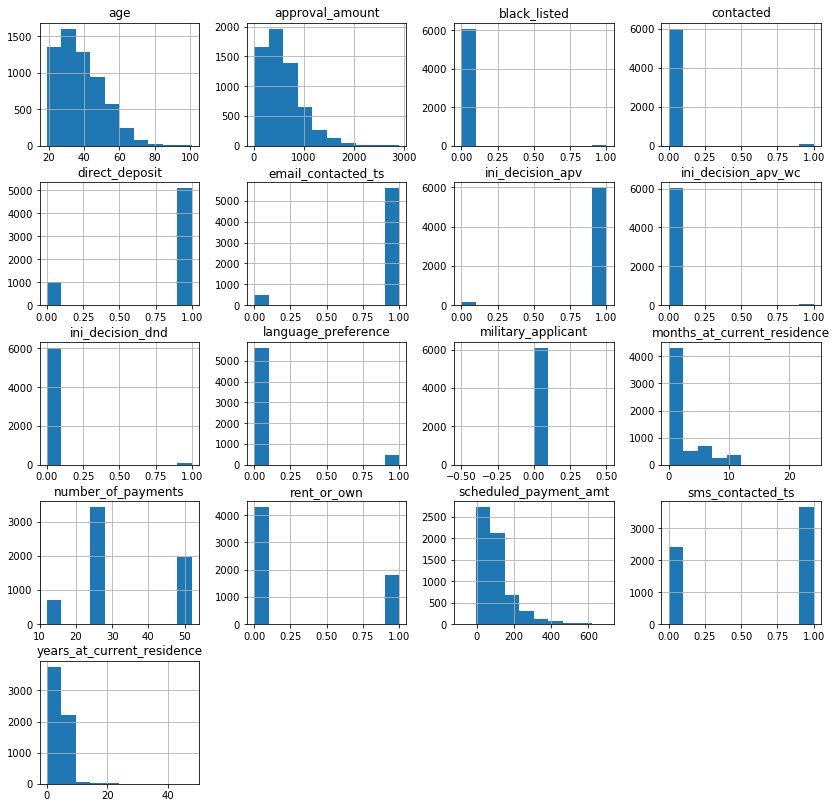

In [22]:
processed_data.hist(figsize=(14,14))
plt.show()

# Se normaliza el dataset
La normalizacion de los datos es muy importante para algoritmos de clasificación que son sensibles a datos que no siguen una misma distribución

In [23]:
from sklearn.preprocessing import MinMaxScaler

In [24]:
values = processed_data.values
scalar = MinMaxScaler(feature_range=(0, 1))
scalar = scalar.fit(values)
normalizeData = scalar.transform(values)
normalizeData[:3]

array([[ 0.08529006,  0.        ,  0.        ,  1.        ,  0.        ,
         0.04166667,  0.04166667,  1.        ,  0.        ,  0.        ,
         0.        ,  0.13074644,  1.        ,  0.14634146,  1.        ,
         0.        ,  0.        ],
       [ 0.0265884 ,  0.        ,  1.        ,  0.        ,  0.        ,
         0.        ,  0.02083333,  1.        ,  0.        ,  0.        ,
         0.        ,  0.14875037,  0.35      ,  0.02439024,  1.        ,
         0.        ,  0.        ],
       [ 0.32907459,  0.        ,  1.        ,  1.        ,  0.        ,
         0.        ,  0.02083333,  0.        ,  0.        ,  1.        ,
         0.        ,  0.64965441,  0.        ,  0.29268293,  1.        ,
         0.        ,  0.        ]])

In [25]:
normalize_data = pd.DataFrame(normalizeData,columns=processed_data.columns)

In [26]:
normalize_data.tail()

,approval_amount,contacted,email_contacted_ts,sms_contacted_ts,rent_or_own,months_at_current_residence,years_at_current_residence,direct_deposit,black_listed,language_preference,military_applicant,scheduled_payment_amt,number_of_payments,age,ini_decision_apv,ini_decision_apv_wc,ini_decision_dnd
6090,0.111188,0.0,1.0,1.0,0.0,0.375000,0.062500,1.0,0.0,0.0,0.0,0.131413,1.00,0.121951,1.0,0.0,0.0
6091,0.377417,0.0,1.0,1.0,0.0,0.250000,0.125000,0.0,0.0,0.0,0.0,0.196889,1.00,0.170732,1.0,0.0,0.0
6092,0.170925,0.0,1.0,1.0,0.0,0.000000,0.020833,1.0,0.0,0.0,0.0,0.211815,0.35,0.085366,1.0,0.0,0.0
6093,0.352555,0.0,1.0,1.0,1.0,0.000000,0.041667,1.0,0.0,0.0,0.0,0.307593,0.35,0.170732,1.0,0.0,0.0
6094,0.134323,0.0,1.0,1.0,1.0,0.458333,0.125000,1.0,0.0,0.0,0.0,0.188567,0.35,0.085366,1.0,0.0,0.0


In [27]:
normalize_data.head()

,approval_amount,contacted,email_contacted_ts,sms_contacted_ts,rent_or_own,months_at_current_residence,years_at_current_residence,direct_deposit,black_listed,language_preference,military_applicant,scheduled_payment_amt,number_of_payments,age,ini_decision_apv,ini_decision_apv_wc,ini_decision_dnd
0,0.085290,0.0,0.0,1.0,0.0,0.041667,0.041667,1.0,0.0,0.0,0.0,0.130746,1.00,0.146341,1.0,0.0,0.0
1,0.026588,0.0,1.0,0.0,0.0,0.000000,0.020833,1.0,0.0,0.0,0.0,0.148750,0.35,0.024390,1.0,0.0,0.0
2,0.329075,0.0,1.0,1.0,0.0,0.000000,0.020833,0.0,0.0,1.0,0.0,0.649654,0.00,0.292683,1.0,0.0,0.0
3,0.002072,0.0,0.0,1.0,0.0,0.458333,0.000000,0.0,0.0,0.0,0.0,0.129862,0.35,0.170732,1.0,0.0,0.0
4,0.085290,0.0,1.0,1.0,0.0,0.000000,0.125000,1.0,0.0,0.0,0.0,0.219086,0.35,0.231707,1.0,0.0,0.0


# Graficamos de Nuevo
Se grafican de nuevo las columnas para revisar que la normalizacion este adecuada,
Al observar la graficacion vemos que los datos siguen la misma distribución pero ahora de 0 a 1

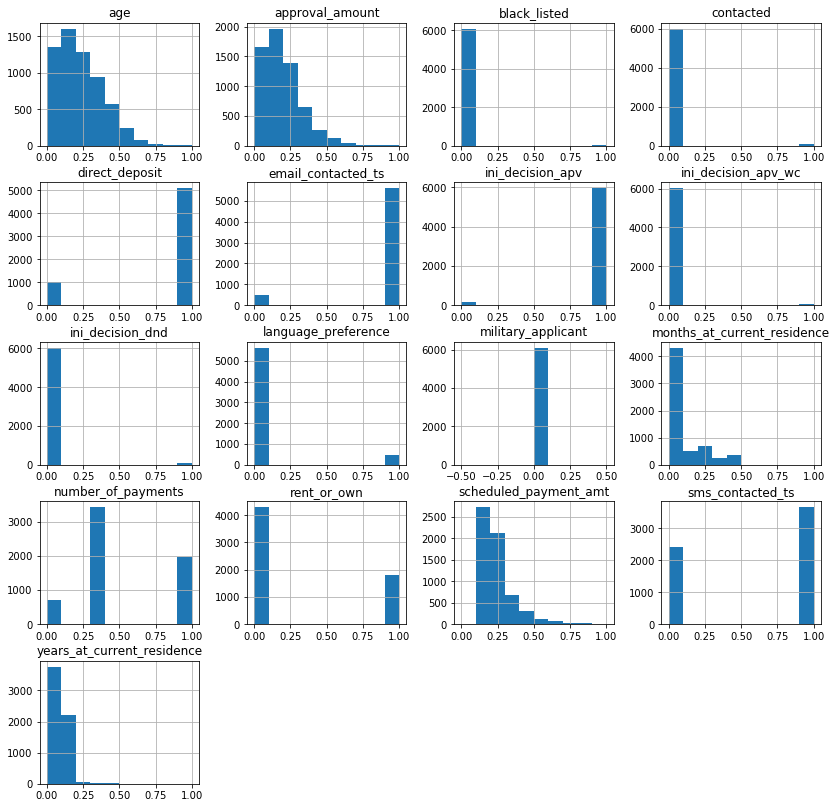

In [28]:
normalize_data.hist(figsize=(14,14))
plt.show()

# Se realiza balance de datos

Se realiza sustitución de datos booleanos

In [29]:
dfp_target.redeem_ts = dfp_target.redeem_ts.replace({True:1,False:0})

In [30]:
dfp_target[(dfp_target['redeem_ts']==1)].shape

(2595, 1)

In [31]:
dfp_target[(dfp_target['redeem_ts']==0)].shape

(3500, 1)

In [32]:
import numpy as np
redeem_true_index = np.where(dfp_target['redeem_ts']==1)[0]
redeem_false_index = np.where(dfp_target['redeem_ts']==0)[0]
redeem_true = normalize_data.loc[redeem_true_index]
redeem_false = normalize_data.loc[redeem_false_index[:len(redeem_true_index)]]
balance_data = pd.concat([redeem_true,redeem_false])

Se comprueba que la divición se haya realizado correctamente

In [33]:
normalize_data.head()

,approval_amount,contacted,email_contacted_ts,sms_contacted_ts,rent_or_own,months_at_current_residence,years_at_current_residence,direct_deposit,black_listed,language_preference,military_applicant,scheduled_payment_amt,number_of_payments,age,ini_decision_apv,ini_decision_apv_wc,ini_decision_dnd
0,0.085290,0.0,0.0,1.0,0.0,0.041667,0.041667,1.0,0.0,0.0,0.0,0.130746,1.00,0.146341,1.0,0.0,0.0
1,0.026588,0.0,1.0,0.0,0.0,0.000000,0.020833,1.0,0.0,0.0,0.0,0.148750,0.35,0.024390,1.0,0.0,0.0
2,0.329075,0.0,1.0,1.0,0.0,0.000000,0.020833,0.0,0.0,1.0,0.0,0.649654,0.00,0.292683,1.0,0.0,0.0
3,0.002072,0.0,0.0,1.0,0.0,0.458333,0.000000,0.0,0.0,0.0,0.0,0.129862,0.35,0.170732,1.0,0.0,0.0
4,0.085290,0.0,1.0,1.0,0.0,0.000000,0.125000,1.0,0.0,0.0,0.0,0.219086,0.35,0.231707,1.0,0.0,0.0


In [34]:
dfp_target.head()

,redeem_ts
0,1
1,1
2,1
3,1
4,1


In [35]:
redeem_false.head()

,approval_amount,contacted,email_contacted_ts,sms_contacted_ts,rent_or_own,months_at_current_residence,years_at_current_residence,direct_deposit,black_listed,language_preference,military_applicant,scheduled_payment_amt,number_of_payments,age,ini_decision_apv,ini_decision_apv_wc,ini_decision_dnd
2595,0.277279,0.0,0.0,0.0,1.0,0.000000,0.125000,1.0,0.0,0.0,0.0,0.273714,0.35,0.146341,1.0,0.0,0.0
2596,0.065608,0.0,1.0,1.0,0.0,0.166667,0.062500,1.0,0.0,0.0,0.0,0.245515,0.35,0.268293,1.0,0.0,0.0
2597,0.080110,0.0,1.0,1.0,1.0,0.000000,0.020833,1.0,0.0,0.0,0.0,0.312350,0.35,0.158537,1.0,0.0,0.0
2598,0.087017,0.0,1.0,1.0,1.0,0.458333,0.125000,0.0,0.0,0.0,0.0,0.146532,0.35,0.280488,1.0,0.0,0.0
2599,0.236533,0.0,1.0,1.0,0.0,0.000000,0.041667,1.0,0.0,0.0,0.0,0.221612,0.35,0.280488,1.0,0.0,0.0


Vemos el dataset balanceado

In [36]:
balance_data.shape

(5190, 17)

Create labels

In [37]:
redeem = dfp_target[(dfp_target['redeem_ts']==1)]
noRedeem = dfp_target[(dfp_target['redeem_ts']==0)]
labels = pd.concat([redeem,noRedeem[:redeem.shape[0]]])
print(labels)

      redeem_ts
0             1
1             1
2             1
3             1
4             1
5             1
6             1
7             1
8             1
9             1
10            1
11            1
12            1
13            1
14            1
15            1
16            1
17            1
18            1
19            1
20            1
21            1
22            1
23            1
24            1
25            1
26            1
27            1
28            1
29            1
...         ...
2565          0
2566          0
2567          0
2568          0
2569          0
2570          0
2571          0
2572          0
2573          0
2574          0
2575          0
2576          0
2577          0
2578          0
2579          0
2580          0
2581          0
2582          0
2583          0
2584          0
2585          0
2586          0
2587          0
2588          0
2589          0
2590          0
2591          0
2592          0
2593          0
2594          0

[5190 r

In [38]:
balance_data.head()

,approval_amount,contacted,email_contacted_ts,sms_contacted_ts,rent_or_own,months_at_current_residence,years_at_current_residence,direct_deposit,black_listed,language_preference,military_applicant,scheduled_payment_amt,number_of_payments,age,ini_decision_apv,ini_decision_apv_wc,ini_decision_dnd
0,0.085290,0.0,0.0,1.0,0.0,0.041667,0.041667,1.0,0.0,0.0,0.0,0.130746,1.00,0.146341,1.0,0.0,0.0
1,0.026588,0.0,1.0,0.0,0.0,0.000000,0.020833,1.0,0.0,0.0,0.0,0.148750,0.35,0.024390,1.0,0.0,0.0
2,0.329075,0.0,1.0,1.0,0.0,0.000000,0.020833,0.0,0.0,1.0,0.0,0.649654,0.00,0.292683,1.0,0.0,0.0
3,0.002072,0.0,0.0,1.0,0.0,0.458333,0.000000,0.0,0.0,0.0,0.0,0.129862,0.35,0.170732,1.0,0.0,0.0
4,0.085290,0.0,1.0,1.0,0.0,0.000000,0.125000,1.0,0.0,0.0,0.0,0.219086,0.35,0.231707,1.0,0.0,0.0


In [39]:
balance_data.tail()

,approval_amount,contacted,email_contacted_ts,sms_contacted_ts,rent_or_own,months_at_current_residence,years_at_current_residence,direct_deposit,black_listed,language_preference,military_applicant,scheduled_payment_amt,number_of_payments,age,ini_decision_apv,ini_decision_apv_wc,ini_decision_dnd
5185,0.280387,0.0,1.0,1.0,0.0,0.000000,0.041667,1.0,0.0,0.0,0.0,0.301899,0.35,0.341463,1.0,0.0,0.0
5186,0.093232,0.0,1.0,0.0,0.0,0.000000,0.062500,1.0,0.0,0.0,0.0,0.181655,0.35,0.329268,1.0,0.0,0.0
5187,0.174033,0.0,1.0,1.0,1.0,0.000000,0.125000,1.0,0.0,0.0,0.0,0.292320,0.00,0.231707,1.0,0.0,0.0
5188,0.072859,0.0,1.0,1.0,0.0,0.250000,0.000000,1.0,0.0,0.0,0.0,0.204775,0.35,0.134146,1.0,0.0,0.0
5189,0.187845,0.0,1.0,1.0,0.0,0.041667,0.000000,1.0,0.0,0.0,0.0,0.219330,0.35,0.134146,1.0,0.0,0.0


# Relaciones para visualizaciones de datos 

Pare este caso se utilizara el dataset no normalizado

In [40]:
import matplotlib.pyplot as plt

%matplotlib inline
plt.style.use('ggplot')

In [41]:
def plotPoints(data,indexT,indexF,xName,yName):
    X = np.array(data[[xName,yName]])
    redeem = X[indexT]
    noRedeem = X[indexF]
    plt.scatter([s[0] for s in redeem], [s[1] for s in redeem], s = 25, color = 'red', edgecolor = 'k')
    plt.scatter([s[0] for s in noRedeem], [s[1] for s in noRedeem], s = 25, color = 'cyan', edgecolor = 'k')
    plt.xlabel(xName)
    plt.ylabel(yName)
    plt.show()
    

In [42]:
def plotRelationsWithColumns(data,indexT,indexF):
    columns = data.columns
    for i in columns:
        for k in columns:
            if (i != k):
                print("Variables:",k,i)
                plotPoints(data,indexT,indexF[:len(indexT)],i,k)
    

In [43]:
withOutBalance = pd.DataFrame(processed_data.values,columns=processed_data.columns)
redeem_trueNN = withOutBalance.loc[redeem_true_index]
redeem_falseNN = withOutBalance.loc[redeem_false_index[:redeem_true_index.shape[0]]]
balance_data_no_norm = pd.concat([redeem_trueNN,redeem_falseNN])

balance_data_no_norm.shape

(5190, 17)

In [44]:
# plotRelationsWithColumns(balance_data_no_norm,redeem_true_index,redeem_false_index)

# Conclusión de las graficas

Realizando un analisis por medio de los graficos se puede concluir que la siguientes variables son las que presentan mayor dispersion comparandolas con las otras variables en el dataset, en total serian 6 variables 

Variables

black_listed

years_at_current_residence

last_payment_amount

approval_amount

age

months_at_current_residence


















# Forma individual de graficar dos variables en el dataset

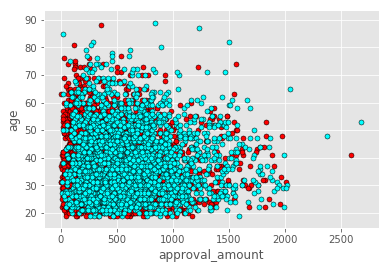

In [45]:

x = 'approval_amount'
y = 'age'
plotPoints(balance_data_no_norm,redeem_true_index,redeem_false_index[:len(redeem_true_index)],x,y)


In [46]:
balance_data.isna().mean().round(4) * 100

approval_amount                0.0
contacted                      0.0
email_contacted_ts             0.0
sms_contacted_ts               0.0
rent_or_own                    0.0
months_at_current_residence    0.0
years_at_current_residence     0.0
direct_deposit                 0.0
black_listed                   0.0
language_preference            0.0
military_applicant             0.0
scheduled_payment_amt          0.0
number_of_payments             0.0
age                            0.0
ini_decision_apv               0.0
ini_decision_apv_wc            0.0
ini_decision_dnd               0.0
dtype: float64

# Obteniendo variables relevantes con RandomForest

In [47]:
from sklearn.ensemble import RandomForestClassifier
RandomForestModel = RandomForestClassifier(min_samples_leaf=3,min_samples_split=20,n_estimators=500, max_depth= None, random_state=10)

In [48]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


In [49]:
X_train, X_test, y_train, y_test = train_test_split(balance_data,labels.redeem_ts,test_size=0.15,random_state=13)

In [50]:
from sklearn.ensemble import RandomForestClassifier
RandomForestModel = RandomForestClassifier(min_samples_leaf=3,min_samples_split=20,n_estimators=500, max_depth= None, random_state=10)
RandomForestModel.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=3, min_samples_split=20,
            min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=None,
            oob_score=False, random_state=10, verbose=0, warm_start=False)

In [51]:
importances = pd.DataFrame({'feature' :balance_data.columns, 'importance':RandomForestModel.feature_importances_})

In [52]:
importances = importances.sort_values('importance', ascending = False).set_index('feature')
importances

,importance
feature,
approval_amount,0.352113
scheduled_payment_amt,0.205170
age,0.132202
years_at_current_residence,0.071364
months_at_current_residence,0.059585
sms_contacted_ts,0.052791
number_of_payments,0.040043
email_contacted_ts,0.028508
direct_deposit,0.016822


# Segunda Limpieza de datos

In [53]:
df1.isna().mean().round(4) 

id                             0.0000
approval_amount                0.0000
recommendation                 0.0000
redeem_ts                      0.5742
contacted                      0.0000
email_contacted_ts             0.0786
sms_contacted_ts               0.3993
birth_dt                       0.0000
state                          0.0000
city                           0.0003
zip_code                       0.0000
rent_or_own                    0.0000
months_at_current_residence    0.0000
years_at_current_residence     0.0000
direct_deposit                 0.0028
black_listed                   0.0000
language_preference            0.0000
military_applicant             0.0000
payment_frequency              0.0000
scheduled_payment_amt          0.0000
past_due_amt                   0.0000
account_payment_method         0.0000
collections_category           0.4167
days_past_due                  0.0000
number_of_payments             0.0000
amount_financed                0.5316
data_correct

# Eliminación de variables

## Borrar por faltante de datos:

collections_category

amount_financed

last_payment_amount

## Borrar datos innecesarios

id

merchant_id

## Borrar por analisis con graficas y Random Forest

contacted

black_listed

military_applicant



In [54]:
secondDfp = df1.drop(columns=['collections_category','amount_financed','last_payment_amount','black_listed','military_applicant','id','merchant_id'])

In [55]:
secondDfp.columns.shape

(24,)

In [56]:
secondDfp.isna().mean().round(4) 

approval_amount                0.0000
recommendation                 0.0000
redeem_ts                      0.5742
contacted                      0.0000
email_contacted_ts             0.0786
sms_contacted_ts               0.3993
birth_dt                       0.0000
state                          0.0000
city                           0.0003
zip_code                       0.0000
rent_or_own                    0.0000
months_at_current_residence    0.0000
years_at_current_residence     0.0000
direct_deposit                 0.0028
language_preference            0.0000
payment_frequency              0.0000
scheduled_payment_amt          0.0000
past_due_amt                   0.0000
account_payment_method         0.0000
days_past_due                  0.0000
number_of_payments             0.0000
data_correction                0.0000
source                         0.0000
initial_decision               0.0000
dtype: float64

In [57]:
# Convertimos variables nulas y datos importantes mencionados anteriormente

In [58]:
secondDfp.loc[~secondDfp.email_contacted_ts.isnull(),"email_contacted_ts"]=True 
secondDfp.loc[~secondDfp.sms_contacted_ts.isnull(),"sms_contacted_ts"]=True 
secondDfp.loc[~secondDfp.direct_deposit.isnull(),"direct_deposit"]=True 
secondDfp.loc[~secondDfp.redeem_ts.isnull(),"redeem_ts"]=True 
secondDfp["email_contacted_ts"].fillna(False, inplace = True) 
secondDfp["sms_contacted_ts"].fillna(False, inplace = True)
secondDfp["direct_deposit"].fillna(False, inplace = True)
secondDfp["redeem_ts"].fillna(False, inplace = True) 
secondDfp.head()

,approval_amount,recommendation,redeem_ts,contacted,email_contacted_ts,sms_contacted_ts,birth_dt,state,city,zip_code,...,language_preference,payment_frequency,scheduled_payment_amt,past_due_amt,account_payment_method,days_past_due,number_of_payments,data_correction,source,initial_decision
0,250.0,APPROVE,True,False,False,True,1988-05-21,CO,Aurora,80012,...,EN,WEEKLY,18.84,0.0,MANUAL,0,52,False,MERCHANT,APPROVED
1,80.0,APPROVE,True,False,True,False,1998-01-13,TX,Weatherford,76086,...,EN,BI_WEEKLY,32.88,0.0,MANUAL,0,26,False,INTERNET,APPROVED
2,956.0,APPROVE,True,False,True,True,1975-12-09,WA,Othello,99344,...,ES,MONTHLY,423.50,0.0,MANUAL,0,12,False,MERCHANT,APPROVED
3,9.0,APPROVE,True,False,False,True,1985-09-09,CA,Imperial,92251,...,EN,BI_WEEKLY,18.15,0.0,MANUAL,0,26,False,MERCHANT,APPROVED
4,250.0,APPROVE,True,False,True,True,1980-11-23,OH,Cleveland,44105,...,EN,BI_WEEKLY,87.73,0.0,MANUAL,0,26,False,MERCHANT,APPROVED


In [59]:
for i in secondDfp["email_contacted_ts"]:
    print(i)

False
True
True
False
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
False
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
False
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
False
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
False
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
False
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
False
True
True
True
True
True
True
True
True
True
True
True
False
True
True
True
True
True
True
True
True
True
False
True
True
True
True
True
True
True
True
True
True
True


True
True
True
True
True
True
True
True
True
True
True
True
False
True
True
True
True
False
True
False
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
False
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
False
True
False
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
False
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
False
True
True
False
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
T

True
False
True
True
True
True
True
True
True
True
False
True
True
True
True
True
True
True
True
False
True
False
False
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
False
True
True
True
True
True
False
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
False
True
True
False
True
True
True
False
True
True
True
True
True
True
True
False
False
True
False
True
True
True
True
True
True
True
True
True
True
False
False
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
False
True
True
False
True
True
True
True
True
True
True
True
True
True
True
True
True
True
False
True
False
True
True
True
True
True
True
True
True
True
True
True
True
False
True
True
True
False
True
True
True
True
True
False
True
True
True
True
True
False
True
True
True
True
True
False
True
True
True
True
False
True
True
True
True
True
True
False
True
True
False
True
True
Tru

True
True
True
True
True
True
True
True
True
True
True
True
False
True
False
True
False
True
True
True
True
True
True
True
True
True
True
False
True
True
True
True
True
True
True
False
True
True
True
True
True
True
True
True
True
True
True
True
True
False
True
True
True
True
True
True
True
False
True
False
True
True
False
True
True
True
True
True
True
True
True
True
True
True
True
True
False
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
False
True
True
True
True
True
True
True
True
True
True
True
True
True
False
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
False
True
True
True
True
True
True
True
True
True
True
False
True
True
True
True
True
False
True
True
True
True
True
False
True
True
True
True
True
True
False
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
Tru

In [60]:
# convertimos la columna birth_dt a age

In [61]:
now = pd.Timestamp('now')
secondDfp['birth_dt'] = pd.to_datetime(secondDfp['birth_dt'])   
secondDfp['age'] = (now - secondDfp['birth_dt']).astype('<m8[Y]') 
secondDfp = secondDfp.drop(columns=['birth_dt'])

In [62]:
secondDfp.isna().mean().round(4) 

approval_amount                0.0000
recommendation                 0.0000
redeem_ts                      0.0000
contacted                      0.0000
email_contacted_ts             0.0000
sms_contacted_ts               0.0000
state                          0.0000
city                           0.0003
zip_code                       0.0000
rent_or_own                    0.0000
months_at_current_residence    0.0000
years_at_current_residence     0.0000
direct_deposit                 0.0000
language_preference            0.0000
payment_frequency              0.0000
scheduled_payment_amt          0.0000
past_due_amt                   0.0000
account_payment_method         0.0000
days_past_due                  0.0000
number_of_payments             0.0000
data_correction                0.0000
source                         0.0000
initial_decision               0.0000
age                            0.0000
dtype: float64

In [63]:
# Para este caso como se indica anteriormente la columna "redeem_ts" seria nuestros labels

In [64]:
secondDfp.isna().mean().round(4)

approval_amount                0.0000
recommendation                 0.0000
redeem_ts                      0.0000
contacted                      0.0000
email_contacted_ts             0.0000
sms_contacted_ts               0.0000
state                          0.0000
city                           0.0003
zip_code                       0.0000
rent_or_own                    0.0000
months_at_current_residence    0.0000
years_at_current_residence     0.0000
direct_deposit                 0.0000
language_preference            0.0000
payment_frequency              0.0000
scheduled_payment_amt          0.0000
past_due_amt                   0.0000
account_payment_method         0.0000
days_past_due                  0.0000
number_of_payments             0.0000
data_correction                0.0000
source                         0.0000
initial_decision               0.0000
age                            0.0000
dtype: float64

In [65]:
secondDfp = secondDfp.dropna()
secondDfp.shape

(6093, 24)

In [66]:
secondDfp.isna().mean().round(4)

approval_amount                0.0
recommendation                 0.0
redeem_ts                      0.0
contacted                      0.0
email_contacted_ts             0.0
sms_contacted_ts               0.0
state                          0.0
city                           0.0
zip_code                       0.0
rent_or_own                    0.0
months_at_current_residence    0.0
years_at_current_residence     0.0
direct_deposit                 0.0
language_preference            0.0
payment_frequency              0.0
scheduled_payment_amt          0.0
past_due_amt                   0.0
account_payment_method         0.0
days_past_due                  0.0
number_of_payments             0.0
data_correction                0.0
source                         0.0
initial_decision               0.0
age                            0.0
dtype: float64

In [67]:
secondDfp.tail()

,approval_amount,recommendation,redeem_ts,contacted,email_contacted_ts,sms_contacted_ts,state,city,zip_code,rent_or_own,...,payment_frequency,scheduled_payment_amt,past_due_amt,account_payment_method,days_past_due,number_of_payments,data_correction,source,initial_decision,age
3495,325.0,APPROVE,False,False,True,True,CT,Avon,6001,RENT,...,WEEKLY,19.36,402.08,MANUAL,145,52,False,MERCHANT,APPROVED,29.0
3496,1096.0,APPROVE,False,False,True,True,NY,Brooklyn,11239,RENT,...,WEEKLY,70.42,0.00,MANUAL,0,52,False,MERCHANT,APPROVED,33.0
3497,498.0,APPROVE,False,False,True,True,CA,San Diego,92105,RENT,...,BI_WEEKLY,82.06,782.66,MANUAL,133,26,False,MERCHANT,APPROVED,26.0
3498,1024.0,APPROVE,False,False,True,True,NV,Las Vegas,89104,OWN,...,BI_WEEKLY,156.75,1724.25,MANUAL,154,26,False,MERCHANT,APPROVED,33.0
3499,392.0,APPROVE,False,False,True,True,FL,Orlando,32811,OWN,...,BI_WEEKLY,63.93,0.00,MANUAL,0,26,False,SMS,APPROVED,26.0


# Tranformación de variables categoricas

## Explicación
Para probar el random forest para detectar las variables mas importantes, tranfomaremos las variables categoricas de forma ordinal, ya que los desicion tree de se ven afectados pro datos categoricos tranformados de esta forma

In [68]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OrdinalEncoder

In [69]:
secondDfp['recommendation'].unique()

array(['APPROVE', 'DENY'], dtype=object)

In [70]:
secondDfp.recommendation.values.reshape(-1, 1)

array([['APPROVE'],
       ['APPROVE'],
       ['APPROVE'],
       ..., 
       ['APPROVE'],
       ['APPROVE'],
       ['APPROVE']], dtype=object)

In [71]:
encoder = OrdinalEncoder()
secondDfp.recommendation = encoder.fit_transform(secondDfp.recommendation.values.reshape(-1, 1))
secondDfp

,approval_amount,recommendation,redeem_ts,contacted,email_contacted_ts,sms_contacted_ts,state,city,zip_code,rent_or_own,...,payment_frequency,scheduled_payment_amt,past_due_amt,account_payment_method,days_past_due,number_of_payments,data_correction,source,initial_decision,age
0,250.0,0.0,True,False,False,True,CO,Aurora,80012,RENT,...,WEEKLY,18.84,0.00,MANUAL,0,52,False,MERCHANT,APPROVED,31.0
1,80.0,0.0,True,False,True,False,TX,Weatherford,76086,RENT,...,BI_WEEKLY,32.88,0.00,MANUAL,0,26,False,INTERNET,APPROVED,21.0
2,956.0,0.0,True,False,True,True,WA,Othello,99344,RENT,...,MONTHLY,423.50,0.00,MANUAL,0,12,False,MERCHANT,APPROVED,43.0
3,9.0,0.0,True,False,False,True,CA,Imperial,92251,RENT,...,BI_WEEKLY,18.15,0.00,MANUAL,0,26,False,MERCHANT,APPROVED,33.0
4,250.0,0.0,True,False,True,True,OH,Cleveland,44105,RENT,...,BI_WEEKLY,87.73,0.00,MANUAL,0,26,False,MERCHANT,APPROVED,38.0
5,88.0,0.0,True,False,True,True,CA,West Covina,91791,RENT,...,BI_WEEKLY,14.70,0.00,MANUAL,0,26,False,MERCHANT,APPROVED,36.0
6,501.0,0.0,True,False,True,True,TX,Hockley,77447,OWN,...,BI_WEEKLY,75.47,0.00,MANUAL,0,26,False,MERCHANT,APPROVED,57.0
7,693.0,0.0,True,False,True,False,CA,El Cajon,92020,RENT,...,WEEKLY,47.46,0.00,MANUAL,0,52,False,INTERNET,APPROVED,27.0
8,459.0,0.0,True,False,True,True,PA,Philadelphia,19122,RENT,...,BI_WEEKLY,61.87,0.00,MANUAL,0,26,False,MERCHANT,APPROVED,35.0
9,273.0,0.0,True,False,True,True,PA,Allentown,18102,RENT,...,MONTHLY_WEEK,85.30,0.00,MANUAL,0,12,False,SNAP_FINANCE_COM,APPROVED,52.0


In [72]:
secondDfp.redeem_ts = encoder.fit_transform(secondDfp.redeem_ts.values.reshape(-1, 1))
secondDfp.contacted = encoder.fit_transform(secondDfp.contacted.values.reshape(-1, 1))
secondDfp.email_contacted_ts = encoder.fit_transform(secondDfp.email_contacted_ts.values.reshape(-1, 1))
secondDfp.sms_contacted_ts = encoder.fit_transform(secondDfp.sms_contacted_ts.values.reshape(-1, 1))
secondDfp.state = encoder.fit_transform(secondDfp.state.values.reshape(-1, 1))
secondDfp.city = encoder.fit_transform(secondDfp.city.values.reshape(-1, 1))
secondDfp.payment_frequency = encoder.fit_transform(secondDfp.payment_frequency.values.reshape(-1, 1))
secondDfp.rent_or_own = encoder.fit_transform(secondDfp.rent_or_own.values.reshape(-1, 1))
secondDfp.account_payment_method = encoder.fit_transform(secondDfp.account_payment_method.values.reshape(-1, 1))
secondDfp.data_correction = encoder.fit_transform(secondDfp.data_correction.values.reshape(-1, 1))
secondDfp.source = encoder.fit_transform(secondDfp.source.values.reshape(-1, 1))
secondDfp.initial_decision = encoder.fit_transform(secondDfp.initial_decision.values.reshape(-1, 1))
secondDfp.direct_deposit = encoder.fit_transform(secondDfp.direct_deposit.values.reshape(-1, 1))
secondDfp.language_preference = encoder.fit_transform(secondDfp.language_preference.values.reshape(-1, 1))
secondDfp.head()

,approval_amount,recommendation,redeem_ts,contacted,email_contacted_ts,sms_contacted_ts,state,city,zip_code,rent_or_own,...,payment_frequency,scheduled_payment_amt,past_due_amt,account_payment_method,days_past_due,number_of_payments,data_correction,source,initial_decision,age
0,250.0,0.0,1.0,0.0,0.0,1.0,5.0,73.0,80012,1.0,...,4.0,18.84,0.0,2.0,0,52,0.0,2.0,0.0,31.0
1,80.0,0.0,1.0,0.0,1.0,0.0,41.0,1590.0,76086,1.0,...,0.0,32.88,0.0,2.0,0,26,0.0,0.0,0.0,21.0
2,956.0,0.0,1.0,0.0,1.0,1.0,45.0,1086.0,99344,1.0,...,1.0,423.50,0.0,2.0,0,12,0.0,2.0,0.0,43.0
3,9.0,0.0,1.0,0.0,0.0,1.0,4.0,684.0,92251,1.0,...,0.0,18.15,0.0,2.0,0,26,0.0,2.0,0.0,33.0
4,250.0,0.0,1.0,0.0,1.0,1.0,33.0,264.0,44105,1.0,...,0.0,87.73,0.0,2.0,0,26,0.0,2.0,0.0,38.0


In [73]:
secondDfp.tail()

,approval_amount,recommendation,redeem_ts,contacted,email_contacted_ts,sms_contacted_ts,state,city,zip_code,rent_or_own,...,payment_frequency,scheduled_payment_amt,past_due_amt,account_payment_method,days_past_due,number_of_payments,data_correction,source,initial_decision,age
3495,325.0,0.0,0.0,0.0,1.0,1.0,6.0,76.0,6001,1.0,...,4.0,19.36,402.08,2.0,145,52,0.0,2.0,0.0,29.0
3496,1096.0,0.0,0.0,0.0,1.0,1.0,32.0,162.0,11239,1.0,...,4.0,70.42,0.00,2.0,0,52,0.0,2.0,0.0,33.0
3497,498.0,0.0,0.0,0.0,1.0,1.0,4.0,1320.0,92105,1.0,...,0.0,82.06,782.66,2.0,133,26,0.0,2.0,0.0,26.0
3498,1024.0,0.0,0.0,0.0,1.0,1.0,31.0,790.0,89104,0.0,...,0.0,156.75,1724.25,2.0,154,26,0.0,2.0,0.0,33.0
3499,392.0,0.0,0.0,0.0,1.0,1.0,9.0,1083.0,32811,0.0,...,0.0,63.93,0.00,2.0,0,26,0.0,5.0,0.0,26.0


In [74]:
# Volvemos a balancear los datos

In [75]:
redeem = secondDfp[(secondDfp['redeem_ts'] == 1)]
noRedeem = secondDfp[(secondDfp['redeem_ts'] == 0)]

In [76]:
print(redeem.shape,noRedeem.shape)

((2595, 24), (3498, 24))


In [77]:
secondBalanceDataset = pd.concat([redeem,noRedeem.sample(redeem.shape[0])])
for i in secondBalanceDataset.columns:
    print(i)
    print(secondBalanceDataset[i].head())
        

approval_amount
0    250.0
1     80.0
2    956.0
3      9.0
4    250.0
Name: approval_amount, dtype: float64
recommendation
0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: recommendation, dtype: float64
redeem_ts
0    1.0
1    1.0
2    1.0
3    1.0
4    1.0
Name: redeem_ts, dtype: float64
contacted
0    0.0
1    0.0
2    0.0
3    0.0
4    0.0
Name: contacted, dtype: float64
email_contacted_ts
0    0.0
1    1.0
2    1.0
3    0.0
4    1.0
Name: email_contacted_ts, dtype: float64
sms_contacted_ts
0    1.0
1    0.0
2    1.0
3    1.0
4    1.0
Name: sms_contacted_ts, dtype: float64
state
0     5.0
1    41.0
2    45.0
3     4.0
4    33.0
Name: state, dtype: float64
city
0      73.0
1    1590.0
2    1086.0
3     684.0
4     264.0
Name: city, dtype: float64
zip_code
0    80012
1    76086
2    99344
3    92251
4    44105
Name: zip_code, dtype: int64
rent_or_own
0    1.0
1    1.0
2    1.0
3    1.0
4    1.0
Name: rent_or_own, dtype: float64
months_at_current_residence
0     1
1     0
2     0
3 

# Probamos de nuevo el random Forest

In [78]:
labels = secondBalanceDataset['redeem_ts']
features = secondBalanceDataset.drop(columns=['redeem_ts'])

In [79]:
X_train, X_test, y_train, y_test = train_test_split(features,labels,test_size=0.15,random_state=13)

In [80]:
RandomForestModel = RandomForestClassifier(min_samples_leaf=3,min_samples_split=20,n_estimators=500, max_depth= None, random_state=10)
RandomForestModel.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=3, min_samples_split=20,
            min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=None,
            oob_score=False, random_state=10, verbose=0, warm_start=False)

In [81]:
importances = pd.DataFrame({'feature' : features.columns, 'importance':RandomForestModel.feature_importances_})

In [82]:
importances = importances.sort_values('importance', ascending = False).set_index('feature')
importances

,importance
feature,
account_payment_method,0.196451
approval_amount,0.183724
scheduled_payment_amt,0.081139
days_past_due,0.072349
past_due_amt,0.066513
zip_code,0.061482
city,0.058811
age,0.055520
sms_contacted_ts,0.043231


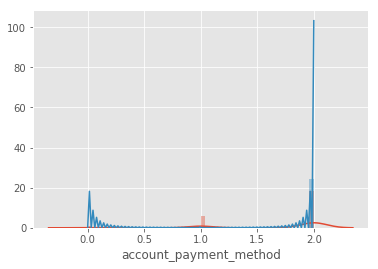

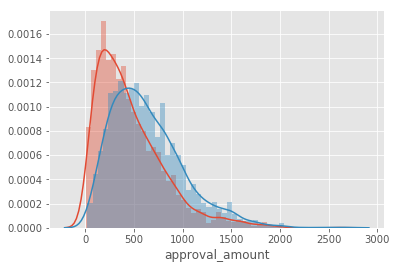

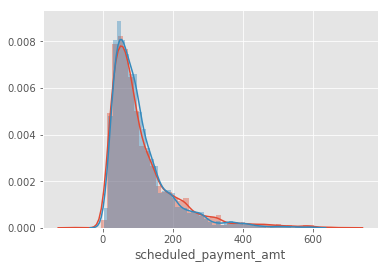

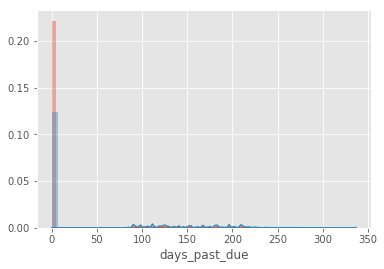

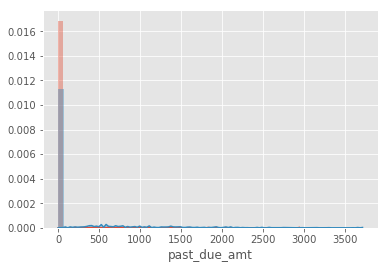

...

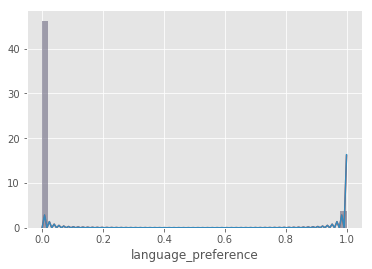

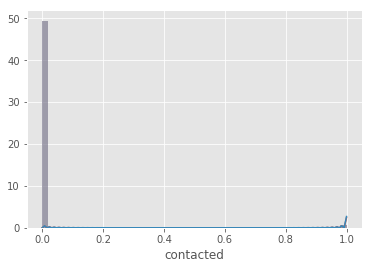

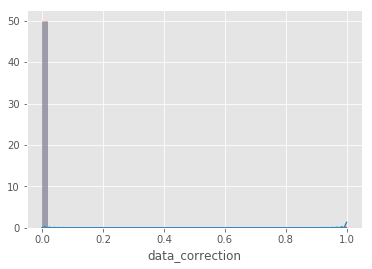

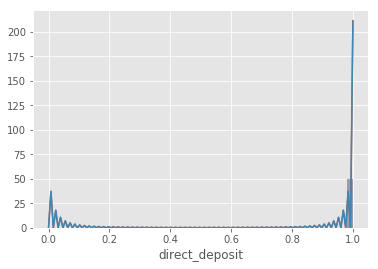

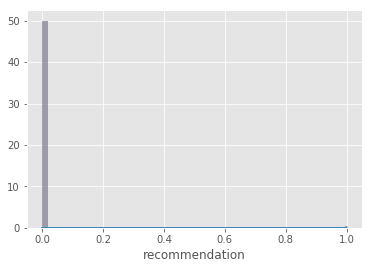

In [83]:
from matplotlib import pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D 
from matplotlib import gridspec

plt.style.use('ggplot')

# plt.figure(figsize=(12,28))
gs = gridspec.GridSpec(28, 1)
for i,cn in enumerate(importances.index):
    sns.distplot(secondBalanceDataset[cn][secondBalanceDataset.redeem_ts == 1], bins=50)
    sns.distplot(secondBalanceDataset[cn][secondBalanceDataset.redeem_ts == 0], bins=50)
#     ax.set_xlabel('')
#     ax.set_title('histogram of feature: ' + str(cn))
    plt.show()

In [84]:
# Let's plot the Transaction class against the Frequency

def plotHistrogram(features):
    for i in features:
        print(i)
        classes = pd.value_counts(secondBalanceDataset[i][secondBalanceDataset.redeem_ts == 1], sort = True)
        classes.plot(kind = 'bar', rot=0)
        plt.title("redeem")
        plt.xlabel("atribute")
        plt.ylabel("Frequency")
        plt.show()

        classes = pd.value_counts(secondBalanceDataset[i][secondBalanceDataset.redeem_ts == 0], sort = True)
        classes.plot(kind = 'bar', rot=0)
        plt.title("no redeem")
        plt.xlabel("atribute")
        plt.ylabel("Frequency")
        plt.show()


account_payment_method


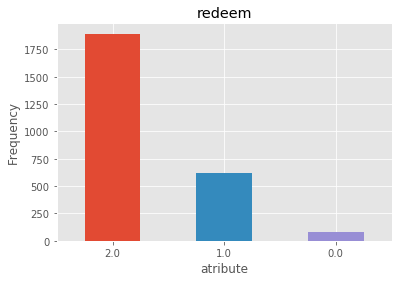

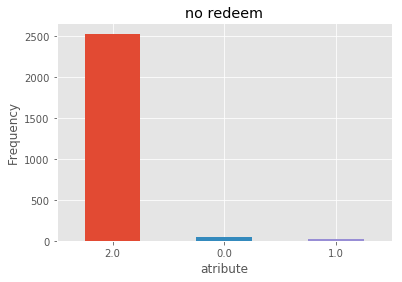

approval_amount


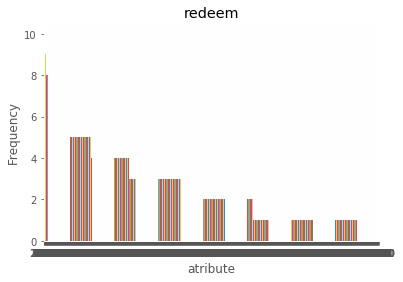

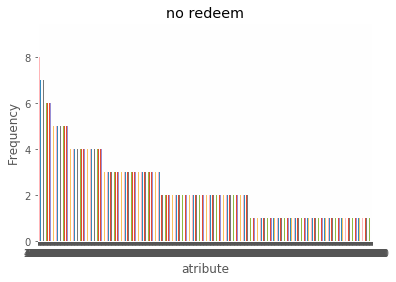

scheduled_payment_amt


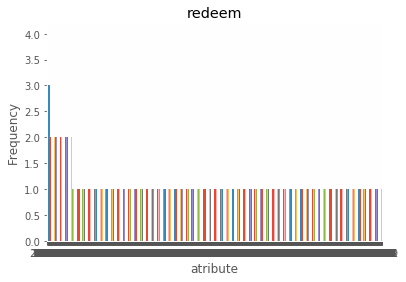

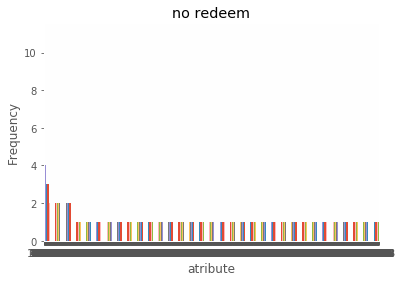

days_past_due


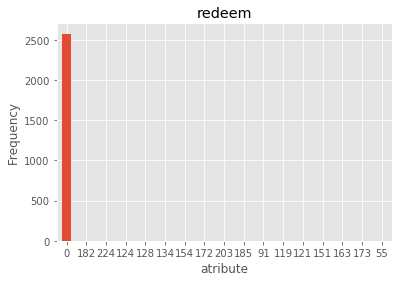

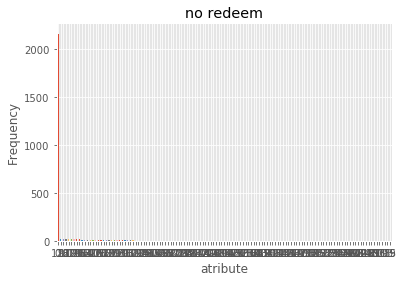

past_due_amt


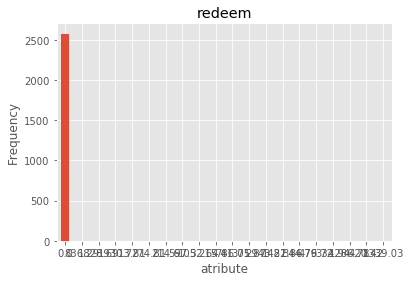

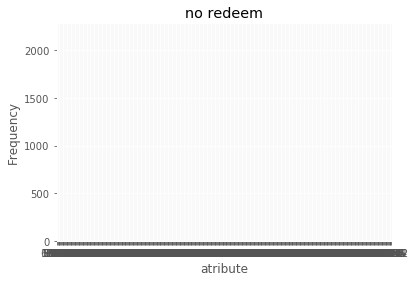

zip_code


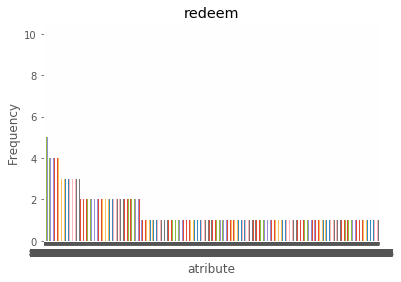

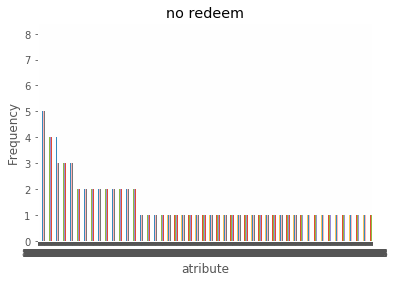

city


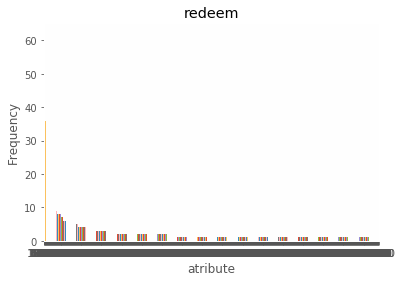

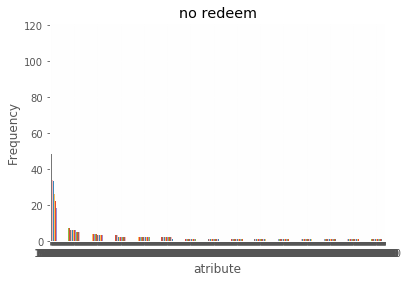

age


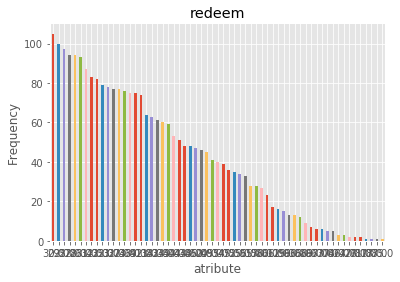

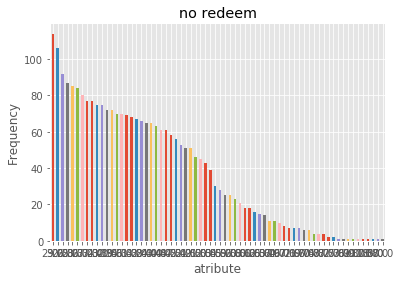

sms_contacted_ts


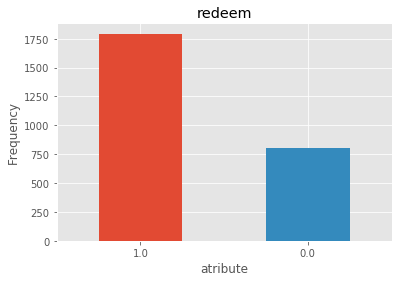

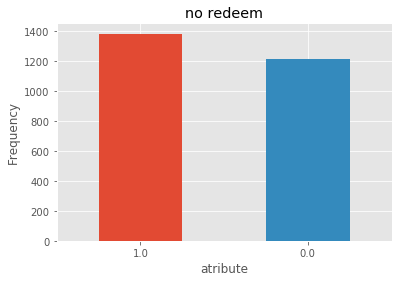

state


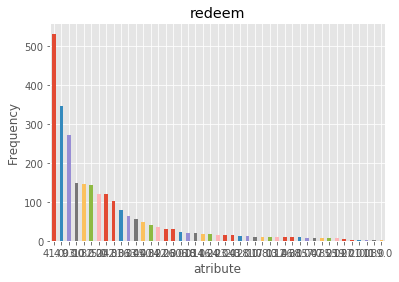

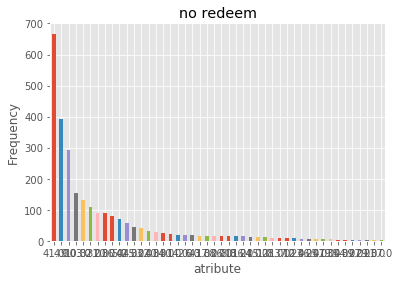

years_at_current_residence


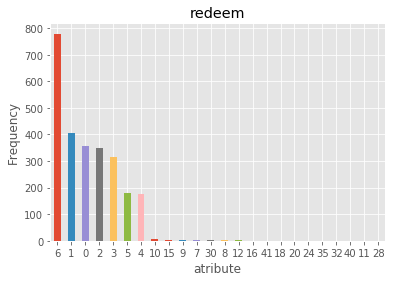

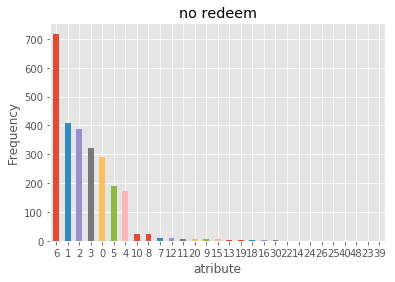

months_at_current_residence


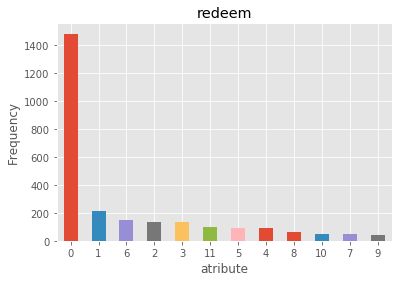

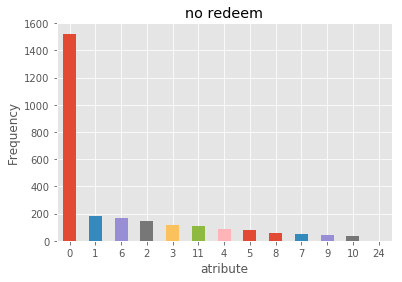

source


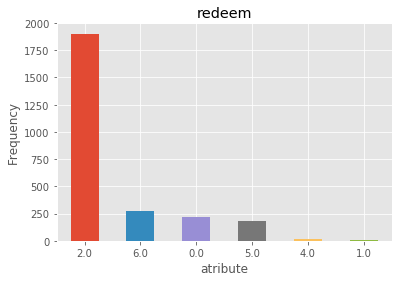

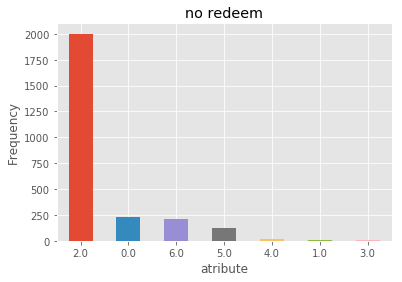

payment_frequency


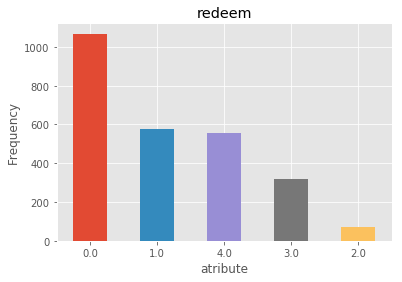

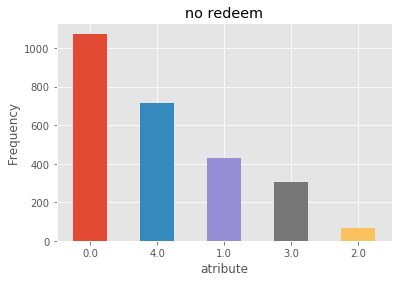

email_contacted_ts


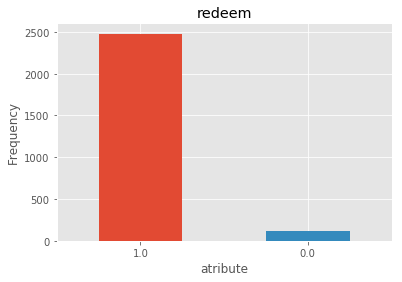

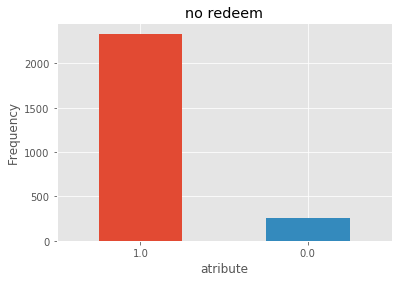

number_of_payments


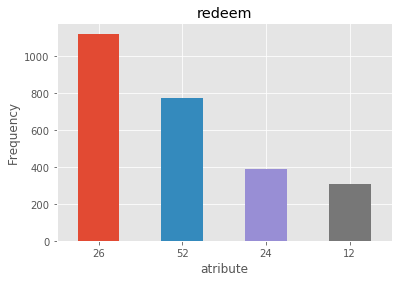

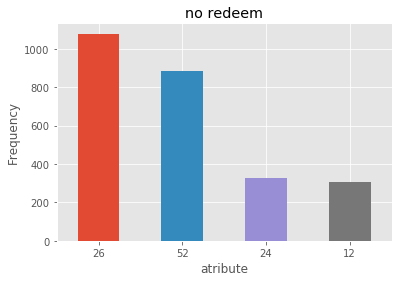

rent_or_own


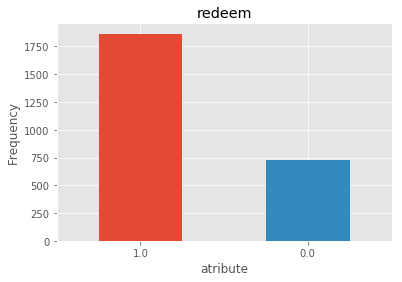

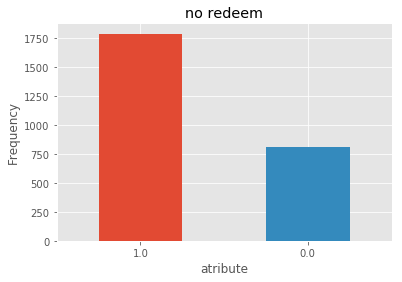

initial_decision


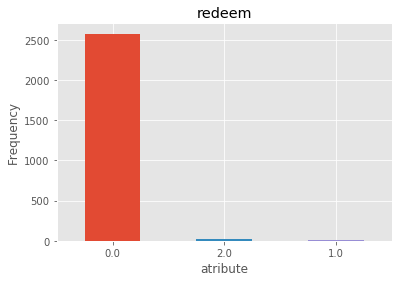

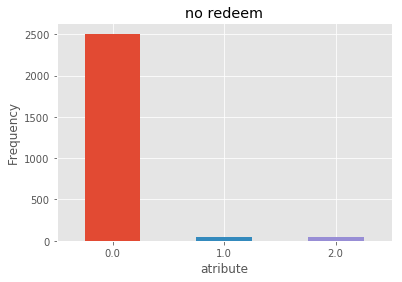

language_preference


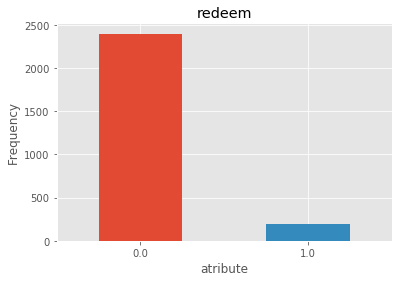

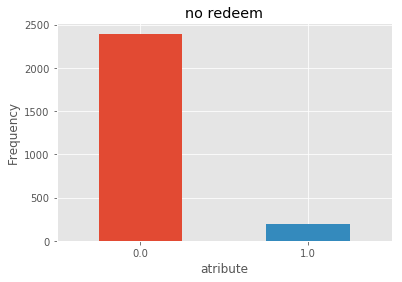

contacted


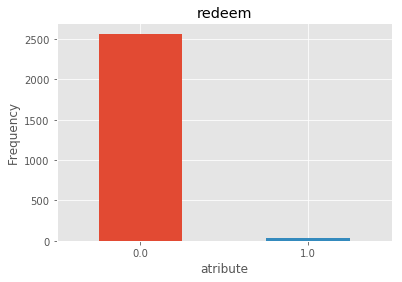

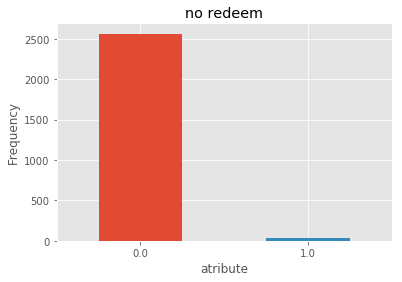

data_correction


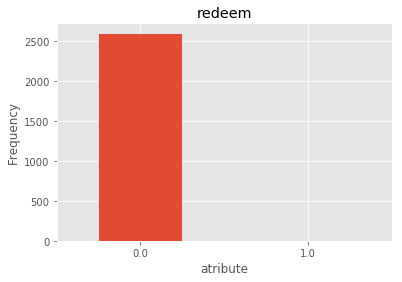

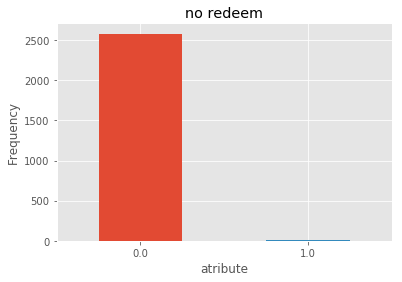

direct_deposit


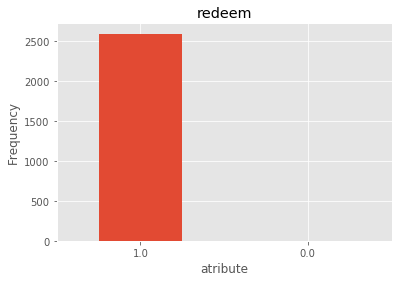

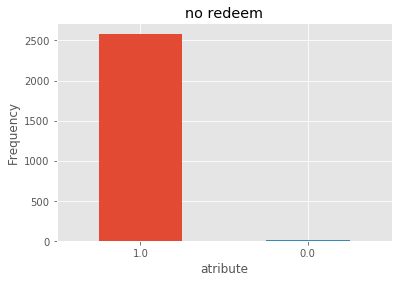

recommendation


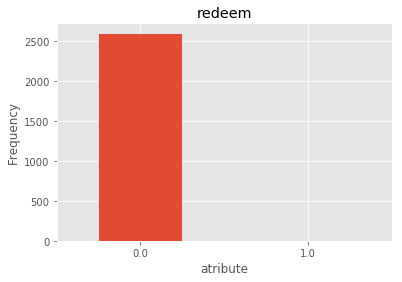

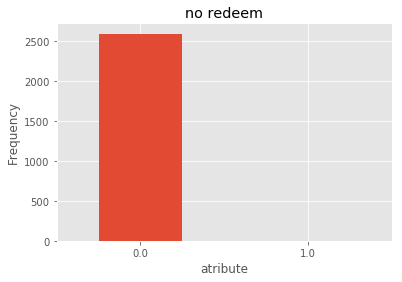

In [85]:
plotHistrogram(importances.index)

In [86]:
redeem_true_indexSecond = np.where(secondBalanceDataset['redeem_ts']==1)[0]
redeem_false_indexSecond = np.where(secondBalanceDataset['redeem_ts']==0)[0]

('Variables:', 'recommendation', 'approval_amount')


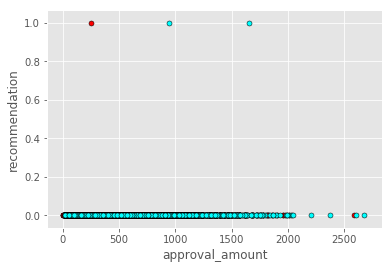

('Variables:', 'contacted', 'approval_amount')


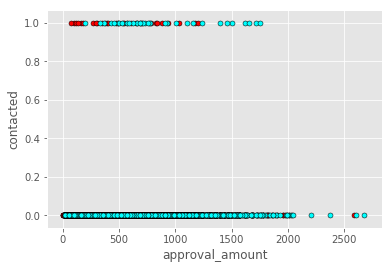

('Variables:', 'email_contacted_ts', 'approval_amount')


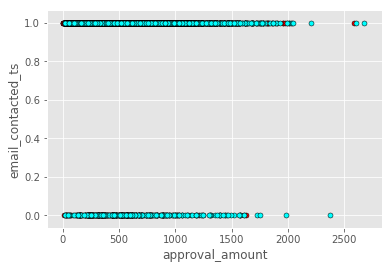

('Variables:', 'sms_contacted_ts', 'approval_amount')


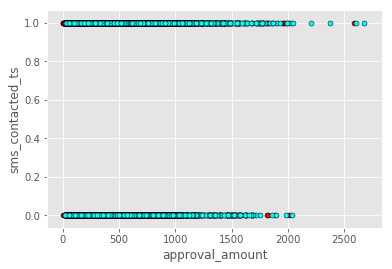

('Variables:', 'state', 'approval_amount')


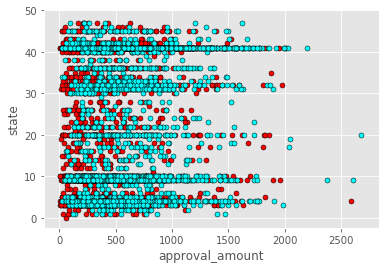

('Variables:', 'city', 'approval_amount')


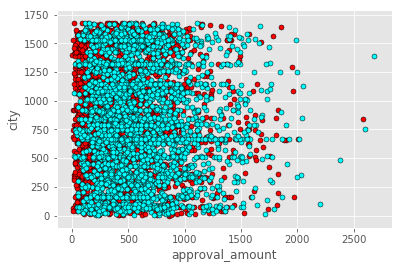

('Variables:', 'zip_code', 'approval_amount')


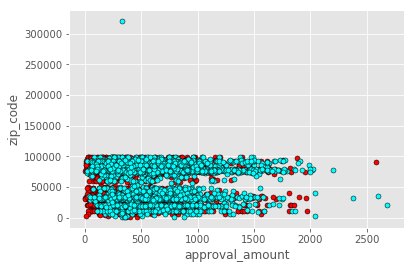

('Variables:', 'rent_or_own', 'approval_amount')


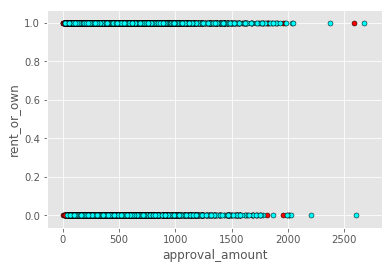

('Variables:', 'months_at_current_residence', 'approval_amount')


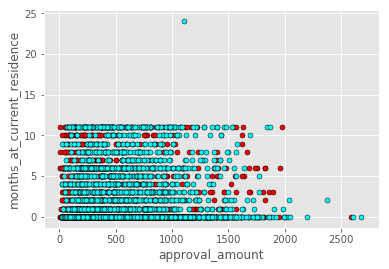

('Variables:', 'years_at_current_residence', 'approval_amount')


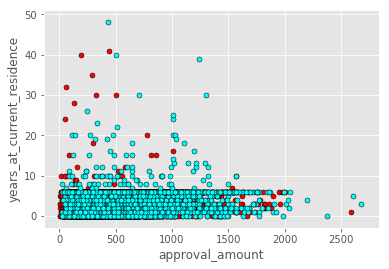

('Variables:', 'direct_deposit', 'approval_amount')


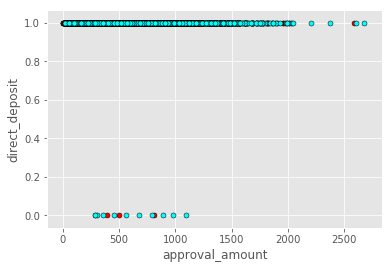

('Variables:', 'language_preference', 'approval_amount')


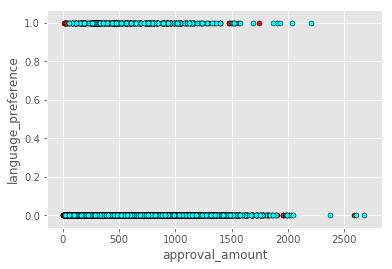

('Variables:', 'payment_frequency', 'approval_amount')


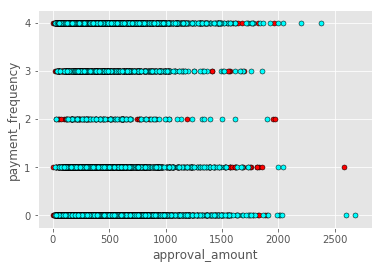

('Variables:', 'scheduled_payment_amt', 'approval_amount')


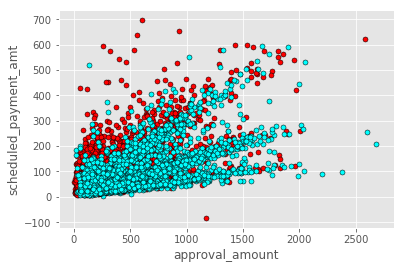

('Variables:', 'past_due_amt', 'approval_amount')


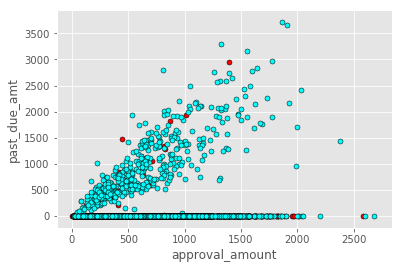

('Variables:', 'account_payment_method', 'approval_amount')


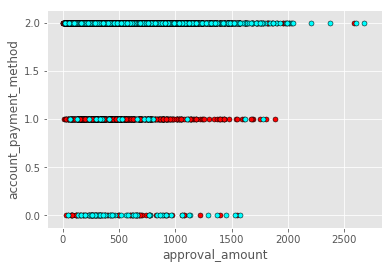

('Variables:', 'days_past_due', 'approval_amount')


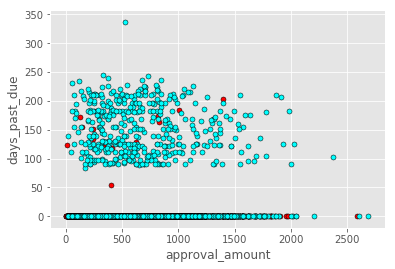

('Variables:', 'number_of_payments', 'approval_amount')


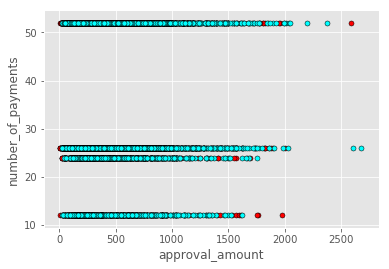

('Variables:', 'data_correction', 'approval_amount')


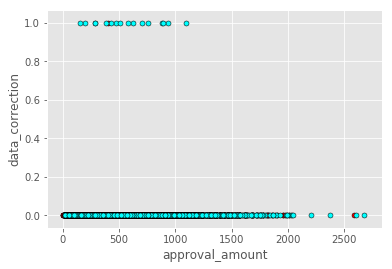

('Variables:', 'source', 'approval_amount')


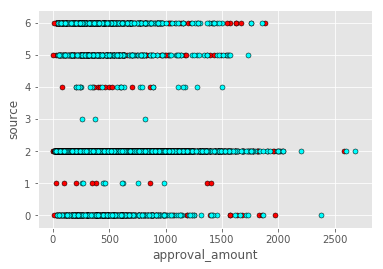

('Variables:', 'initial_decision', 'approval_amount')


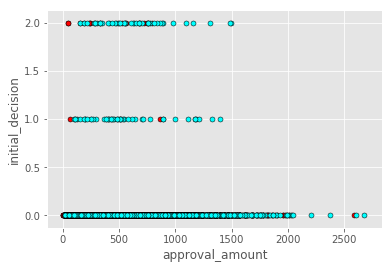

('Variables:', 'age', 'approval_amount')


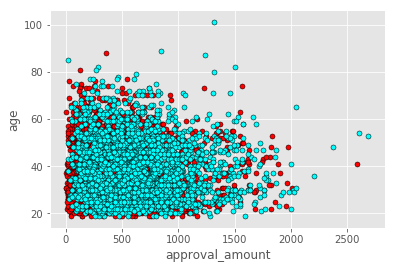

('Variables:', 'approval_amount', 'recommendation')


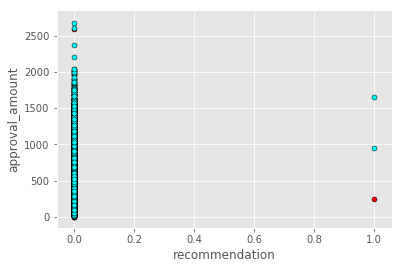

('Variables:', 'contacted', 'recommendation')


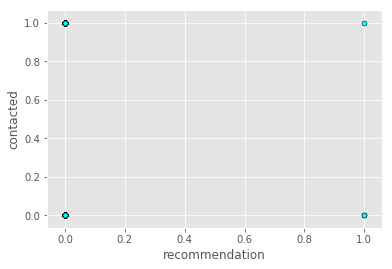

('Variables:', 'email_contacted_ts', 'recommendation')


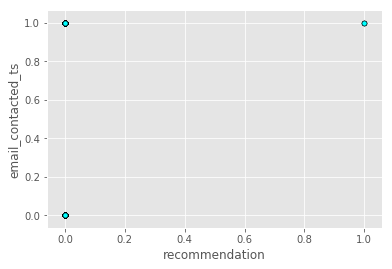

('Variables:', 'sms_contacted_ts', 'recommendation')


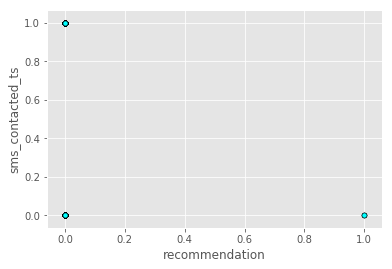

('Variables:', 'state', 'recommendation')


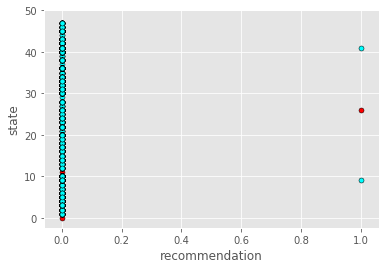

('Variables:', 'city', 'recommendation')


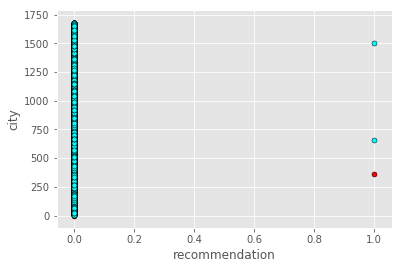

('Variables:', 'zip_code', 'recommendation')


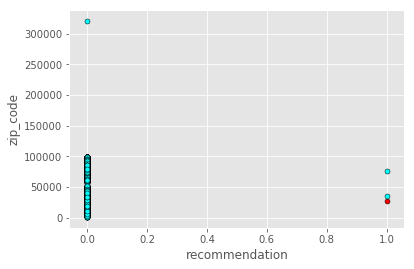

('Variables:', 'rent_or_own', 'recommendation')


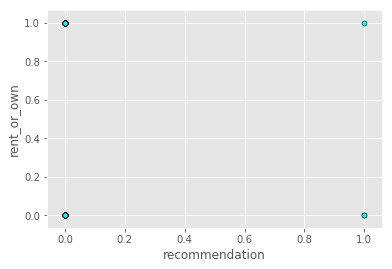

('Variables:', 'months_at_current_residence', 'recommendation')


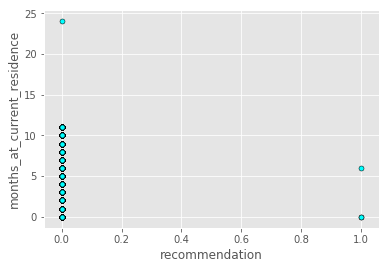

('Variables:', 'years_at_current_residence', 'recommendation')


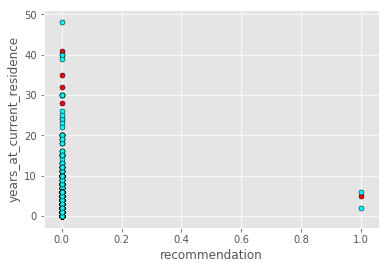

('Variables:', 'direct_deposit', 'recommendation')


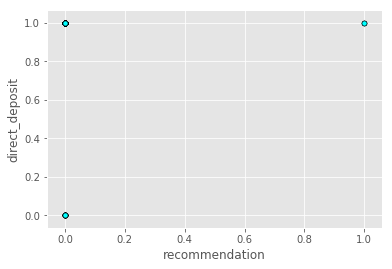

('Variables:', 'language_preference', 'recommendation')


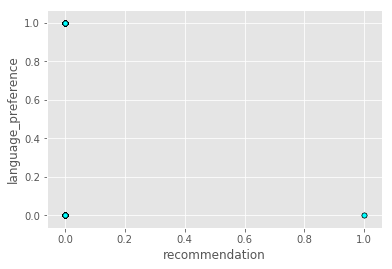

('Variables:', 'payment_frequency', 'recommendation')


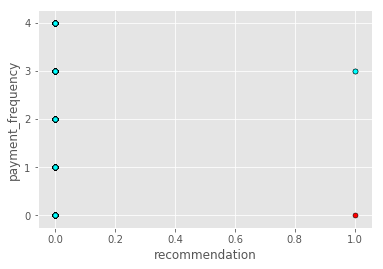

('Variables:', 'scheduled_payment_amt', 'recommendation')


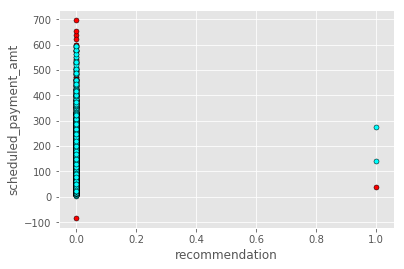

('Variables:', 'past_due_amt', 'recommendation')


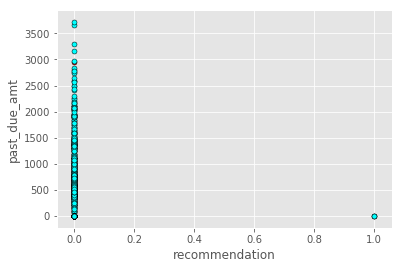

('Variables:', 'account_payment_method', 'recommendation')


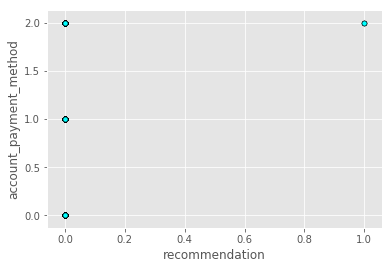

('Variables:', 'days_past_due', 'recommendation')


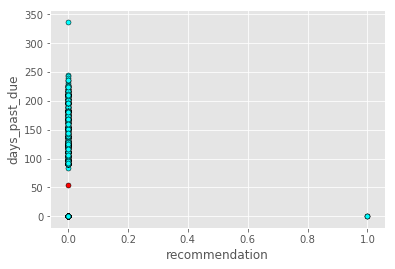

('Variables:', 'number_of_payments', 'recommendation')


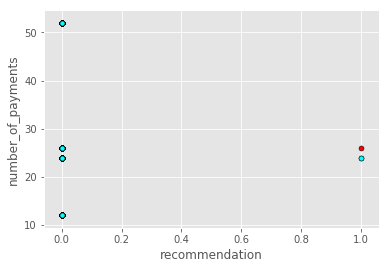

('Variables:', 'data_correction', 'recommendation')


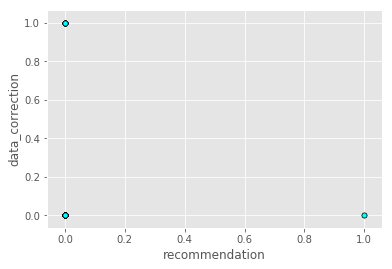

('Variables:', 'source', 'recommendation')


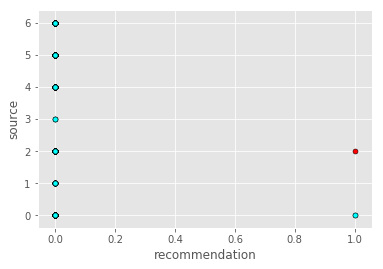

('Variables:', 'initial_decision', 'recommendation')


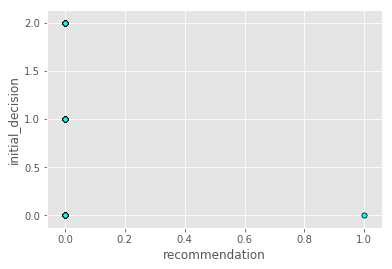

('Variables:', 'age', 'recommendation')


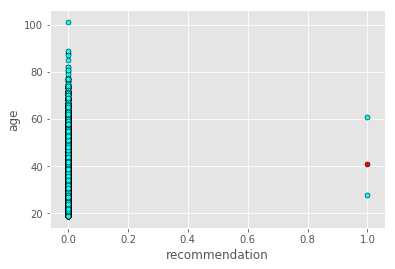

('Variables:', 'approval_amount', 'contacted')


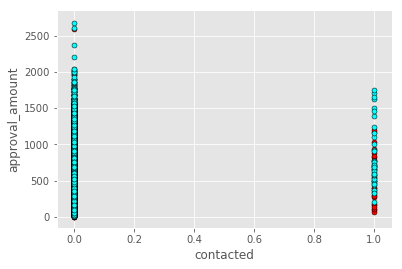

('Variables:', 'recommendation', 'contacted')


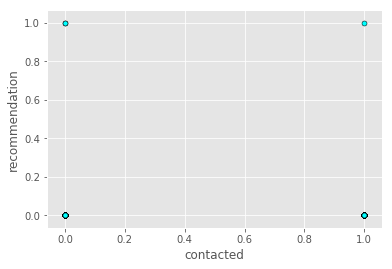

('Variables:', 'email_contacted_ts', 'contacted')


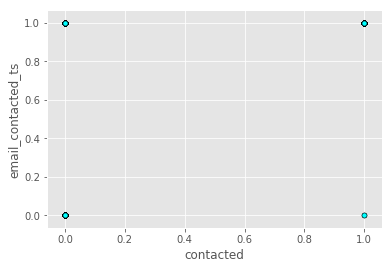

('Variables:', 'sms_contacted_ts', 'contacted')


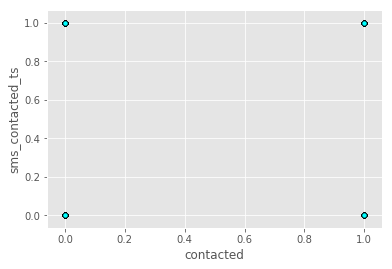

('Variables:', 'state', 'contacted')


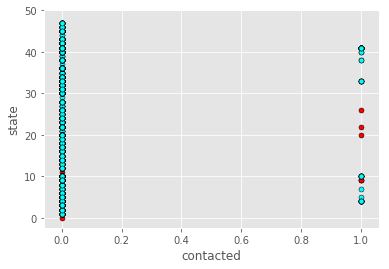

('Variables:', 'city', 'contacted')


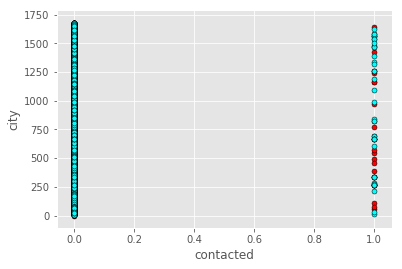

('Variables:', 'zip_code', 'contacted')


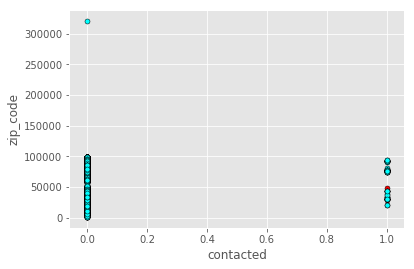

('Variables:', 'rent_or_own', 'contacted')


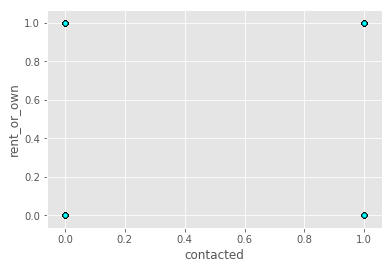

('Variables:', 'months_at_current_residence', 'contacted')


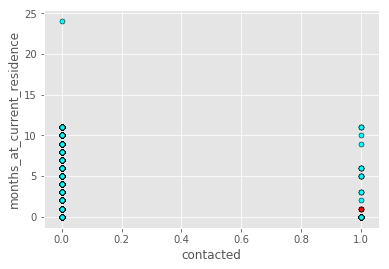

('Variables:', 'years_at_current_residence', 'contacted')


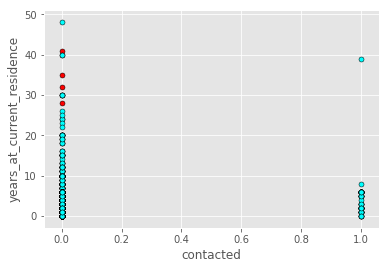

('Variables:', 'direct_deposit', 'contacted')


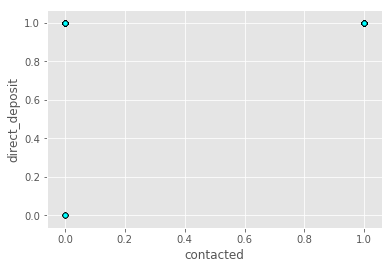

('Variables:', 'language_preference', 'contacted')


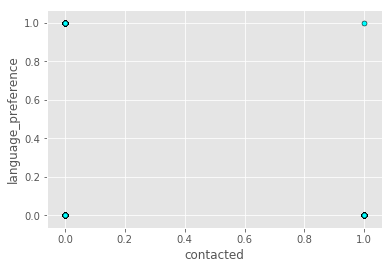

('Variables:', 'payment_frequency', 'contacted')


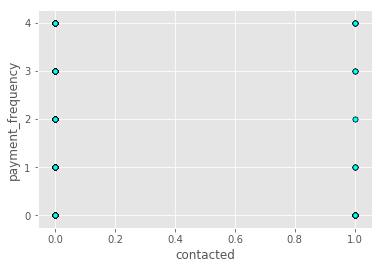

('Variables:', 'scheduled_payment_amt', 'contacted')


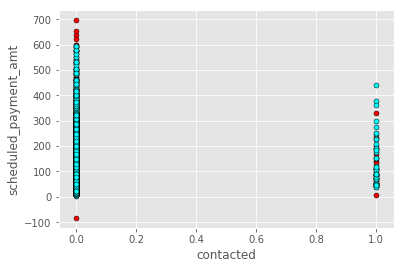

('Variables:', 'past_due_amt', 'contacted')


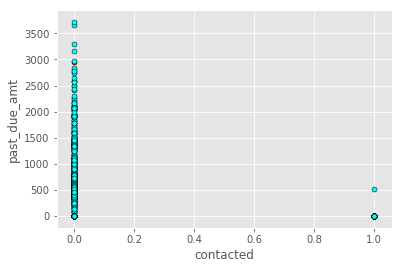

('Variables:', 'account_payment_method', 'contacted')


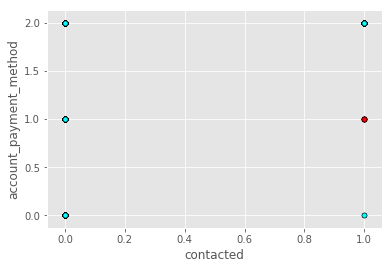

('Variables:', 'days_past_due', 'contacted')


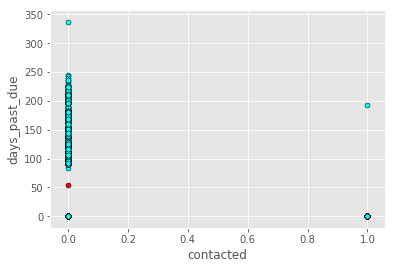

('Variables:', 'number_of_payments', 'contacted')


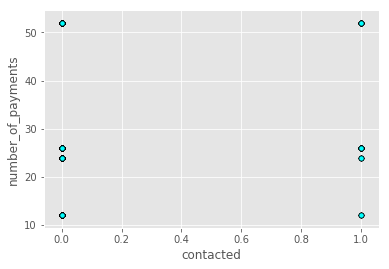

('Variables:', 'data_correction', 'contacted')


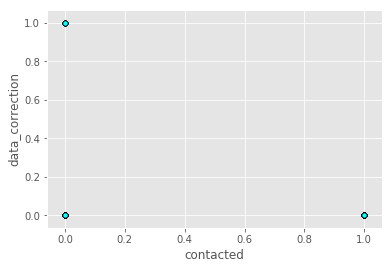

('Variables:', 'source', 'contacted')


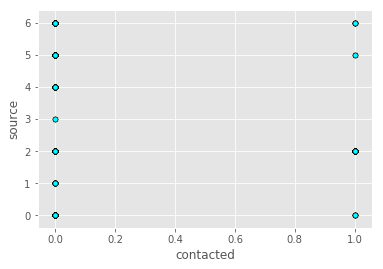

('Variables:', 'initial_decision', 'contacted')


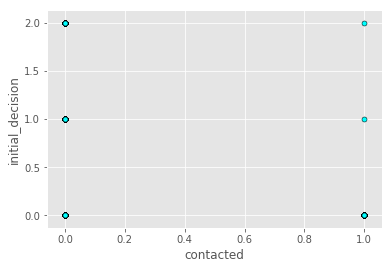

('Variables:', 'age', 'contacted')


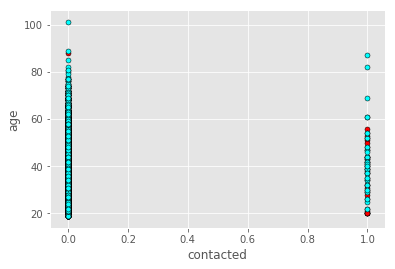

('Variables:', 'approval_amount', 'email_contacted_ts')


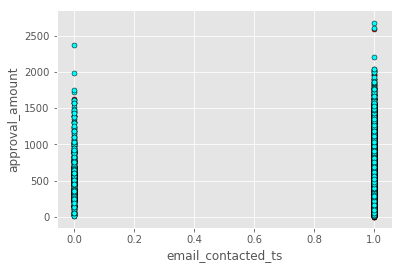

('Variables:', 'recommendation', 'email_contacted_ts')


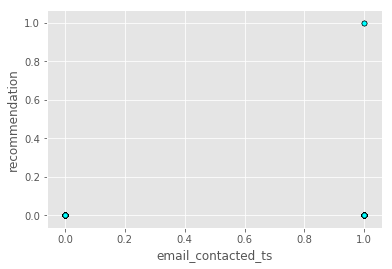

('Variables:', 'contacted', 'email_contacted_ts')


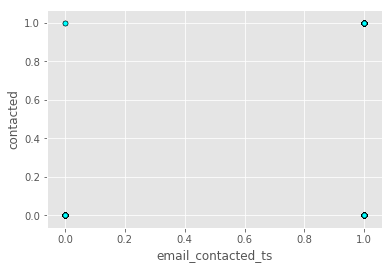

('Variables:', 'sms_contacted_ts', 'email_contacted_ts')


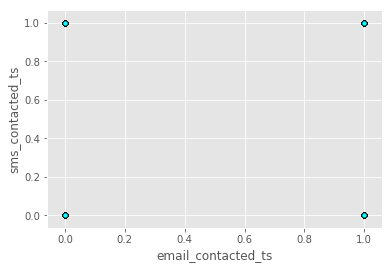

('Variables:', 'state', 'email_contacted_ts')


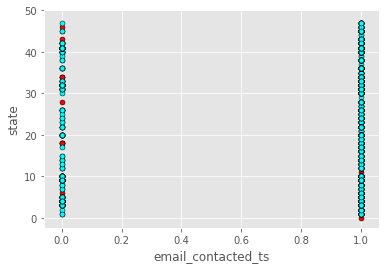

('Variables:', 'city', 'email_contacted_ts')


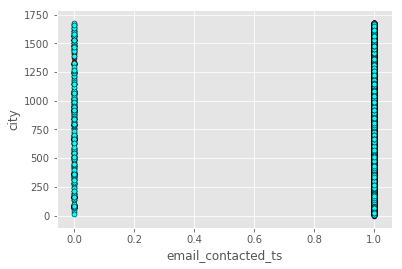

('Variables:', 'zip_code', 'email_contacted_ts')


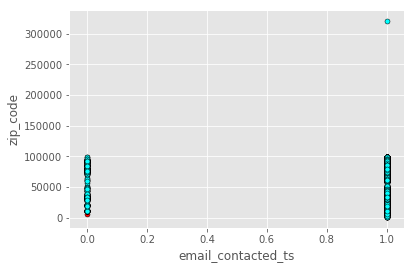

('Variables:', 'rent_or_own', 'email_contacted_ts')


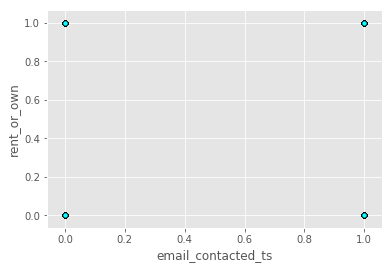

('Variables:', 'months_at_current_residence', 'email_contacted_ts')


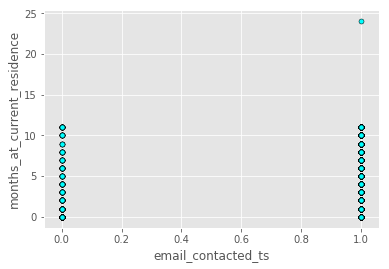

('Variables:', 'years_at_current_residence', 'email_contacted_ts')


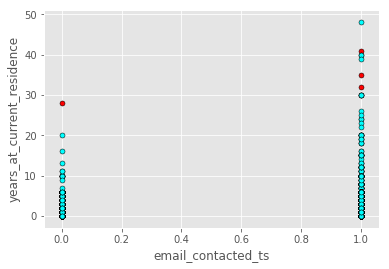

('Variables:', 'direct_deposit', 'email_contacted_ts')


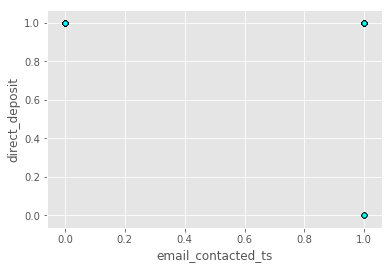

('Variables:', 'language_preference', 'email_contacted_ts')


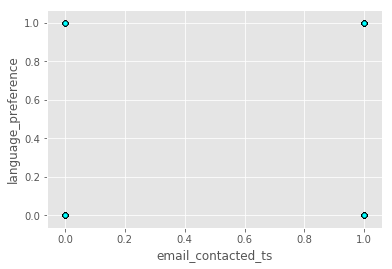

('Variables:', 'payment_frequency', 'email_contacted_ts')


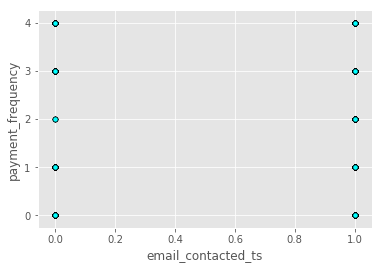

('Variables:', 'scheduled_payment_amt', 'email_contacted_ts')


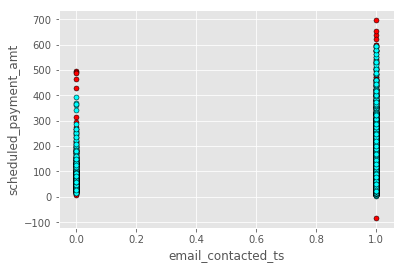

('Variables:', 'past_due_amt', 'email_contacted_ts')


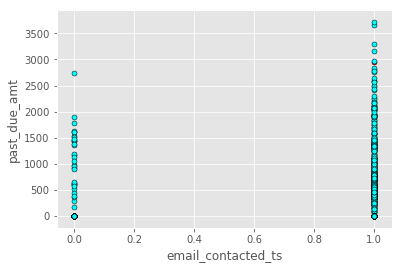

('Variables:', 'account_payment_method', 'email_contacted_ts')


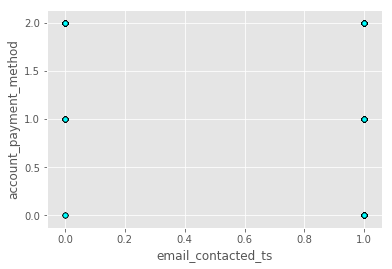

('Variables:', 'days_past_due', 'email_contacted_ts')


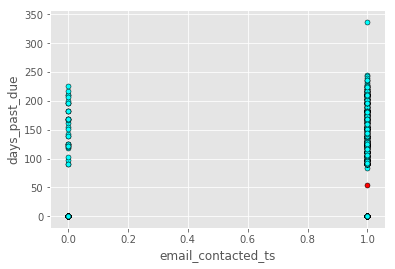

('Variables:', 'number_of_payments', 'email_contacted_ts')


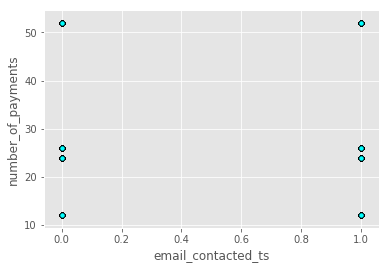

('Variables:', 'data_correction', 'email_contacted_ts')


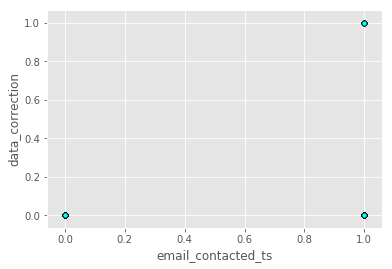

('Variables:', 'source', 'email_contacted_ts')


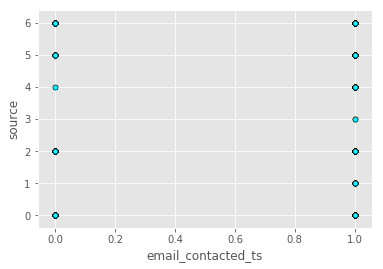

('Variables:', 'initial_decision', 'email_contacted_ts')


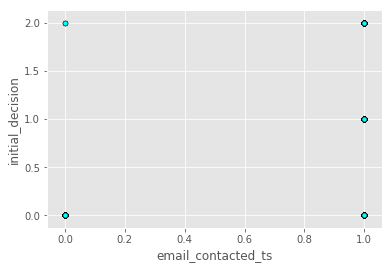

('Variables:', 'age', 'email_contacted_ts')


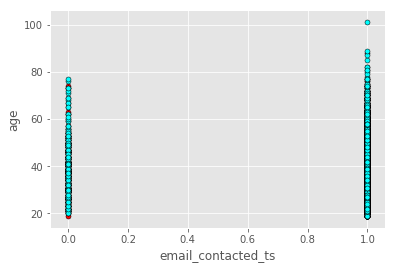

('Variables:', 'approval_amount', 'sms_contacted_ts')


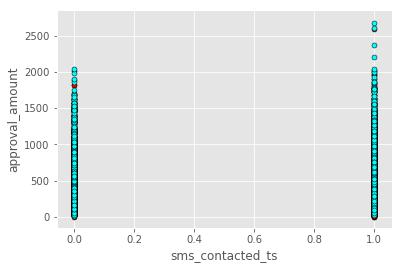

('Variables:', 'recommendation', 'sms_contacted_ts')


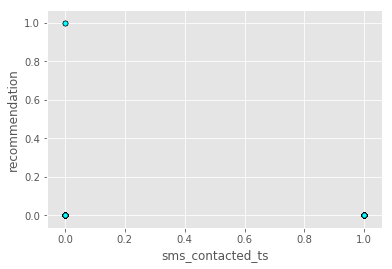

('Variables:', 'contacted', 'sms_contacted_ts')


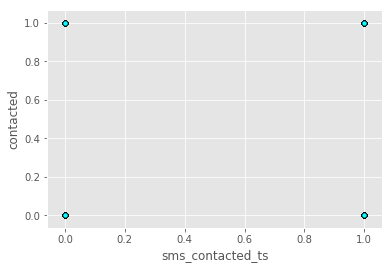

('Variables:', 'email_contacted_ts', 'sms_contacted_ts')


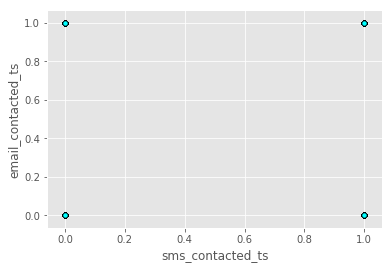

('Variables:', 'state', 'sms_contacted_ts')


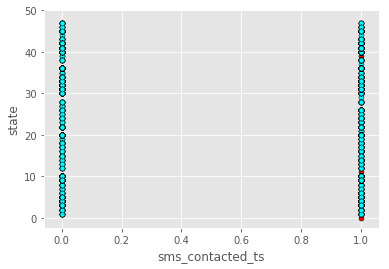

('Variables:', 'city', 'sms_contacted_ts')


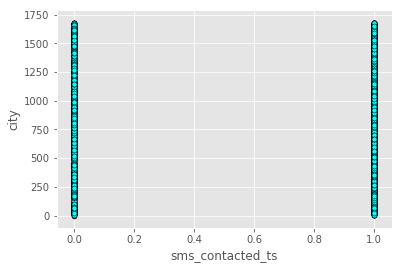

('Variables:', 'zip_code', 'sms_contacted_ts')


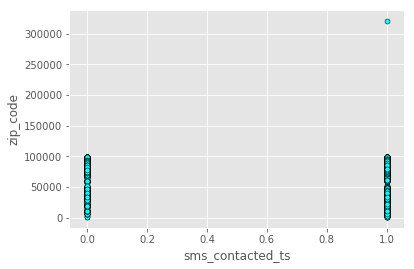

('Variables:', 'rent_or_own', 'sms_contacted_ts')


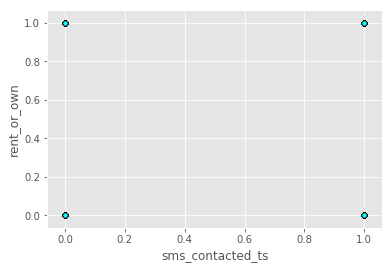

('Variables:', 'months_at_current_residence', 'sms_contacted_ts')


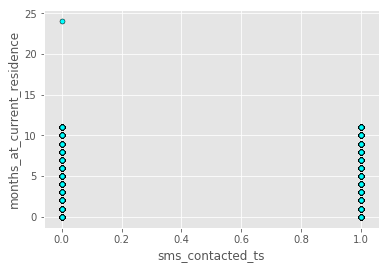

('Variables:', 'years_at_current_residence', 'sms_contacted_ts')


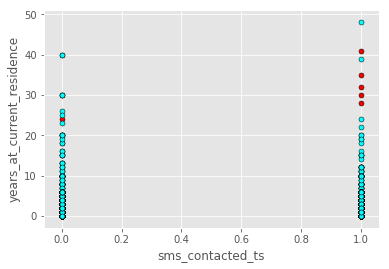

('Variables:', 'direct_deposit', 'sms_contacted_ts')


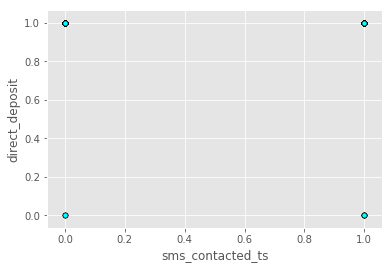

('Variables:', 'language_preference', 'sms_contacted_ts')


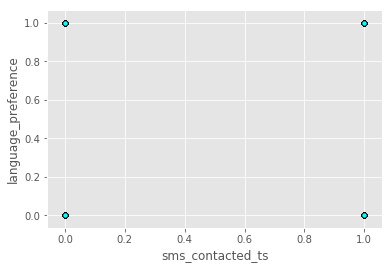

('Variables:', 'payment_frequency', 'sms_contacted_ts')


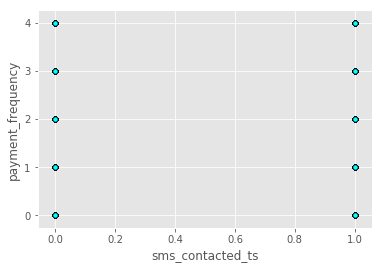

('Variables:', 'scheduled_payment_amt', 'sms_contacted_ts')


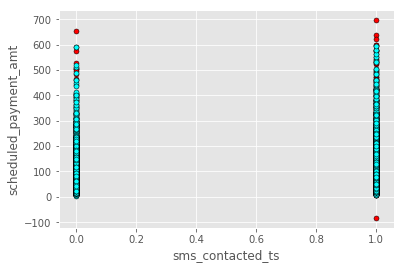

('Variables:', 'past_due_amt', 'sms_contacted_ts')


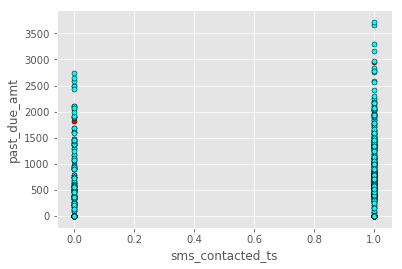

('Variables:', 'account_payment_method', 'sms_contacted_ts')


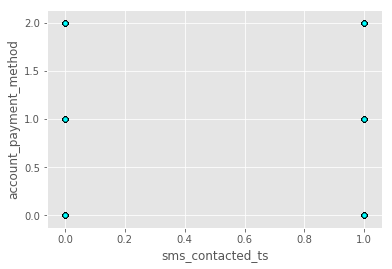

('Variables:', 'days_past_due', 'sms_contacted_ts')


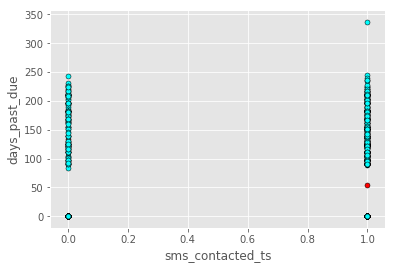

('Variables:', 'number_of_payments', 'sms_contacted_ts')


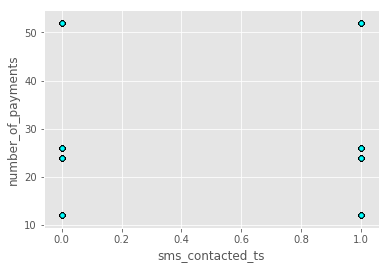

('Variables:', 'data_correction', 'sms_contacted_ts')


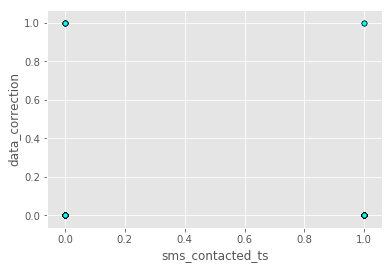

('Variables:', 'source', 'sms_contacted_ts')


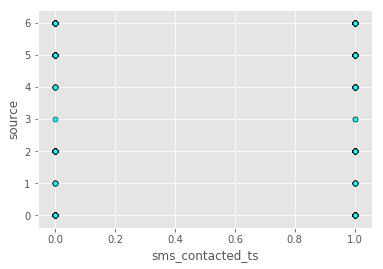

('Variables:', 'initial_decision', 'sms_contacted_ts')


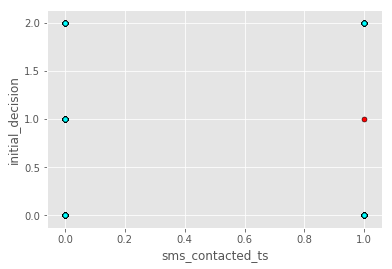

('Variables:', 'age', 'sms_contacted_ts')


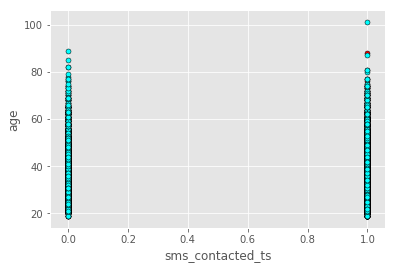

('Variables:', 'approval_amount', 'state')


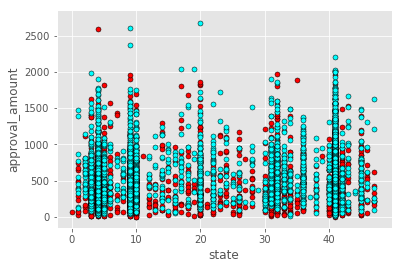

('Variables:', 'recommendation', 'state')


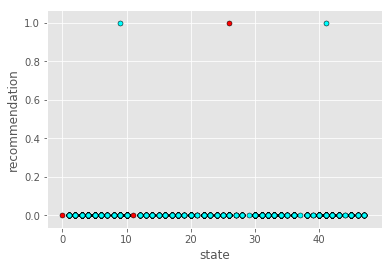

('Variables:', 'contacted', 'state')


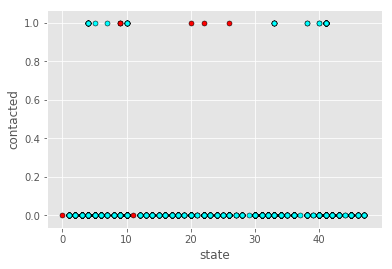

('Variables:', 'email_contacted_ts', 'state')


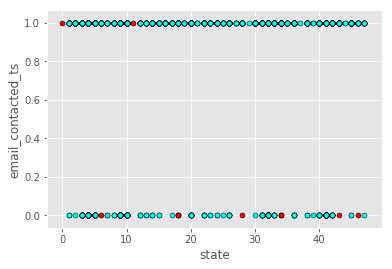

('Variables:', 'sms_contacted_ts', 'state')


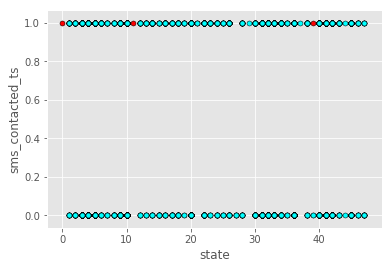

('Variables:', 'city', 'state')


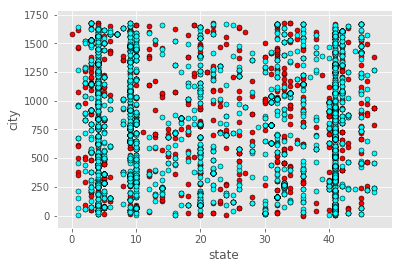

('Variables:', 'zip_code', 'state')


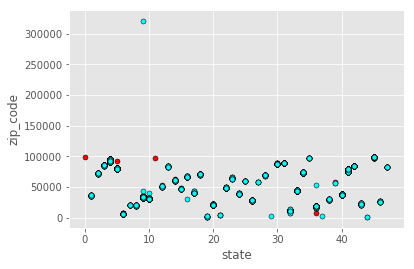

('Variables:', 'rent_or_own', 'state')


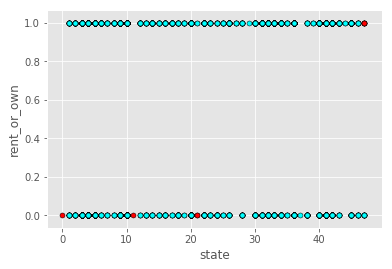

('Variables:', 'months_at_current_residence', 'state')


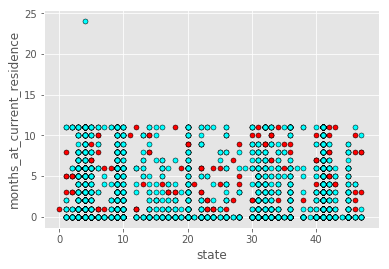

('Variables:', 'years_at_current_residence', 'state')


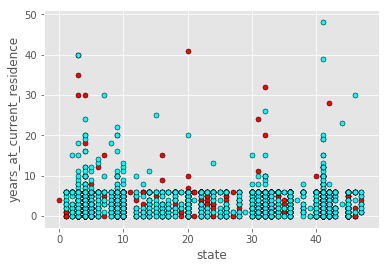

('Variables:', 'direct_deposit', 'state')


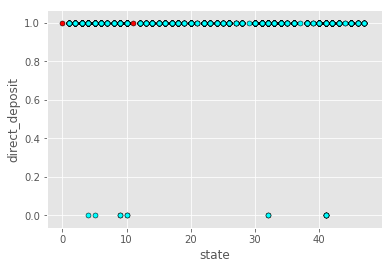

('Variables:', 'language_preference', 'state')


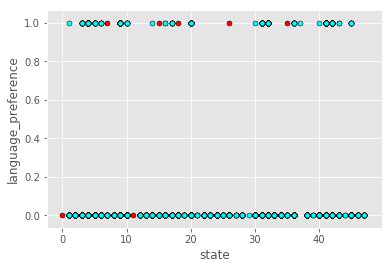

('Variables:', 'payment_frequency', 'state')


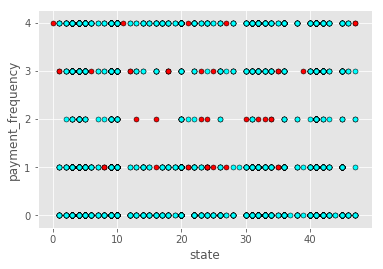

('Variables:', 'scheduled_payment_amt', 'state')


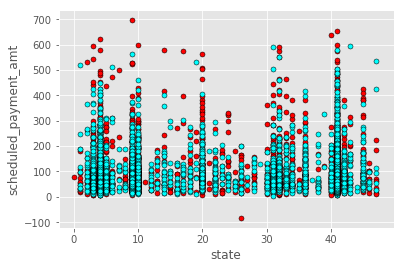

('Variables:', 'past_due_amt', 'state')


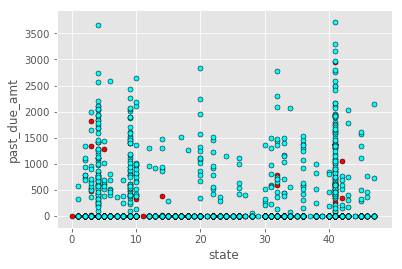

('Variables:', 'account_payment_method', 'state')


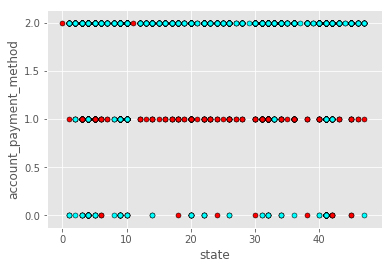

('Variables:', 'days_past_due', 'state')


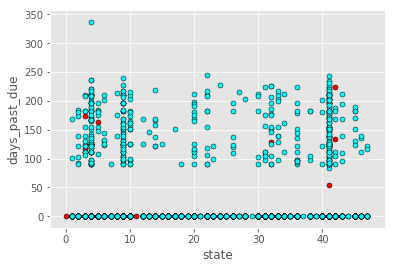

('Variables:', 'number_of_payments', 'state')


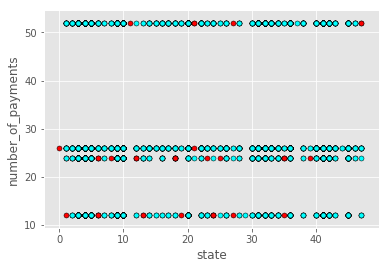

('Variables:', 'data_correction', 'state')


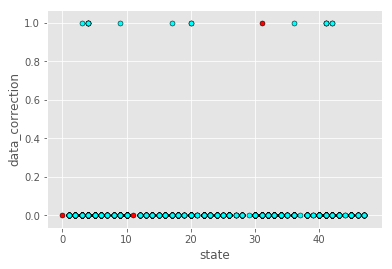

('Variables:', 'source', 'state')


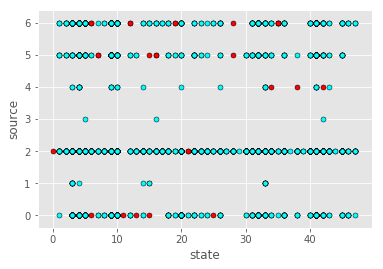

('Variables:', 'initial_decision', 'state')


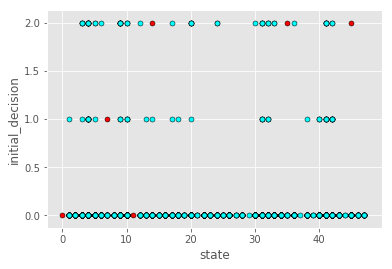

('Variables:', 'age', 'state')


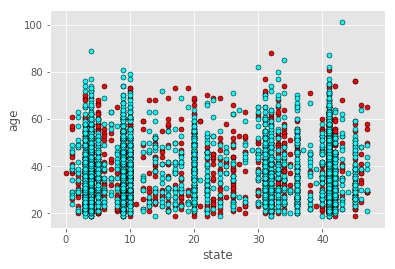

('Variables:', 'approval_amount', 'city')


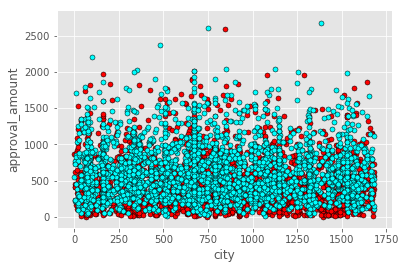

('Variables:', 'recommendation', 'city')


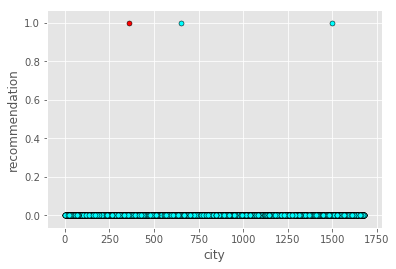

('Variables:', 'contacted', 'city')


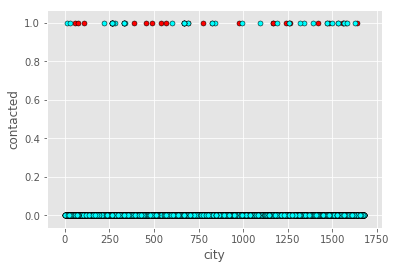

('Variables:', 'email_contacted_ts', 'city')


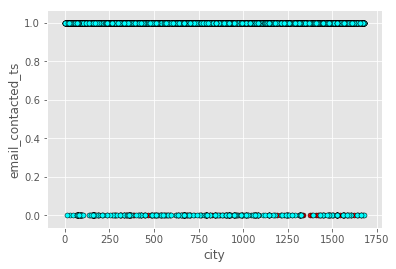

('Variables:', 'sms_contacted_ts', 'city')


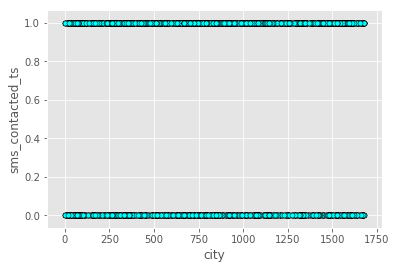

('Variables:', 'state', 'city')


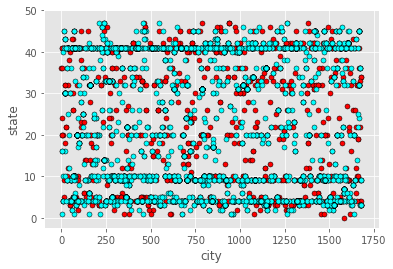

('Variables:', 'zip_code', 'city')


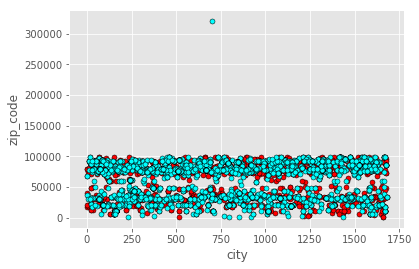

('Variables:', 'rent_or_own', 'city')


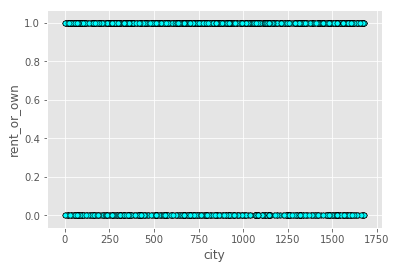

('Variables:', 'months_at_current_residence', 'city')


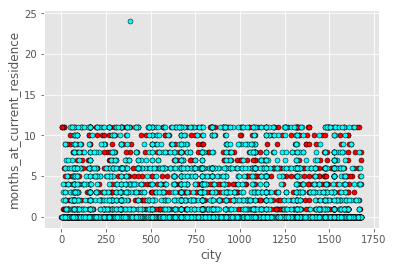

('Variables:', 'years_at_current_residence', 'city')


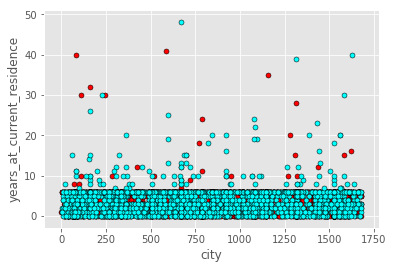

('Variables:', 'direct_deposit', 'city')


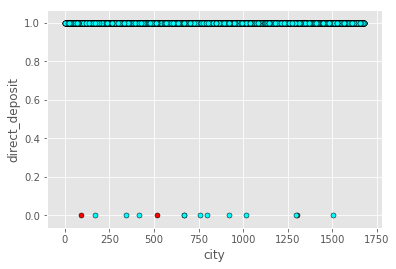

('Variables:', 'language_preference', 'city')


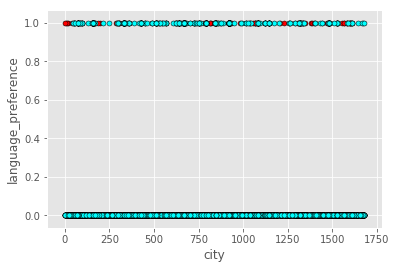

('Variables:', 'payment_frequency', 'city')


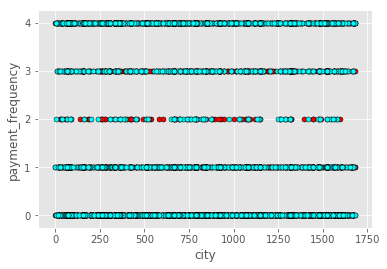

('Variables:', 'scheduled_payment_amt', 'city')


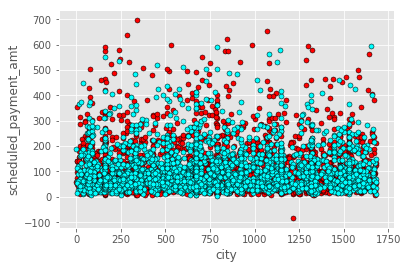

('Variables:', 'past_due_amt', 'city')


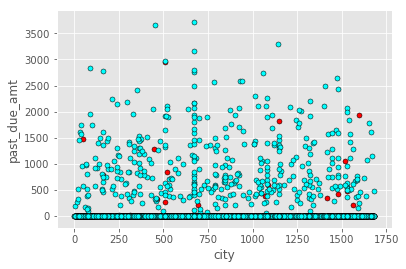

('Variables:', 'account_payment_method', 'city')


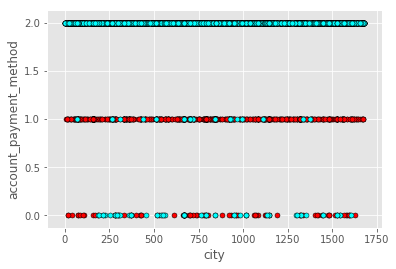

('Variables:', 'days_past_due', 'city')


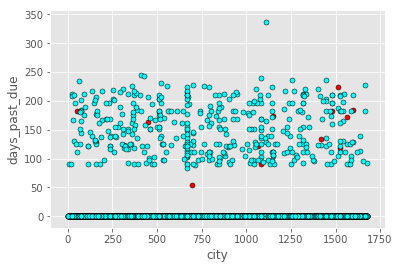

('Variables:', 'number_of_payments', 'city')


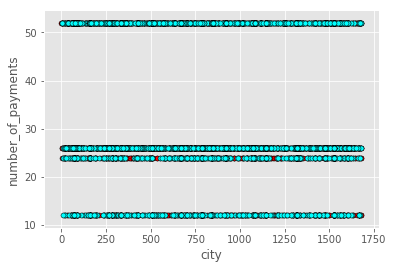

('Variables:', 'data_correction', 'city')


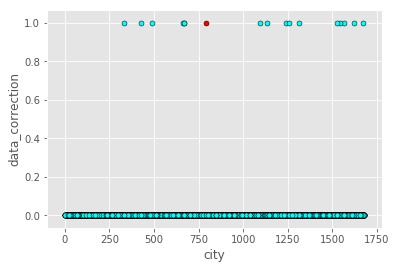

('Variables:', 'source', 'city')


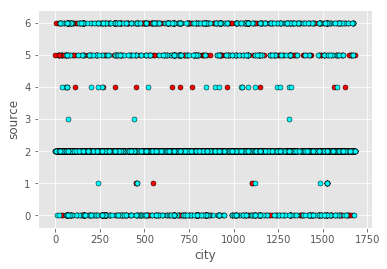

('Variables:', 'initial_decision', 'city')


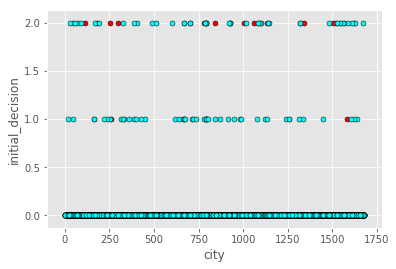

('Variables:', 'age', 'city')


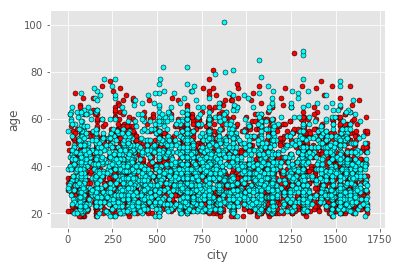

('Variables:', 'approval_amount', 'zip_code')


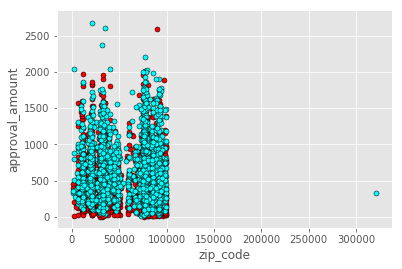

('Variables:', 'recommendation', 'zip_code')


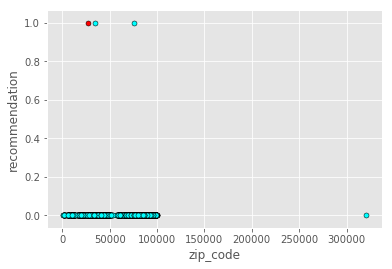

('Variables:', 'contacted', 'zip_code')


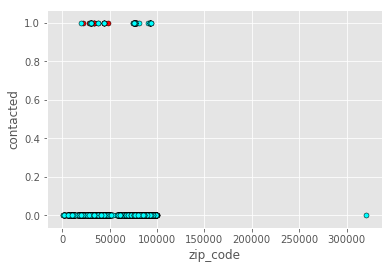

('Variables:', 'email_contacted_ts', 'zip_code')


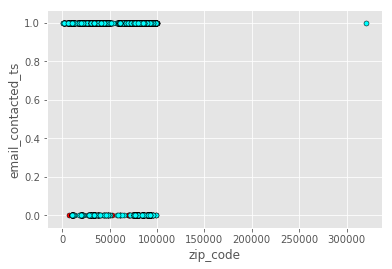

('Variables:', 'sms_contacted_ts', 'zip_code')


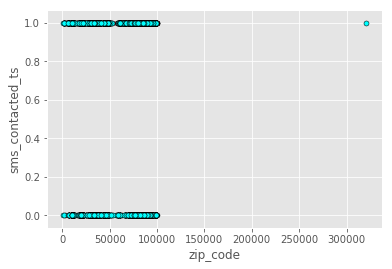

('Variables:', 'state', 'zip_code')


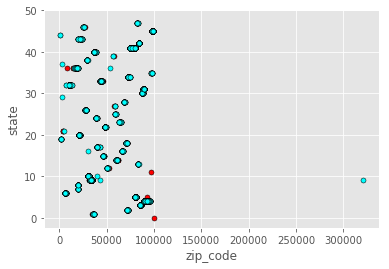

('Variables:', 'city', 'zip_code')


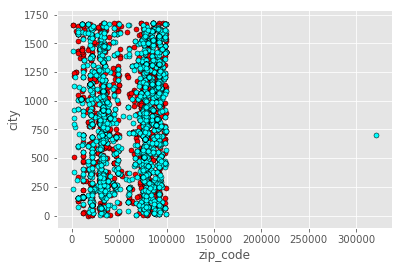

('Variables:', 'rent_or_own', 'zip_code')


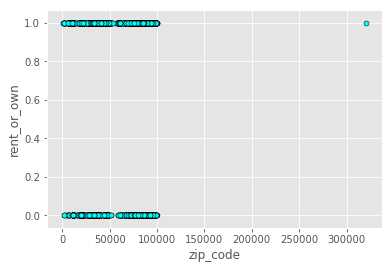

('Variables:', 'months_at_current_residence', 'zip_code')


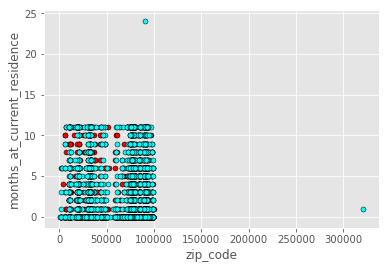

('Variables:', 'years_at_current_residence', 'zip_code')


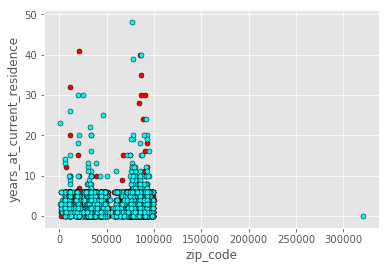

('Variables:', 'direct_deposit', 'zip_code')


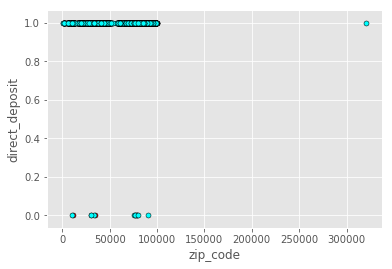

('Variables:', 'language_preference', 'zip_code')


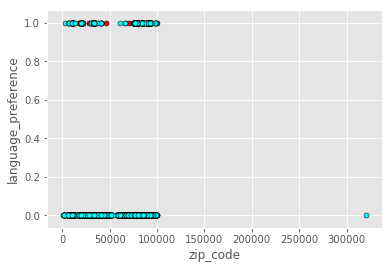

('Variables:', 'payment_frequency', 'zip_code')


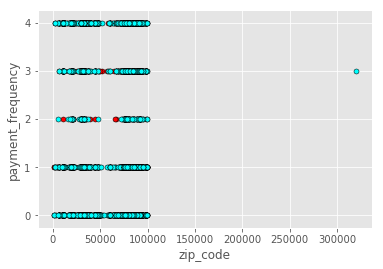

('Variables:', 'scheduled_payment_amt', 'zip_code')


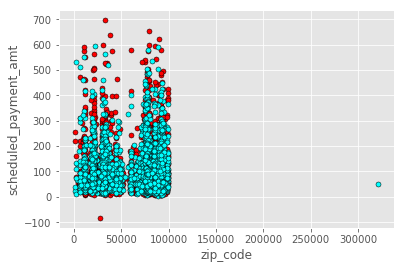

('Variables:', 'past_due_amt', 'zip_code')


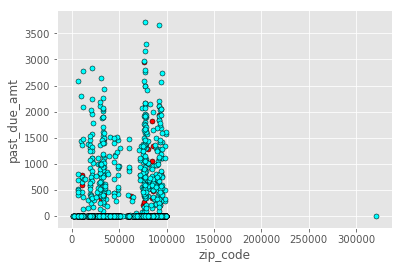

('Variables:', 'account_payment_method', 'zip_code')


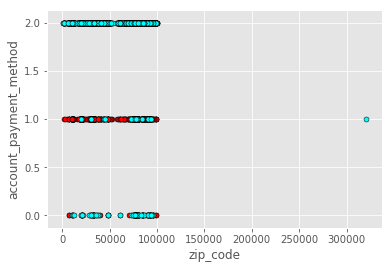

('Variables:', 'days_past_due', 'zip_code')


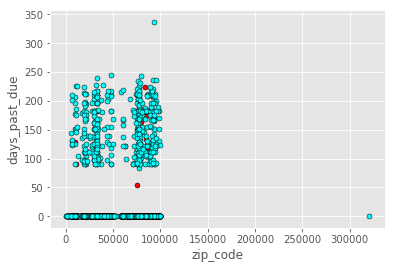

('Variables:', 'number_of_payments', 'zip_code')


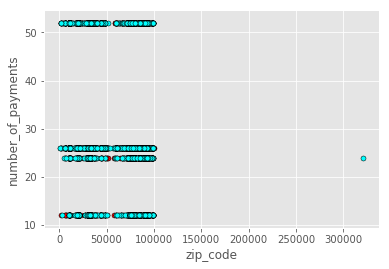

('Variables:', 'data_correction', 'zip_code')


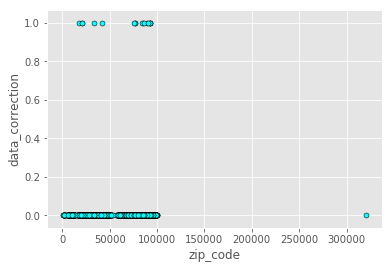

('Variables:', 'source', 'zip_code')


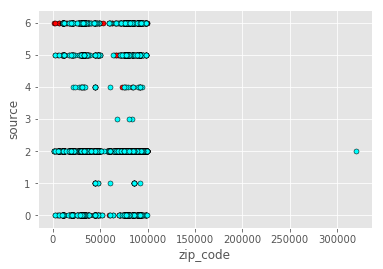

('Variables:', 'initial_decision', 'zip_code')


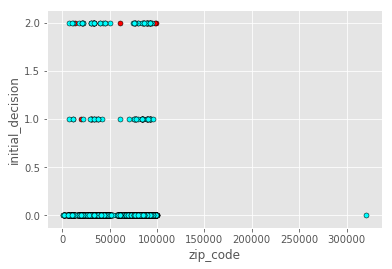

('Variables:', 'age', 'zip_code')


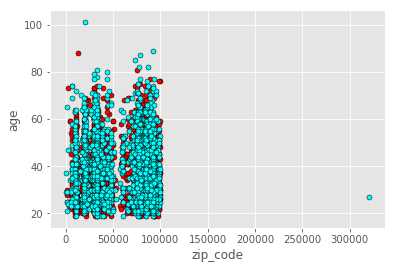

('Variables:', 'approval_amount', 'rent_or_own')


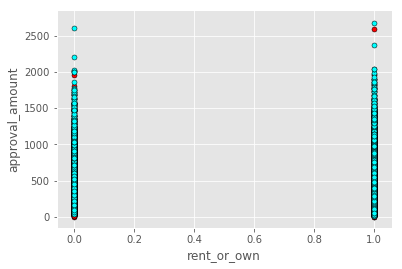

('Variables:', 'recommendation', 'rent_or_own')


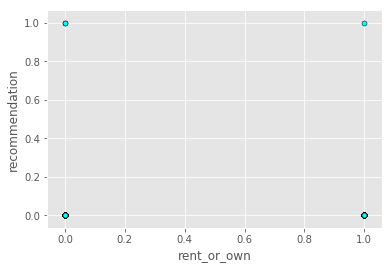

('Variables:', 'contacted', 'rent_or_own')


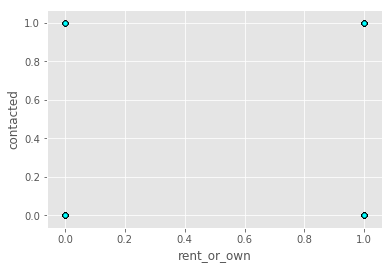

('Variables:', 'email_contacted_ts', 'rent_or_own')


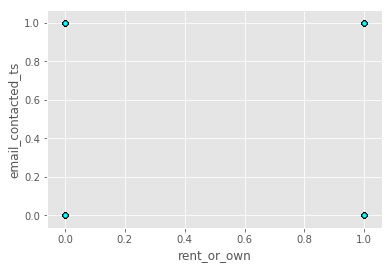

('Variables:', 'sms_contacted_ts', 'rent_or_own')


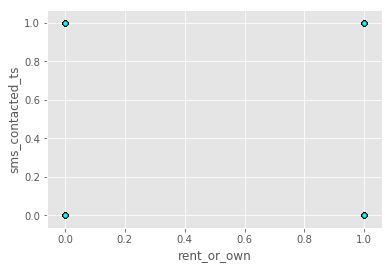

('Variables:', 'state', 'rent_or_own')


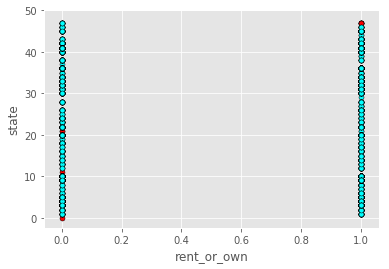

('Variables:', 'city', 'rent_or_own')


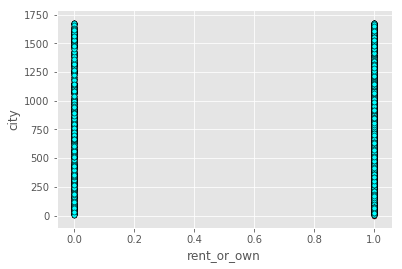

('Variables:', 'zip_code', 'rent_or_own')


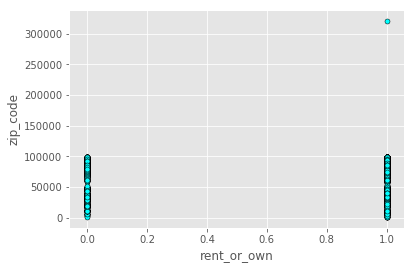

('Variables:', 'months_at_current_residence', 'rent_or_own')


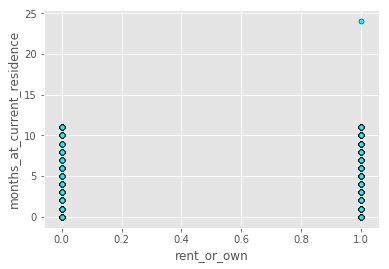

('Variables:', 'years_at_current_residence', 'rent_or_own')


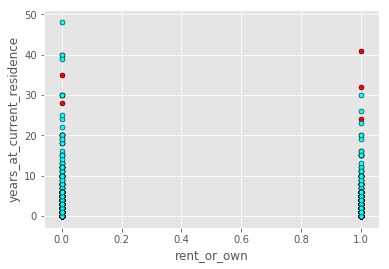

('Variables:', 'direct_deposit', 'rent_or_own')


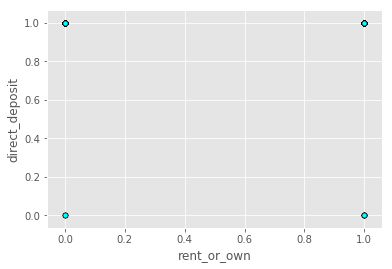

('Variables:', 'language_preference', 'rent_or_own')


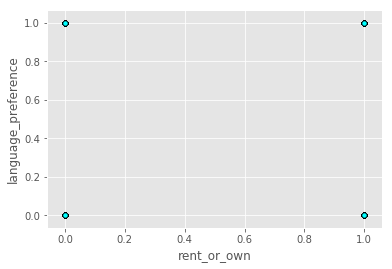

('Variables:', 'payment_frequency', 'rent_or_own')


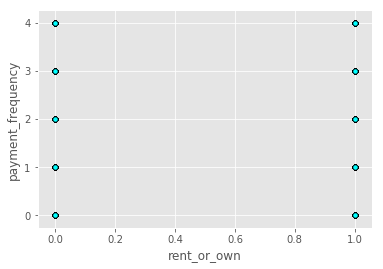

('Variables:', 'scheduled_payment_amt', 'rent_or_own')


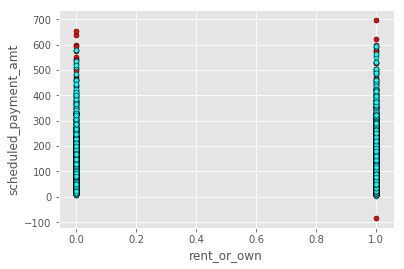

('Variables:', 'past_due_amt', 'rent_or_own')


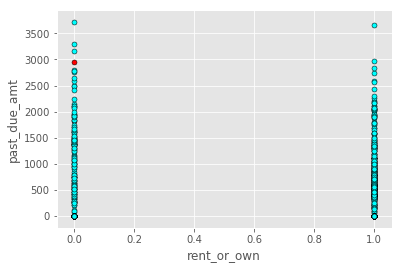

('Variables:', 'account_payment_method', 'rent_or_own')


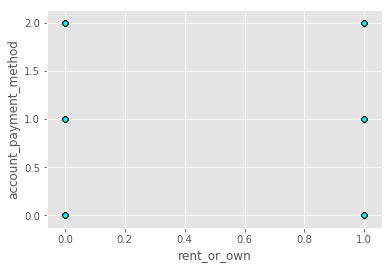

('Variables:', 'days_past_due', 'rent_or_own')


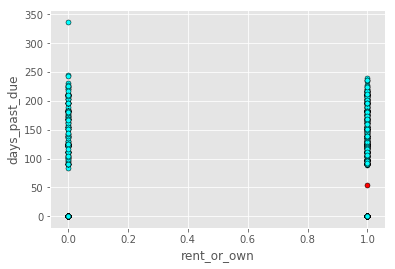

('Variables:', 'number_of_payments', 'rent_or_own')


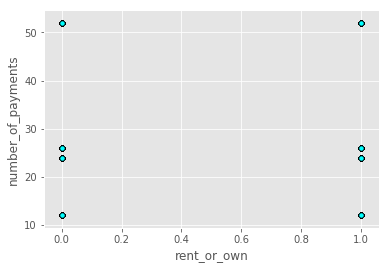

('Variables:', 'data_correction', 'rent_or_own')


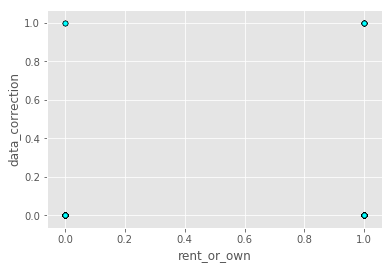

('Variables:', 'source', 'rent_or_own')


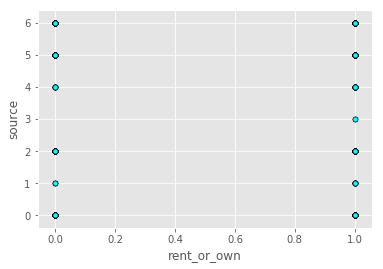

('Variables:', 'initial_decision', 'rent_or_own')


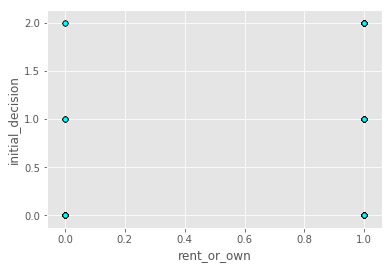

('Variables:', 'age', 'rent_or_own')


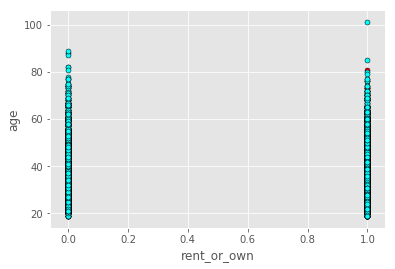

('Variables:', 'approval_amount', 'months_at_current_residence')


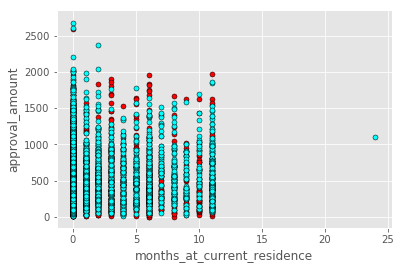

('Variables:', 'recommendation', 'months_at_current_residence')


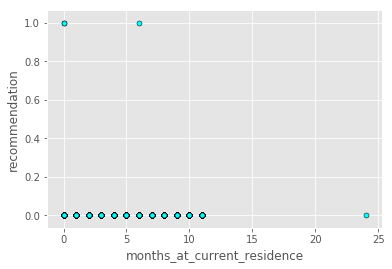

('Variables:', 'contacted', 'months_at_current_residence')


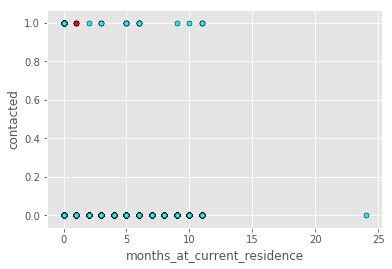

('Variables:', 'email_contacted_ts', 'months_at_current_residence')


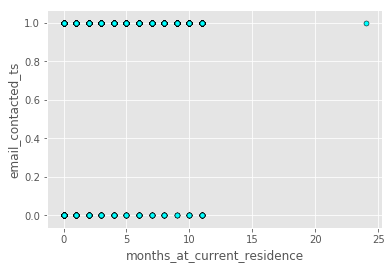

('Variables:', 'sms_contacted_ts', 'months_at_current_residence')


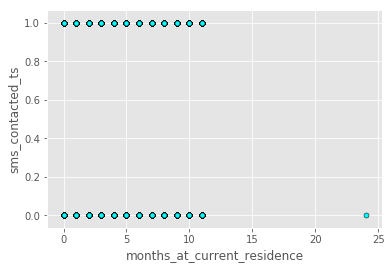

('Variables:', 'state', 'months_at_current_residence')


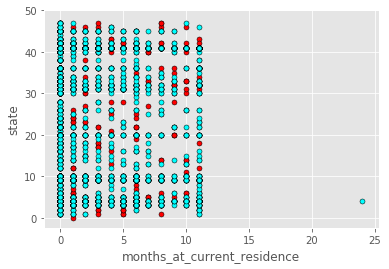

('Variables:', 'city', 'months_at_current_residence')


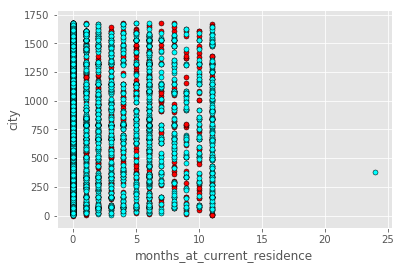

('Variables:', 'zip_code', 'months_at_current_residence')


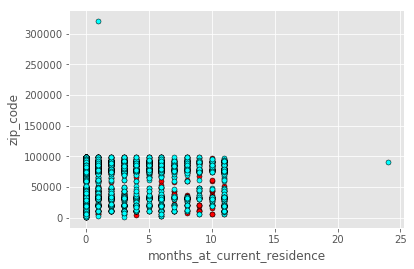

('Variables:', 'rent_or_own', 'months_at_current_residence')


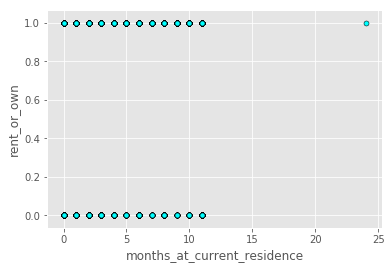

('Variables:', 'years_at_current_residence', 'months_at_current_residence')


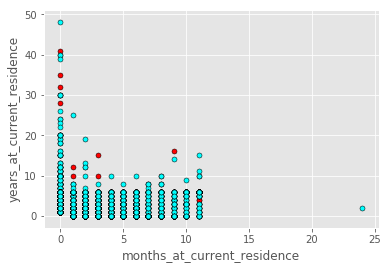

('Variables:', 'direct_deposit', 'months_at_current_residence')


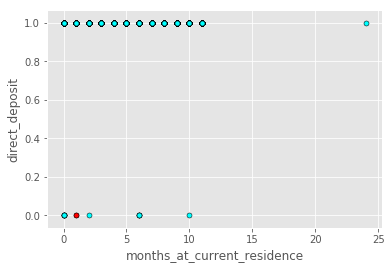

('Variables:', 'language_preference', 'months_at_current_residence')


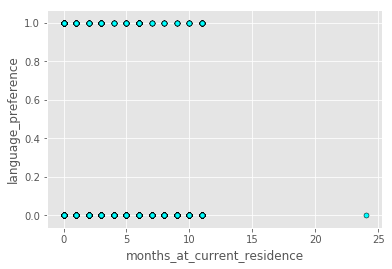

('Variables:', 'payment_frequency', 'months_at_current_residence')


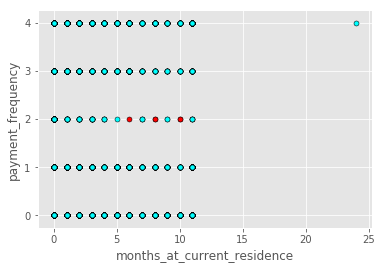

('Variables:', 'scheduled_payment_amt', 'months_at_current_residence')


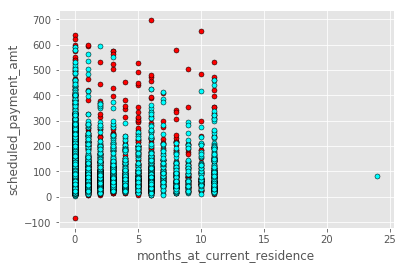

('Variables:', 'past_due_amt', 'months_at_current_residence')


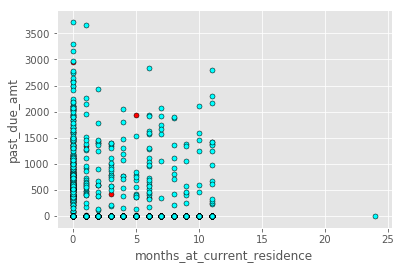

('Variables:', 'account_payment_method', 'months_at_current_residence')


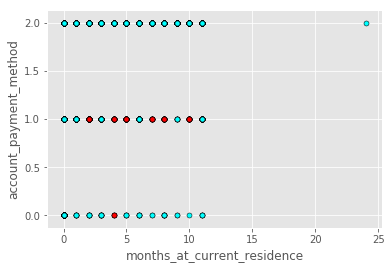

('Variables:', 'days_past_due', 'months_at_current_residence')


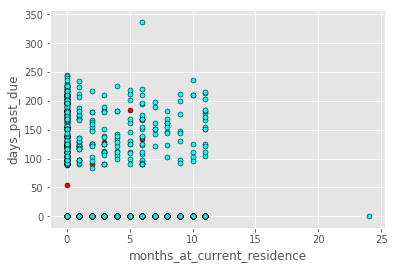

('Variables:', 'number_of_payments', 'months_at_current_residence')


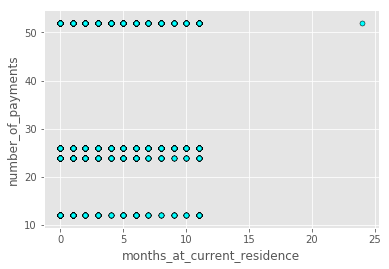

('Variables:', 'data_correction', 'months_at_current_residence')


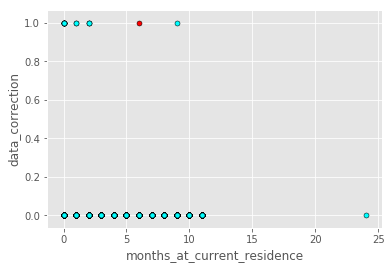

('Variables:', 'source', 'months_at_current_residence')


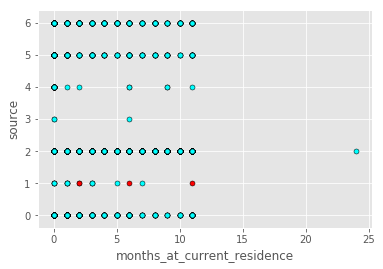

('Variables:', 'initial_decision', 'months_at_current_residence')


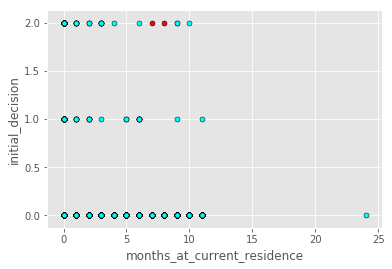

('Variables:', 'age', 'months_at_current_residence')


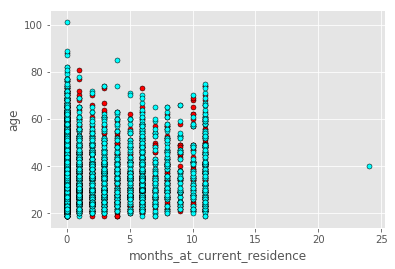

('Variables:', 'approval_amount', 'years_at_current_residence')


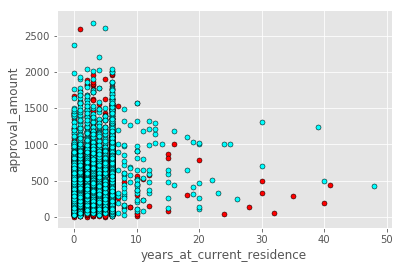

('Variables:', 'recommendation', 'years_at_current_residence')


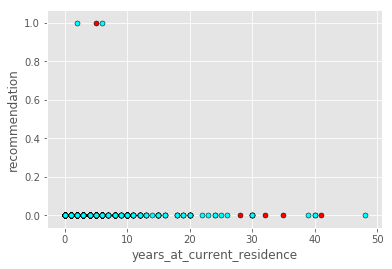

('Variables:', 'contacted', 'years_at_current_residence')


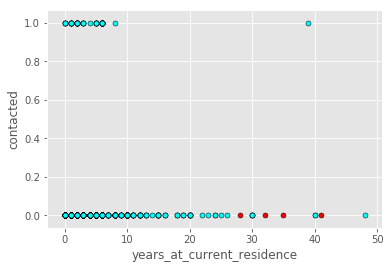

('Variables:', 'email_contacted_ts', 'years_at_current_residence')


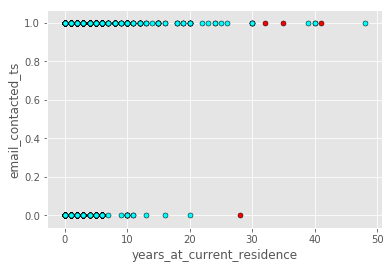

('Variables:', 'sms_contacted_ts', 'years_at_current_residence')


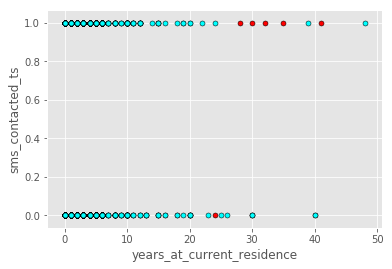

('Variables:', 'state', 'years_at_current_residence')


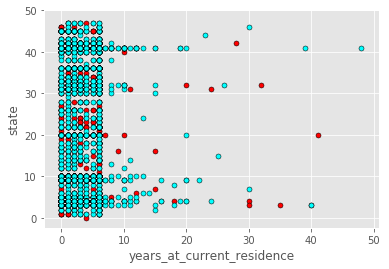

('Variables:', 'city', 'years_at_current_residence')


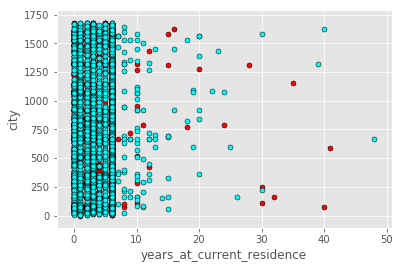

('Variables:', 'zip_code', 'years_at_current_residence')


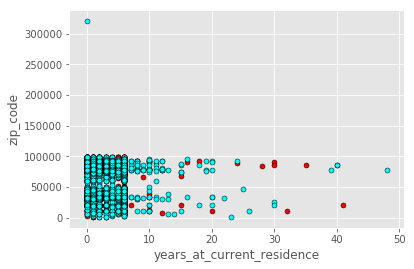

('Variables:', 'rent_or_own', 'years_at_current_residence')


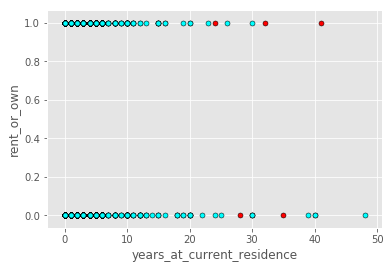

('Variables:', 'months_at_current_residence', 'years_at_current_residence')


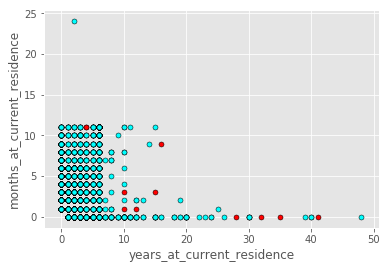

('Variables:', 'direct_deposit', 'years_at_current_residence')


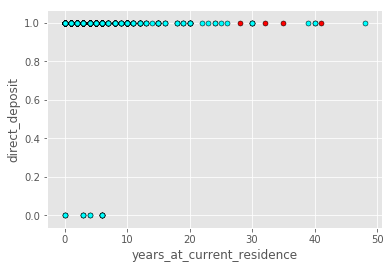

('Variables:', 'language_preference', 'years_at_current_residence')


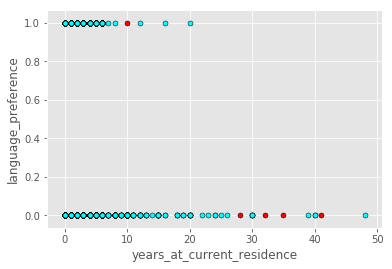

('Variables:', 'payment_frequency', 'years_at_current_residence')


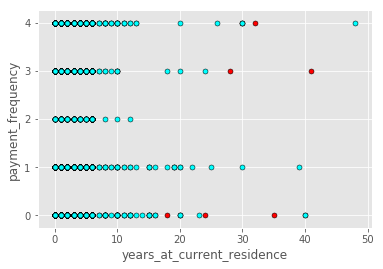

('Variables:', 'scheduled_payment_amt', 'years_at_current_residence')


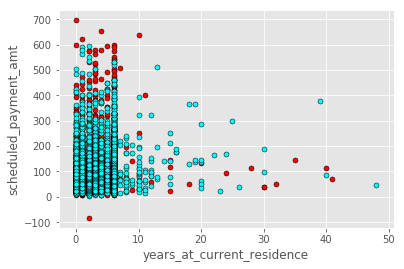

('Variables:', 'past_due_amt', 'years_at_current_residence')


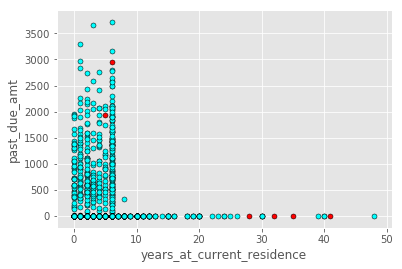

('Variables:', 'account_payment_method', 'years_at_current_residence')


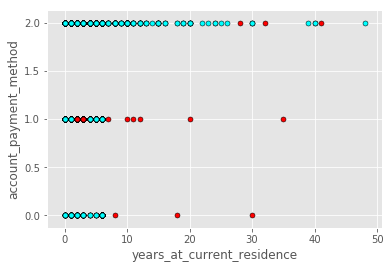

('Variables:', 'days_past_due', 'years_at_current_residence')


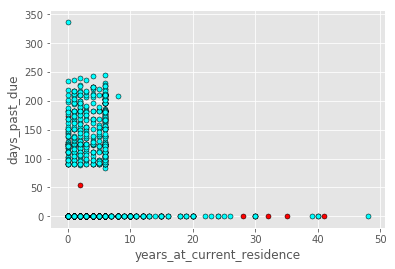

('Variables:', 'number_of_payments', 'years_at_current_residence')


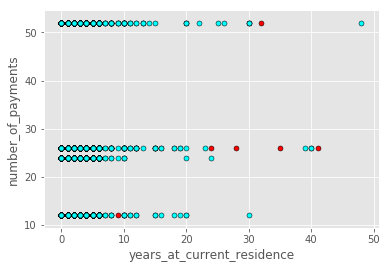

('Variables:', 'data_correction', 'years_at_current_residence')


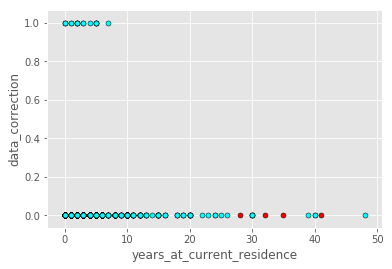

('Variables:', 'source', 'years_at_current_residence')


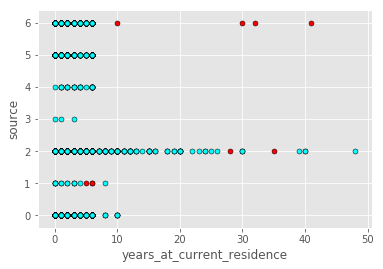

('Variables:', 'initial_decision', 'years_at_current_residence')


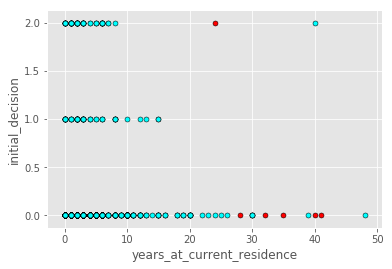

('Variables:', 'age', 'years_at_current_residence')


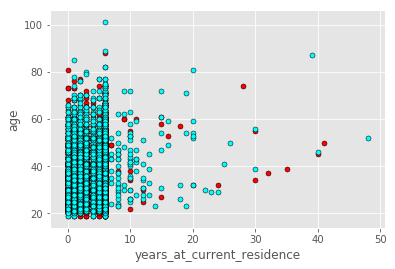

('Variables:', 'approval_amount', 'direct_deposit')


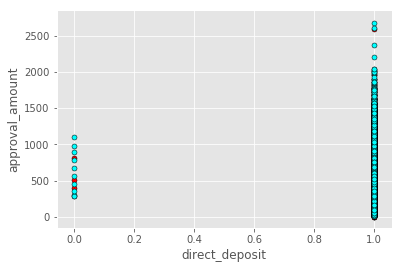

('Variables:', 'recommendation', 'direct_deposit')


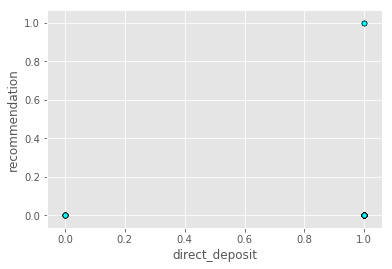

('Variables:', 'contacted', 'direct_deposit')


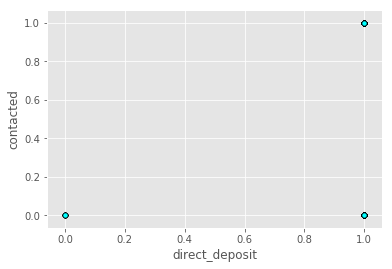

('Variables:', 'email_contacted_ts', 'direct_deposit')


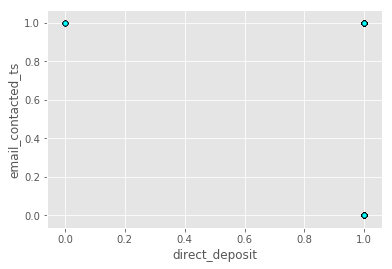

('Variables:', 'sms_contacted_ts', 'direct_deposit')


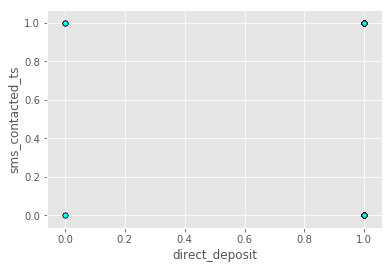

('Variables:', 'state', 'direct_deposit')


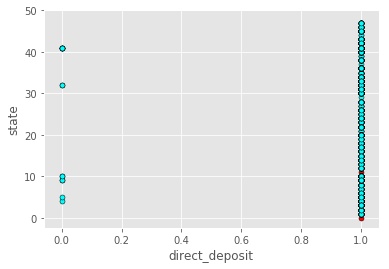

('Variables:', 'city', 'direct_deposit')


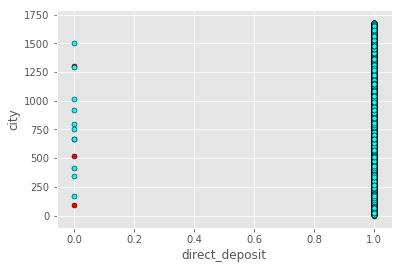

('Variables:', 'zip_code', 'direct_deposit')


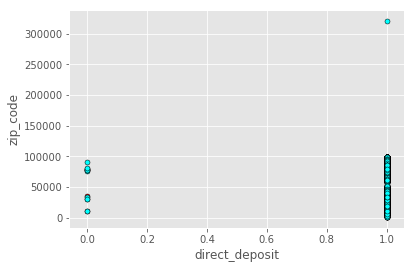

('Variables:', 'rent_or_own', 'direct_deposit')


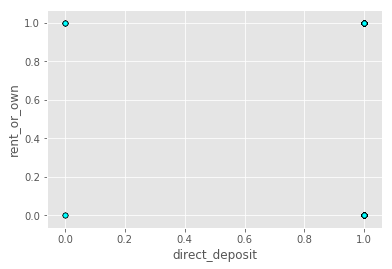

('Variables:', 'months_at_current_residence', 'direct_deposit')


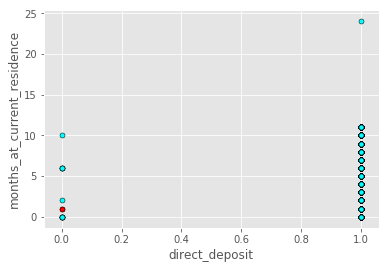

('Variables:', 'years_at_current_residence', 'direct_deposit')


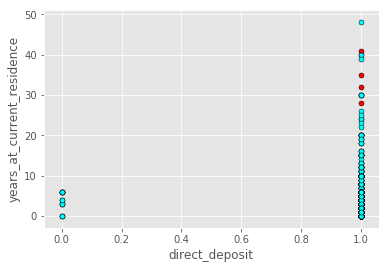

('Variables:', 'language_preference', 'direct_deposit')


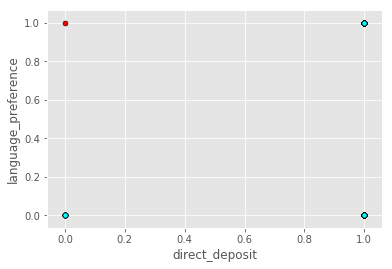

('Variables:', 'payment_frequency', 'direct_deposit')


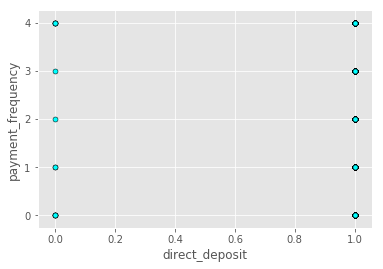

('Variables:', 'scheduled_payment_amt', 'direct_deposit')


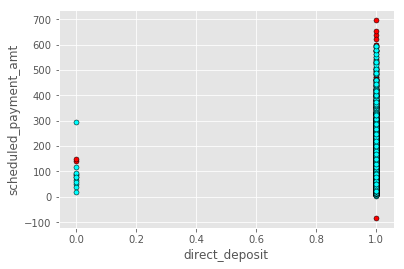

('Variables:', 'past_due_amt', 'direct_deposit')


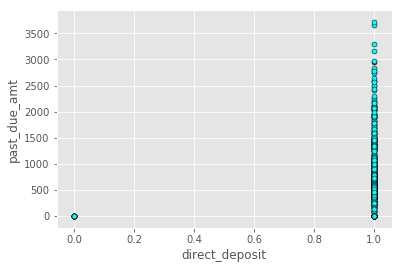

('Variables:', 'account_payment_method', 'direct_deposit')


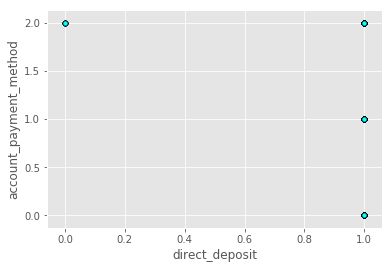

('Variables:', 'days_past_due', 'direct_deposit')


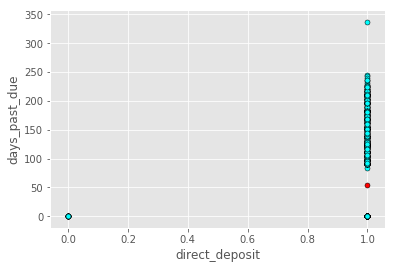

('Variables:', 'number_of_payments', 'direct_deposit')


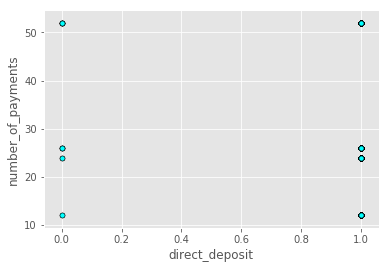

('Variables:', 'data_correction', 'direct_deposit')


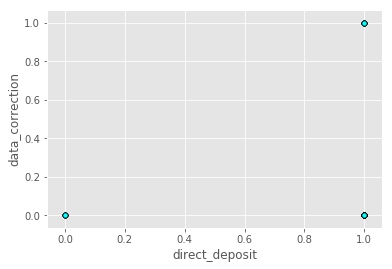

('Variables:', 'source', 'direct_deposit')


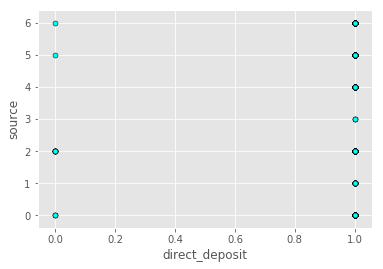

('Variables:', 'initial_decision', 'direct_deposit')


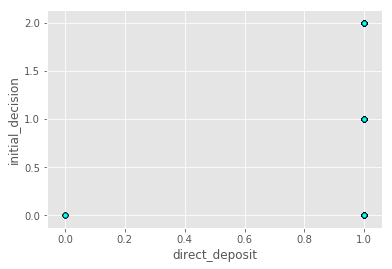

('Variables:', 'age', 'direct_deposit')


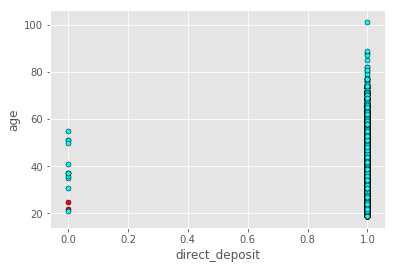

('Variables:', 'approval_amount', 'language_preference')


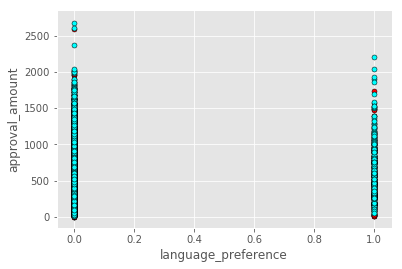

('Variables:', 'recommendation', 'language_preference')


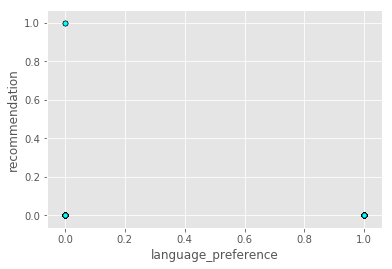

('Variables:', 'contacted', 'language_preference')


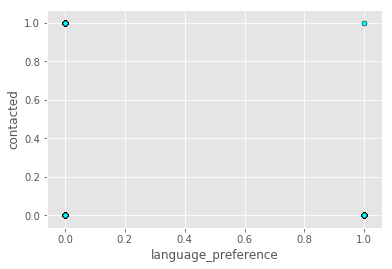

('Variables:', 'email_contacted_ts', 'language_preference')


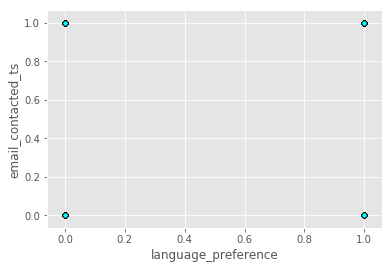

('Variables:', 'sms_contacted_ts', 'language_preference')


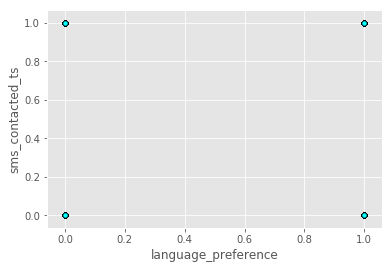

('Variables:', 'state', 'language_preference')


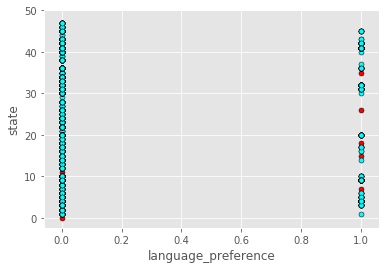

('Variables:', 'city', 'language_preference')


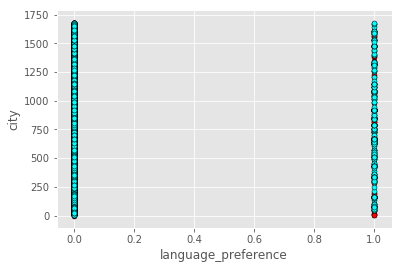

('Variables:', 'zip_code', 'language_preference')


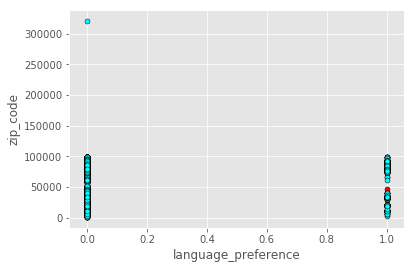

('Variables:', 'rent_or_own', 'language_preference')


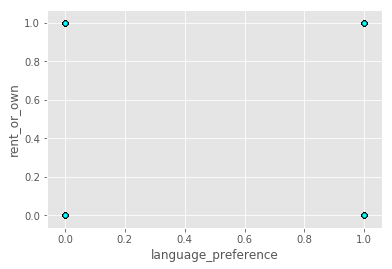

('Variables:', 'months_at_current_residence', 'language_preference')


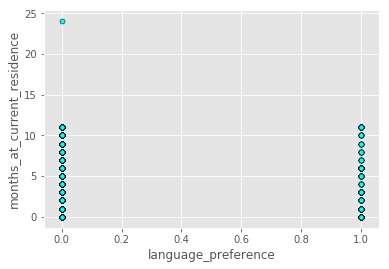

('Variables:', 'years_at_current_residence', 'language_preference')


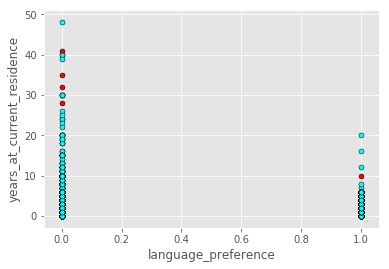

('Variables:', 'direct_deposit', 'language_preference')


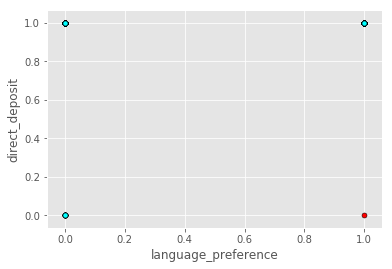

('Variables:', 'payment_frequency', 'language_preference')


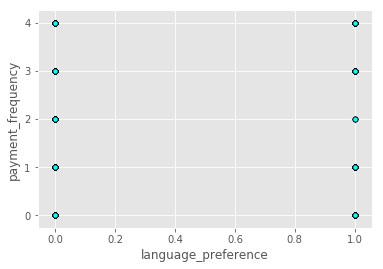

('Variables:', 'scheduled_payment_amt', 'language_preference')


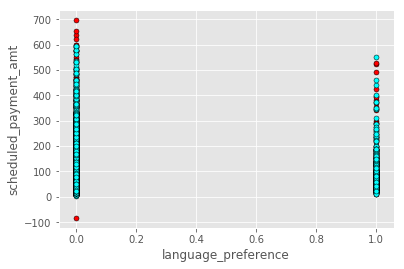

('Variables:', 'past_due_amt', 'language_preference')


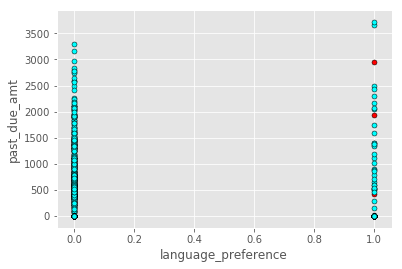

('Variables:', 'account_payment_method', 'language_preference')


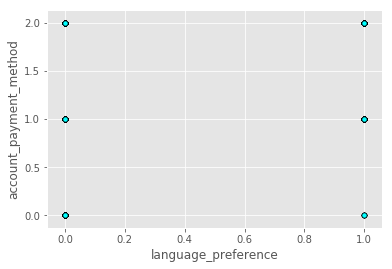

('Variables:', 'days_past_due', 'language_preference')


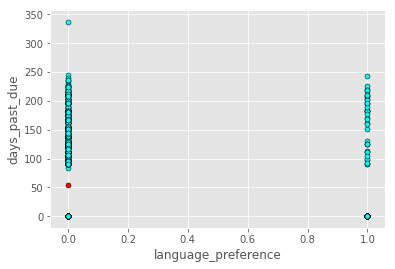

('Variables:', 'number_of_payments', 'language_preference')


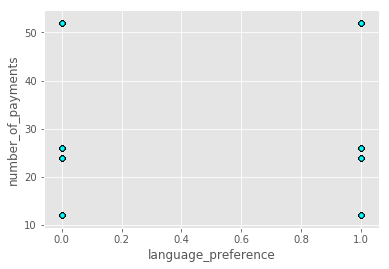

('Variables:', 'data_correction', 'language_preference')


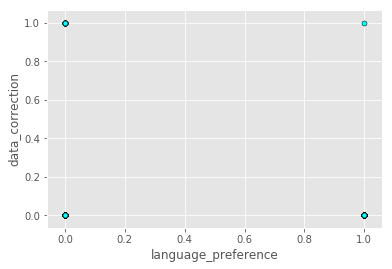

('Variables:', 'source', 'language_preference')


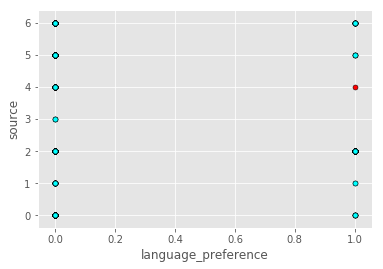

('Variables:', 'initial_decision', 'language_preference')


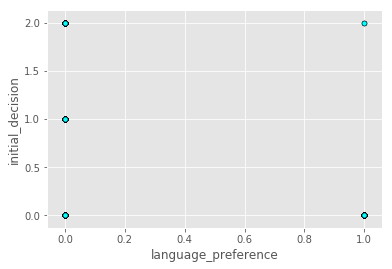

('Variables:', 'age', 'language_preference')


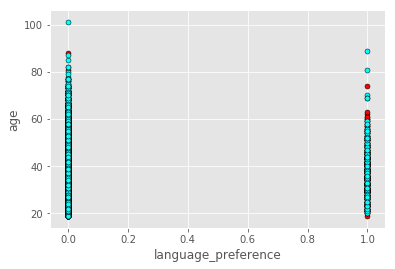

('Variables:', 'approval_amount', 'payment_frequency')


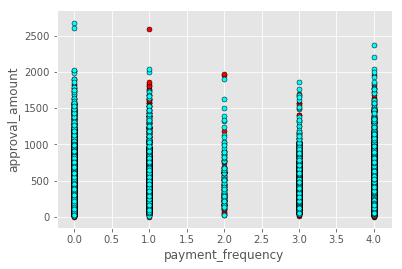

('Variables:', 'recommendation', 'payment_frequency')


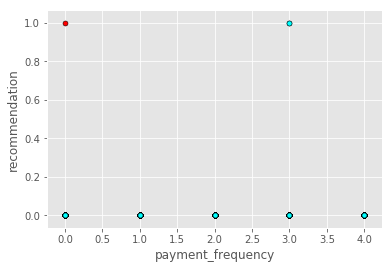

('Variables:', 'contacted', 'payment_frequency')


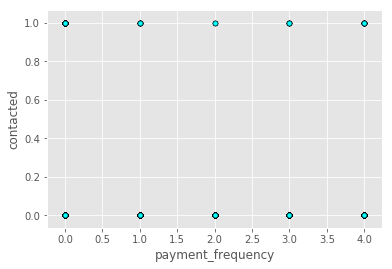

('Variables:', 'email_contacted_ts', 'payment_frequency')


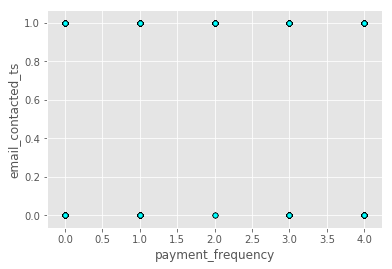

('Variables:', 'sms_contacted_ts', 'payment_frequency')


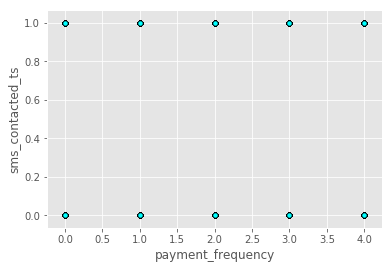

('Variables:', 'state', 'payment_frequency')


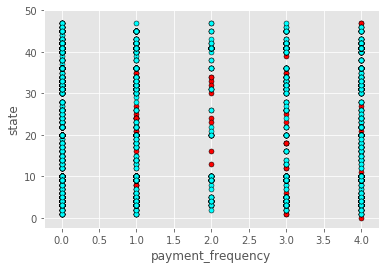

('Variables:', 'city', 'payment_frequency')


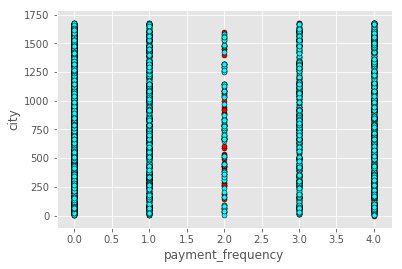

('Variables:', 'zip_code', 'payment_frequency')


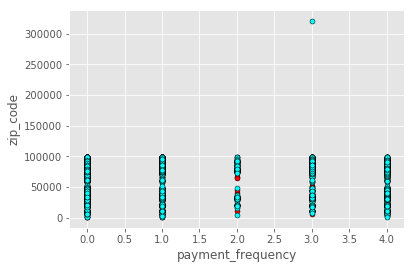

('Variables:', 'rent_or_own', 'payment_frequency')


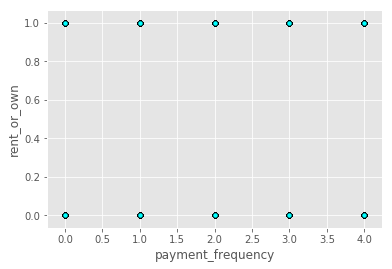

('Variables:', 'months_at_current_residence', 'payment_frequency')


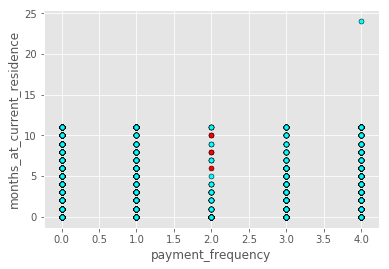

('Variables:', 'years_at_current_residence', 'payment_frequency')


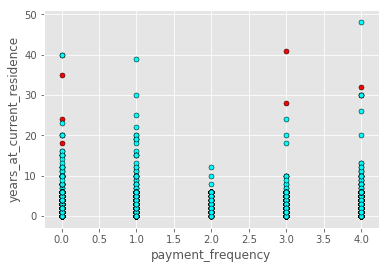

('Variables:', 'direct_deposit', 'payment_frequency')


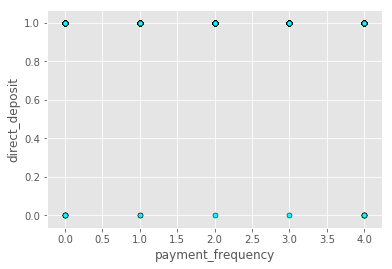

('Variables:', 'language_preference', 'payment_frequency')


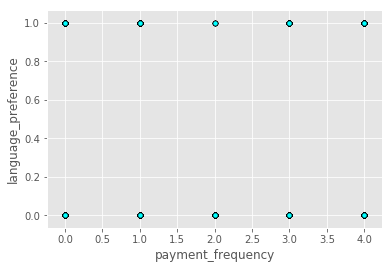

('Variables:', 'scheduled_payment_amt', 'payment_frequency')


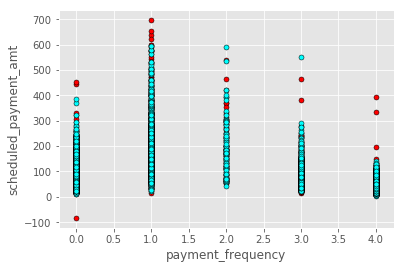

('Variables:', 'past_due_amt', 'payment_frequency')


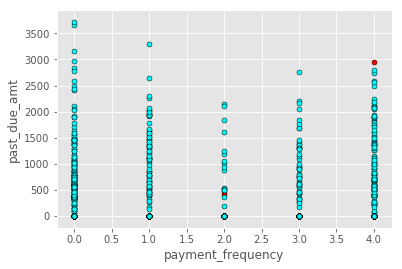

('Variables:', 'account_payment_method', 'payment_frequency')


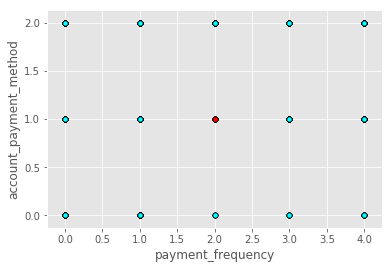

('Variables:', 'days_past_due', 'payment_frequency')


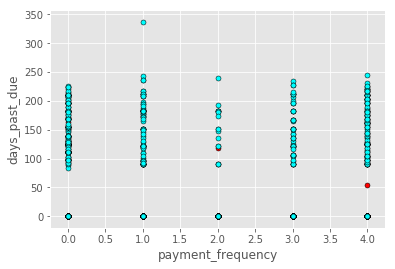

('Variables:', 'number_of_payments', 'payment_frequency')


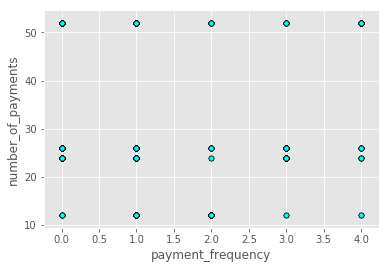

('Variables:', 'data_correction', 'payment_frequency')


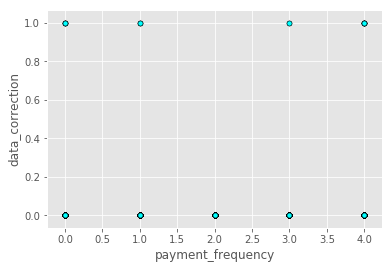

('Variables:', 'source', 'payment_frequency')


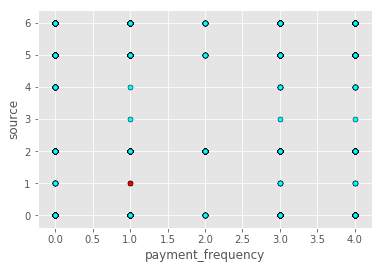

('Variables:', 'initial_decision', 'payment_frequency')


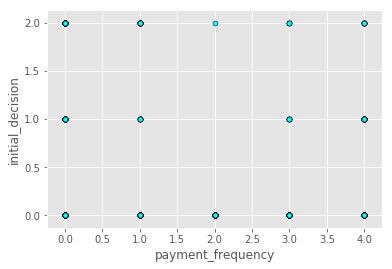

('Variables:', 'age', 'payment_frequency')


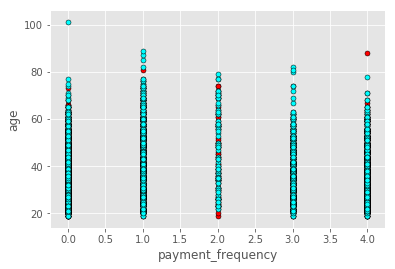

('Variables:', 'approval_amount', 'scheduled_payment_amt')


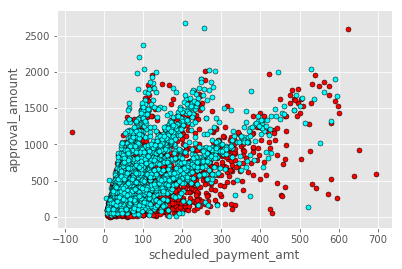

('Variables:', 'recommendation', 'scheduled_payment_amt')


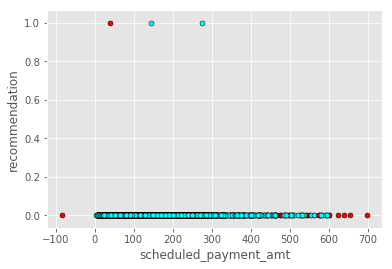

('Variables:', 'contacted', 'scheduled_payment_amt')


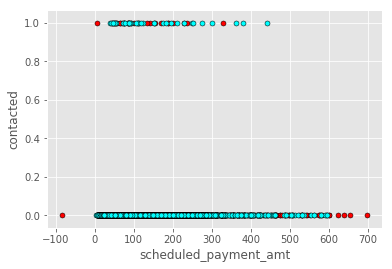

('Variables:', 'email_contacted_ts', 'scheduled_payment_amt')


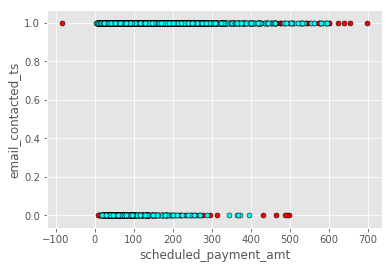

('Variables:', 'sms_contacted_ts', 'scheduled_payment_amt')


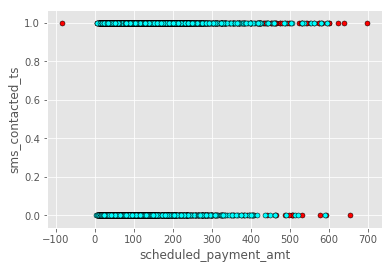

('Variables:', 'state', 'scheduled_payment_amt')


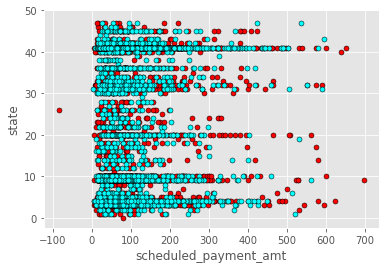

('Variables:', 'city', 'scheduled_payment_amt')


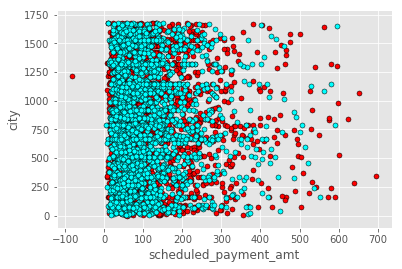

('Variables:', 'zip_code', 'scheduled_payment_amt')


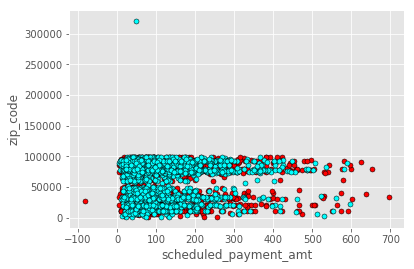

('Variables:', 'rent_or_own', 'scheduled_payment_amt')


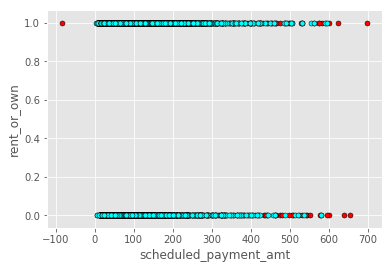

('Variables:', 'months_at_current_residence', 'scheduled_payment_amt')


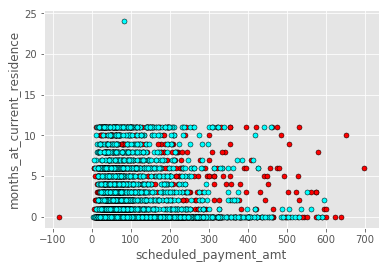

('Variables:', 'years_at_current_residence', 'scheduled_payment_amt')


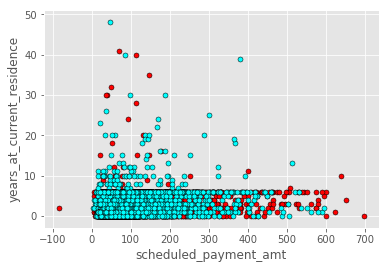

('Variables:', 'direct_deposit', 'scheduled_payment_amt')


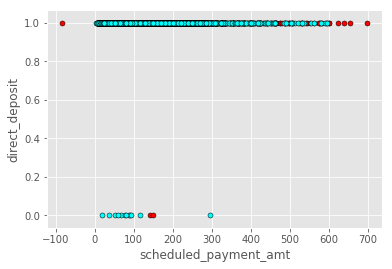

('Variables:', 'language_preference', 'scheduled_payment_amt')


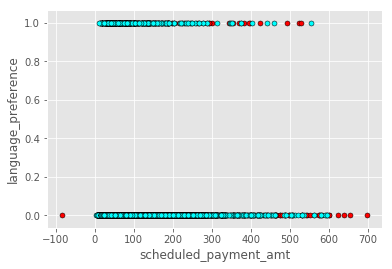

('Variables:', 'payment_frequency', 'scheduled_payment_amt')


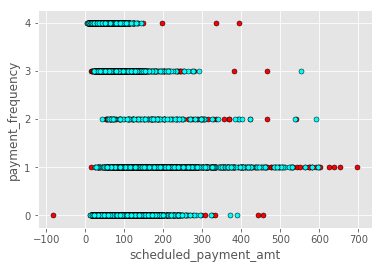

('Variables:', 'past_due_amt', 'scheduled_payment_amt')


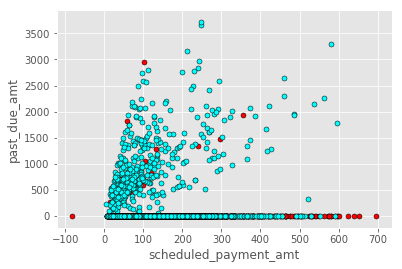

('Variables:', 'account_payment_method', 'scheduled_payment_amt')


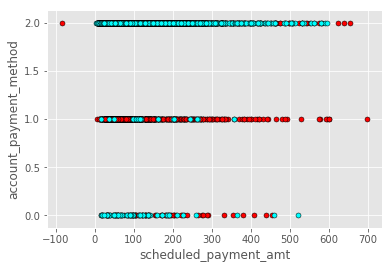

('Variables:', 'days_past_due', 'scheduled_payment_amt')


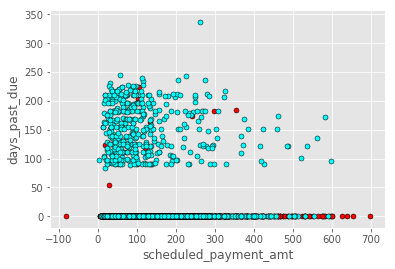

('Variables:', 'number_of_payments', 'scheduled_payment_amt')


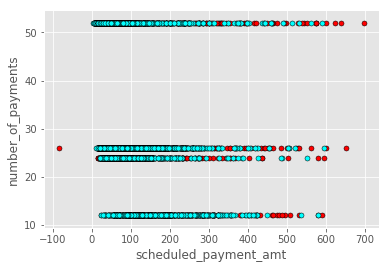

('Variables:', 'data_correction', 'scheduled_payment_amt')


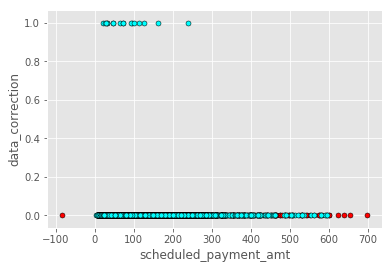

('Variables:', 'source', 'scheduled_payment_amt')


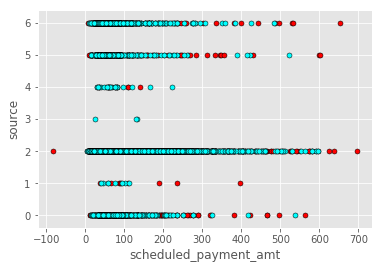

('Variables:', 'initial_decision', 'scheduled_payment_amt')


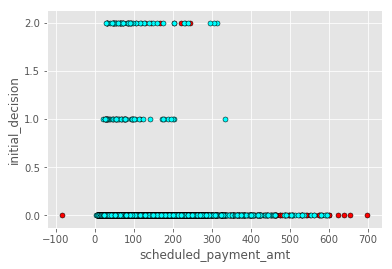

('Variables:', 'age', 'scheduled_payment_amt')


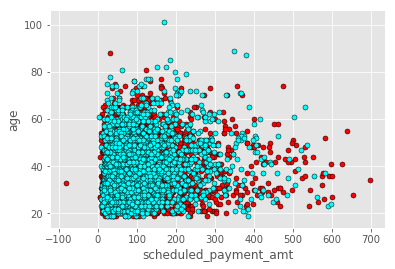

('Variables:', 'approval_amount', 'past_due_amt')


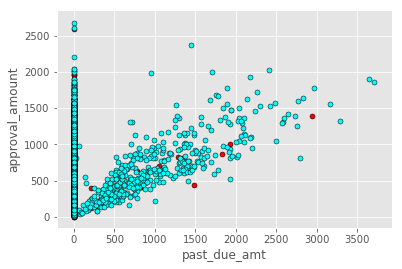

('Variables:', 'recommendation', 'past_due_amt')


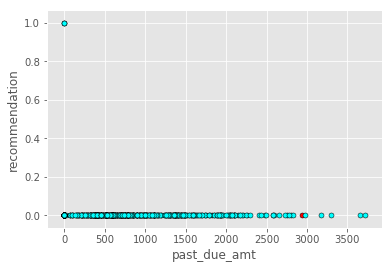

('Variables:', 'contacted', 'past_due_amt')


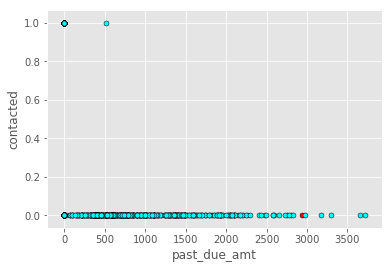

('Variables:', 'email_contacted_ts', 'past_due_amt')


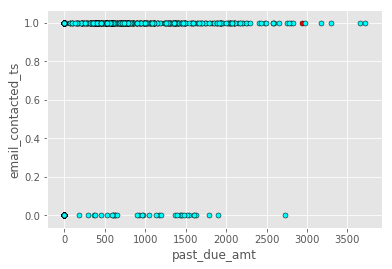

('Variables:', 'sms_contacted_ts', 'past_due_amt')


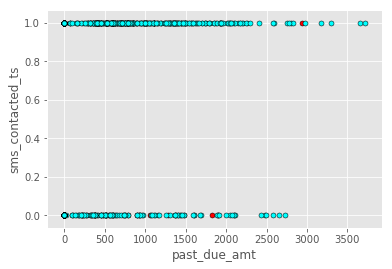

('Variables:', 'state', 'past_due_amt')


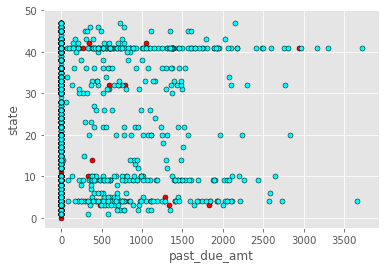

('Variables:', 'city', 'past_due_amt')


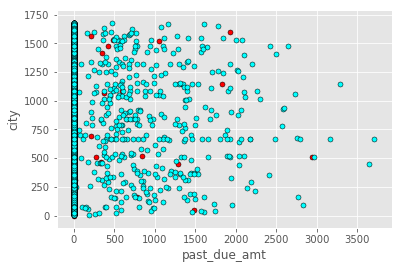

('Variables:', 'zip_code', 'past_due_amt')


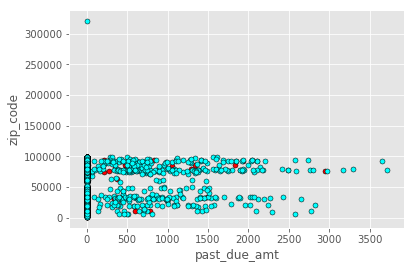

('Variables:', 'rent_or_own', 'past_due_amt')


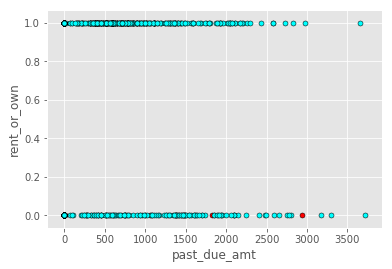

('Variables:', 'months_at_current_residence', 'past_due_amt')


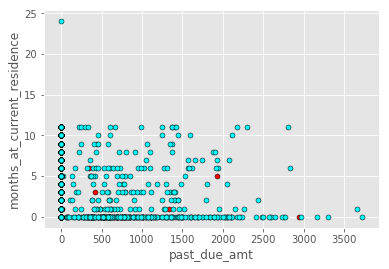

('Variables:', 'years_at_current_residence', 'past_due_amt')


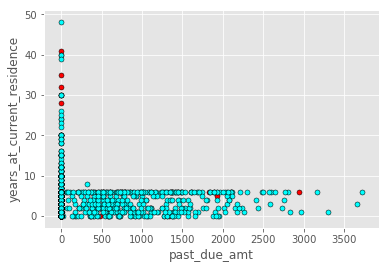

('Variables:', 'direct_deposit', 'past_due_amt')


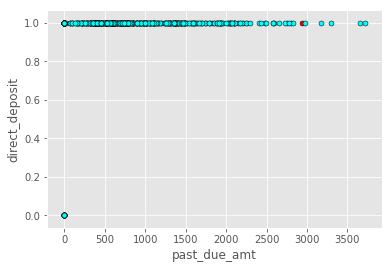

('Variables:', 'language_preference', 'past_due_amt')


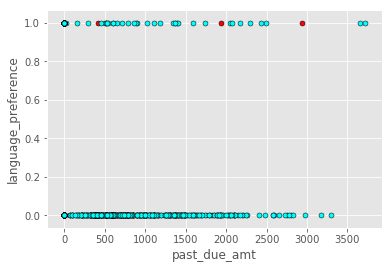

('Variables:', 'payment_frequency', 'past_due_amt')


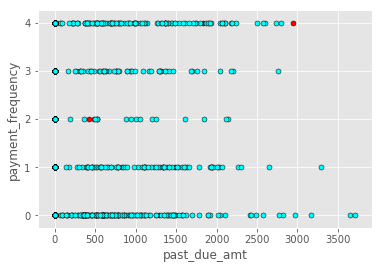

('Variables:', 'scheduled_payment_amt', 'past_due_amt')


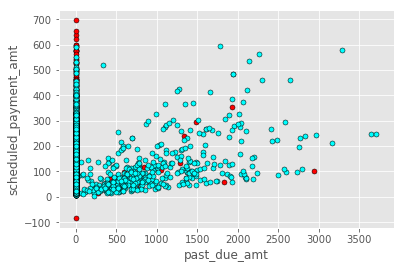

('Variables:', 'account_payment_method', 'past_due_amt')


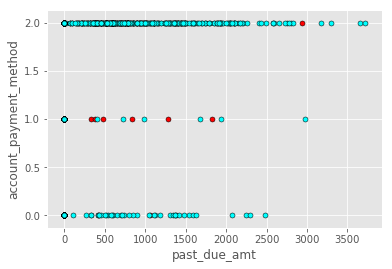

('Variables:', 'days_past_due', 'past_due_amt')


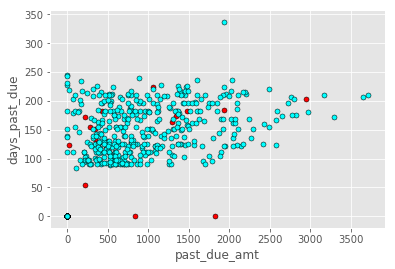

('Variables:', 'number_of_payments', 'past_due_amt')


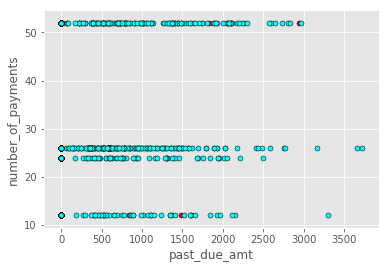

('Variables:', 'data_correction', 'past_due_amt')


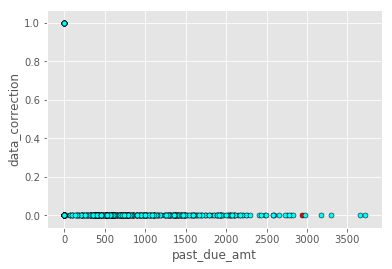

('Variables:', 'source', 'past_due_amt')


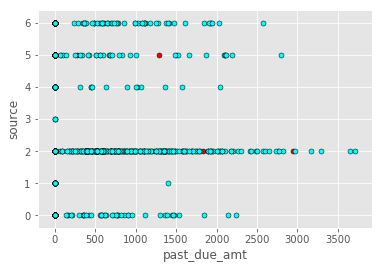

('Variables:', 'initial_decision', 'past_due_amt')


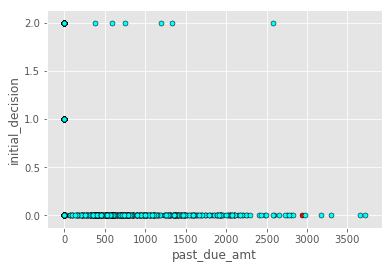

('Variables:', 'age', 'past_due_amt')


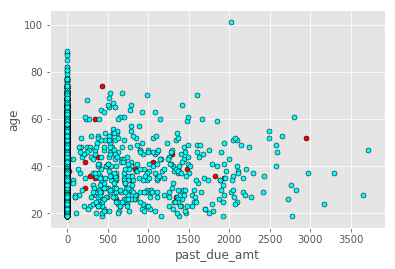

('Variables:', 'approval_amount', 'account_payment_method')


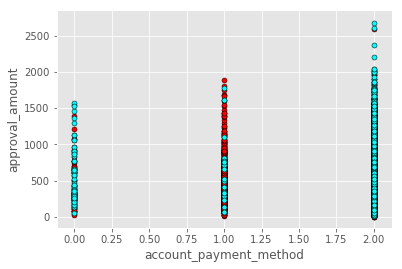

('Variables:', 'recommendation', 'account_payment_method')


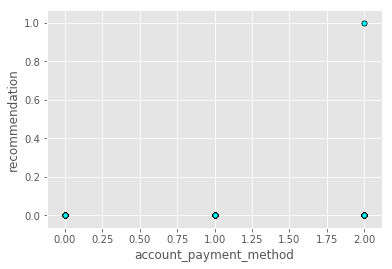

('Variables:', 'contacted', 'account_payment_method')


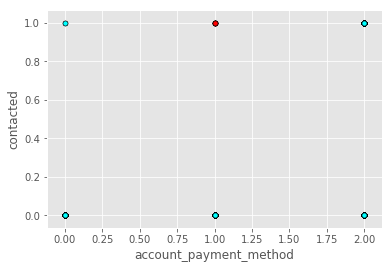

('Variables:', 'email_contacted_ts', 'account_payment_method')


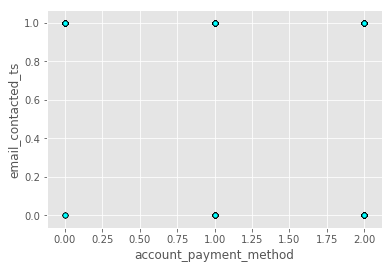

('Variables:', 'sms_contacted_ts', 'account_payment_method')


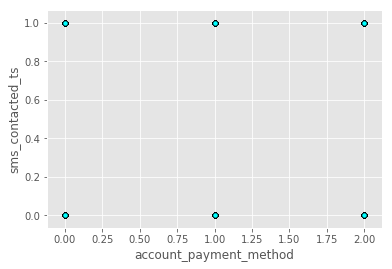

('Variables:', 'state', 'account_payment_method')


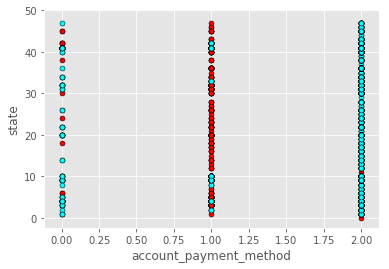

('Variables:', 'city', 'account_payment_method')


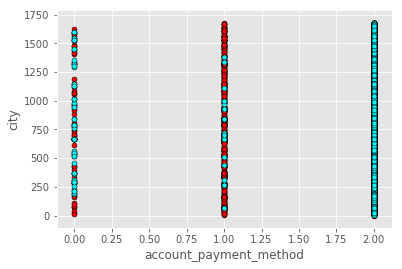

('Variables:', 'zip_code', 'account_payment_method')


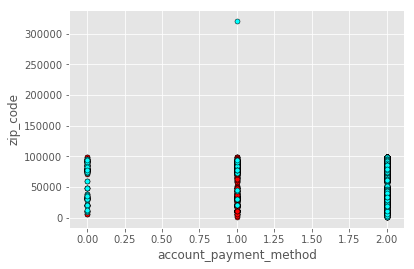

('Variables:', 'rent_or_own', 'account_payment_method')


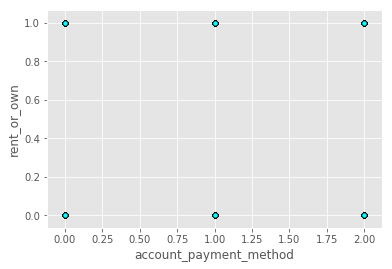

('Variables:', 'months_at_current_residence', 'account_payment_method')


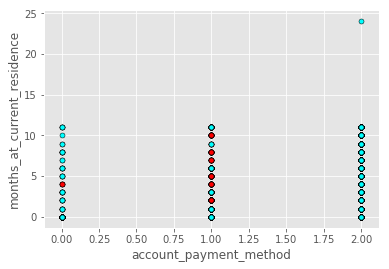

('Variables:', 'years_at_current_residence', 'account_payment_method')


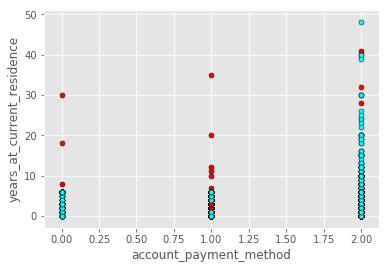

('Variables:', 'direct_deposit', 'account_payment_method')


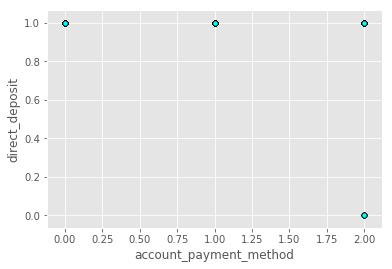

('Variables:', 'language_preference', 'account_payment_method')


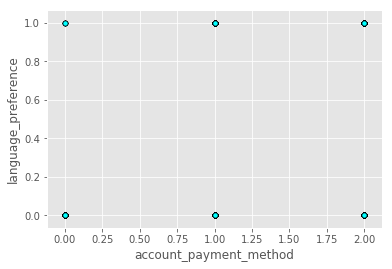

('Variables:', 'payment_frequency', 'account_payment_method')


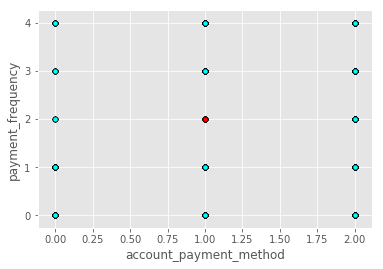

('Variables:', 'scheduled_payment_amt', 'account_payment_method')


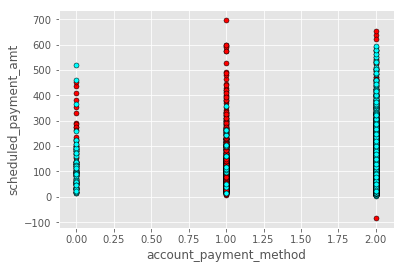

('Variables:', 'past_due_amt', 'account_payment_method')


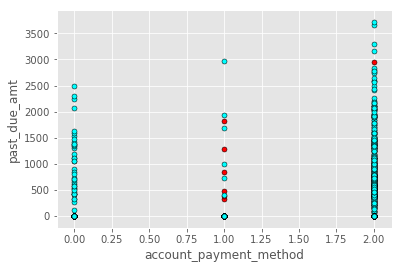

('Variables:', 'days_past_due', 'account_payment_method')


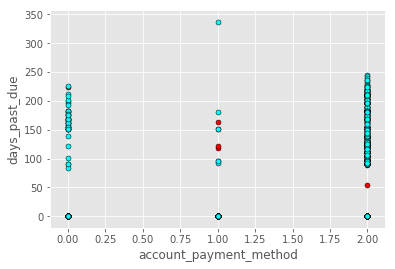

('Variables:', 'number_of_payments', 'account_payment_method')


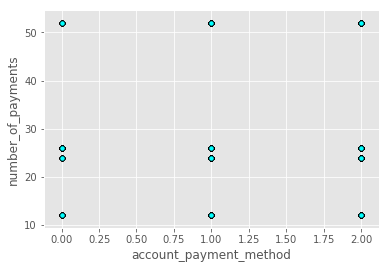

('Variables:', 'data_correction', 'account_payment_method')


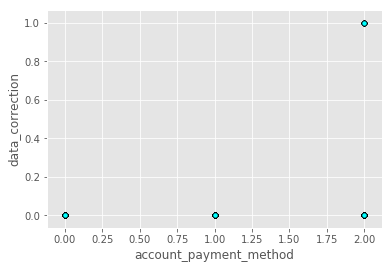

('Variables:', 'source', 'account_payment_method')


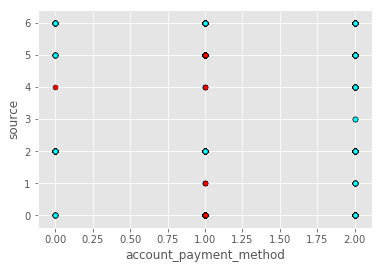

('Variables:', 'initial_decision', 'account_payment_method')


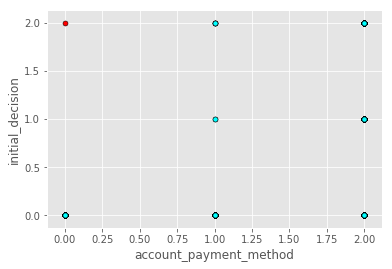

('Variables:', 'age', 'account_payment_method')


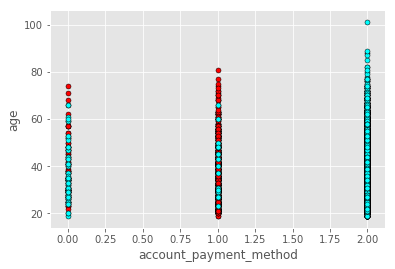

('Variables:', 'approval_amount', 'days_past_due')


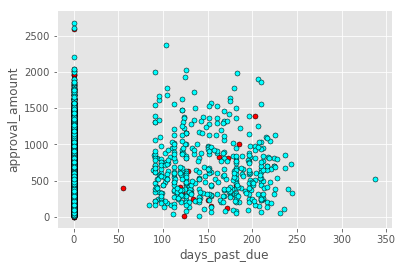

('Variables:', 'recommendation', 'days_past_due')


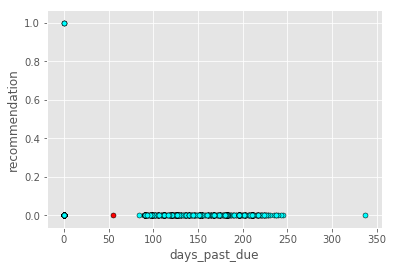

('Variables:', 'contacted', 'days_past_due')


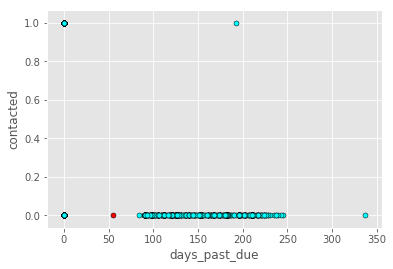

('Variables:', 'email_contacted_ts', 'days_past_due')


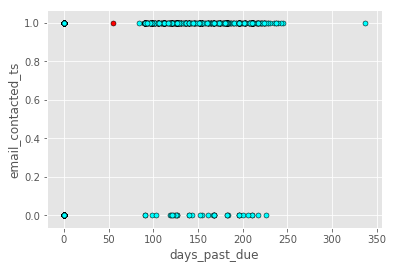

('Variables:', 'sms_contacted_ts', 'days_past_due')


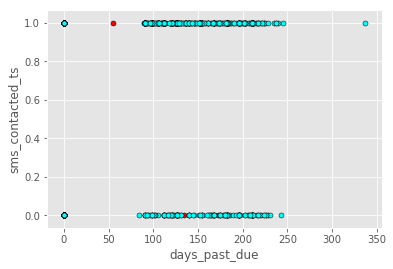

('Variables:', 'state', 'days_past_due')


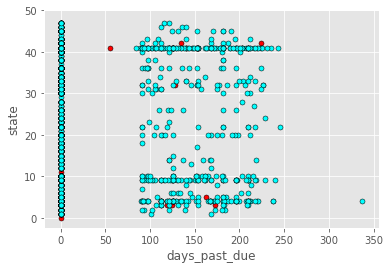

('Variables:', 'city', 'days_past_due')


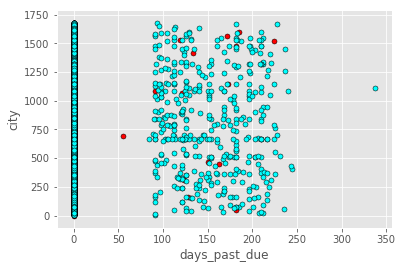

('Variables:', 'zip_code', 'days_past_due')


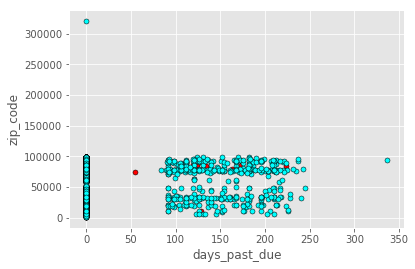

('Variables:', 'rent_or_own', 'days_past_due')


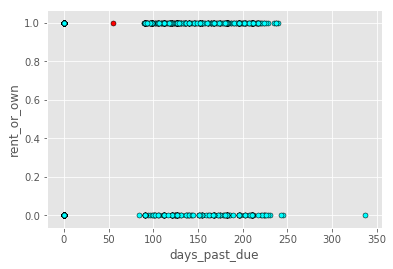

('Variables:', 'months_at_current_residence', 'days_past_due')


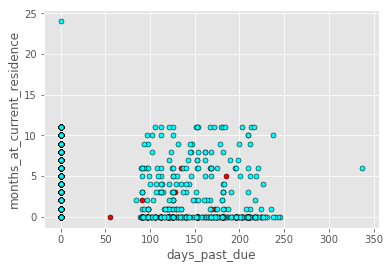

('Variables:', 'years_at_current_residence', 'days_past_due')


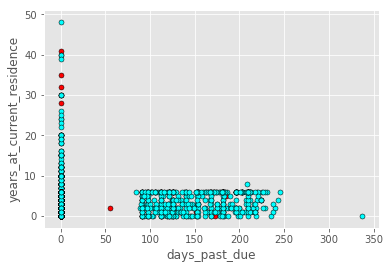

('Variables:', 'direct_deposit', 'days_past_due')


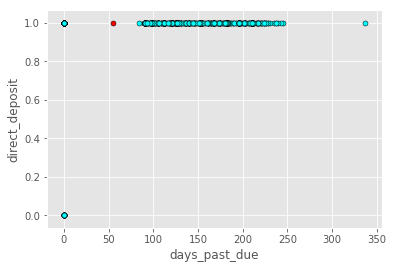

('Variables:', 'language_preference', 'days_past_due')


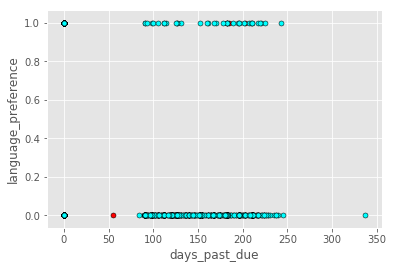

('Variables:', 'payment_frequency', 'days_past_due')


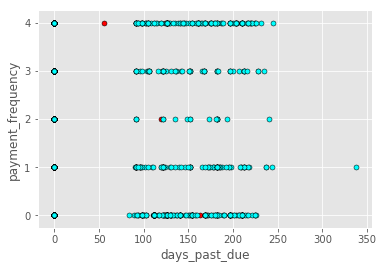

('Variables:', 'scheduled_payment_amt', 'days_past_due')


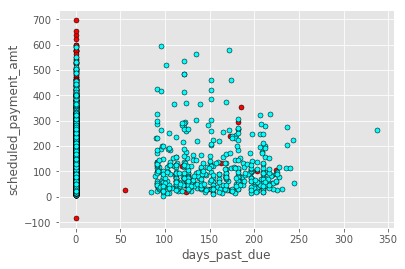

('Variables:', 'past_due_amt', 'days_past_due')


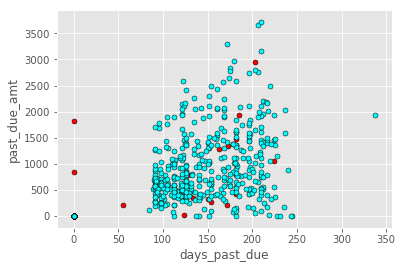

('Variables:', 'account_payment_method', 'days_past_due')


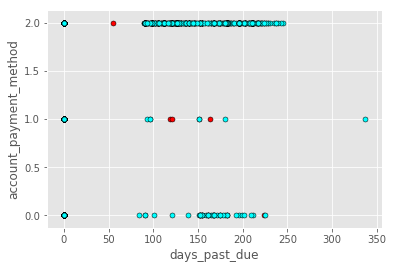

('Variables:', 'number_of_payments', 'days_past_due')


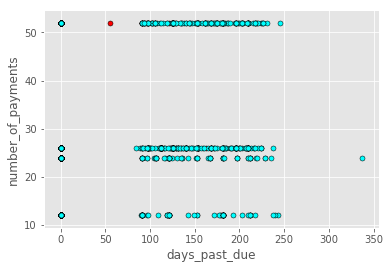

('Variables:', 'data_correction', 'days_past_due')


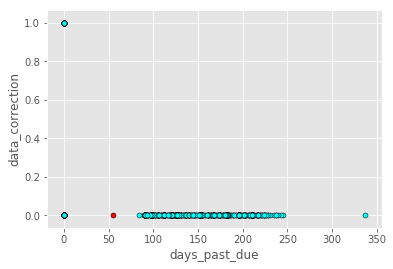

('Variables:', 'source', 'days_past_due')


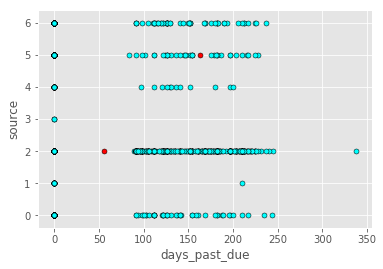

('Variables:', 'initial_decision', 'days_past_due')


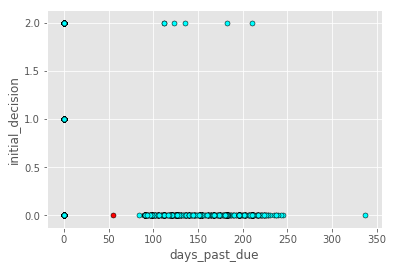

('Variables:', 'age', 'days_past_due')


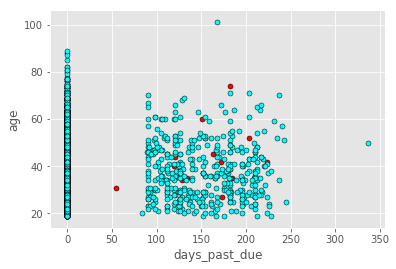

('Variables:', 'approval_amount', 'number_of_payments')


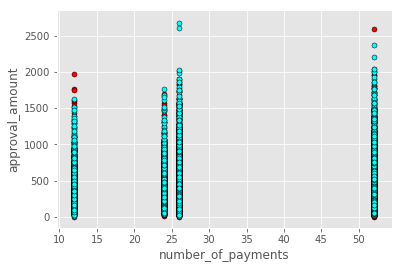

('Variables:', 'recommendation', 'number_of_payments')


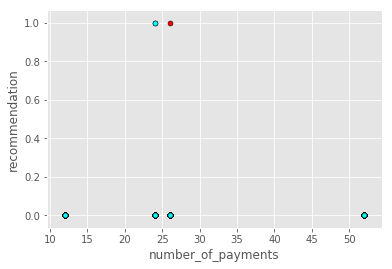

('Variables:', 'contacted', 'number_of_payments')


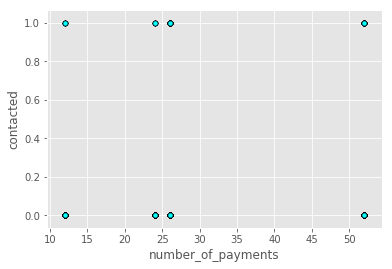

('Variables:', 'email_contacted_ts', 'number_of_payments')


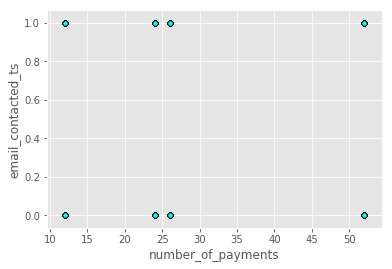

('Variables:', 'sms_contacted_ts', 'number_of_payments')


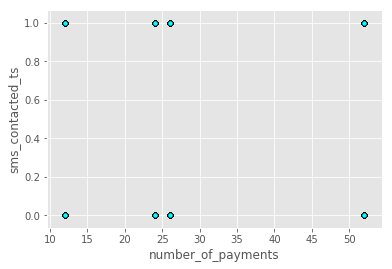

('Variables:', 'state', 'number_of_payments')


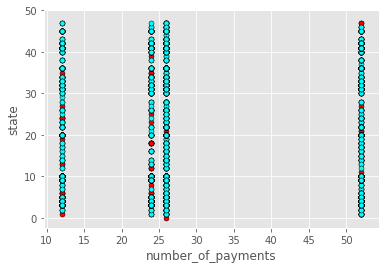

('Variables:', 'city', 'number_of_payments')


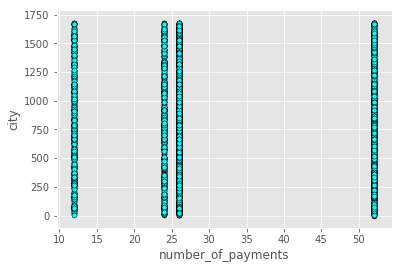

('Variables:', 'zip_code', 'number_of_payments')


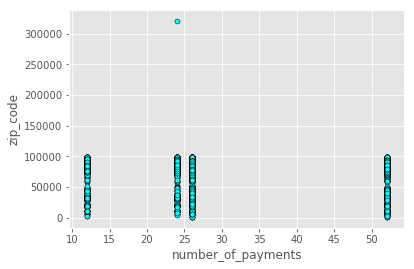

('Variables:', 'rent_or_own', 'number_of_payments')


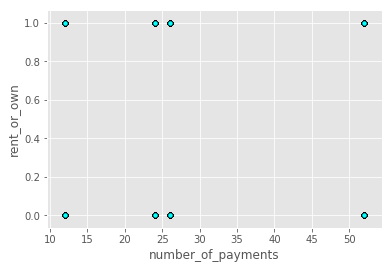

('Variables:', 'months_at_current_residence', 'number_of_payments')


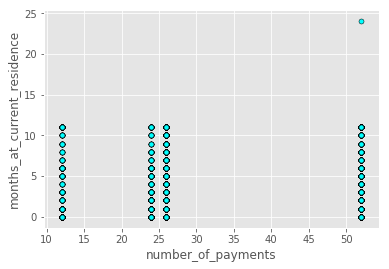

('Variables:', 'years_at_current_residence', 'number_of_payments')


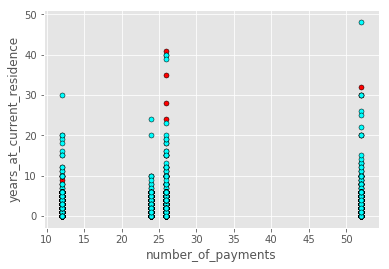

('Variables:', 'direct_deposit', 'number_of_payments')


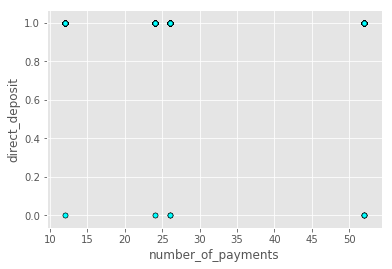

('Variables:', 'language_preference', 'number_of_payments')


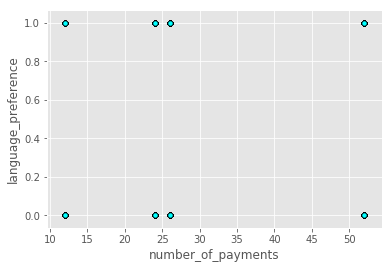

('Variables:', 'payment_frequency', 'number_of_payments')


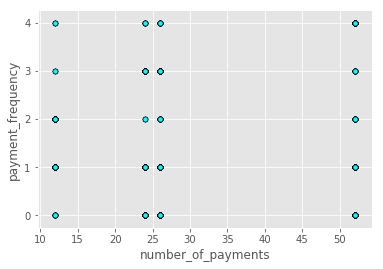

('Variables:', 'scheduled_payment_amt', 'number_of_payments')


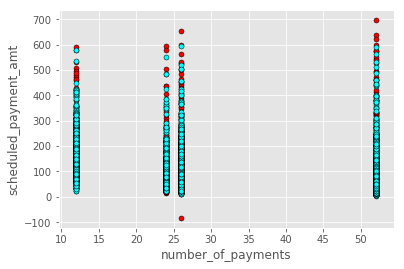

('Variables:', 'past_due_amt', 'number_of_payments')


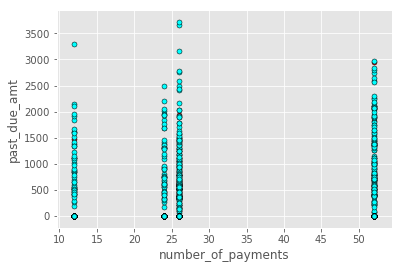

('Variables:', 'account_payment_method', 'number_of_payments')


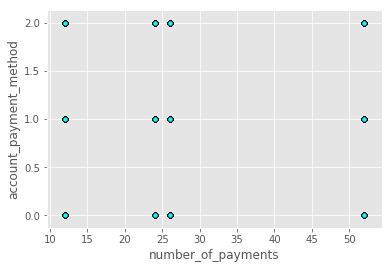

('Variables:', 'days_past_due', 'number_of_payments')


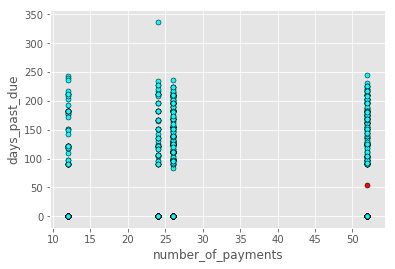

('Variables:', 'data_correction', 'number_of_payments')


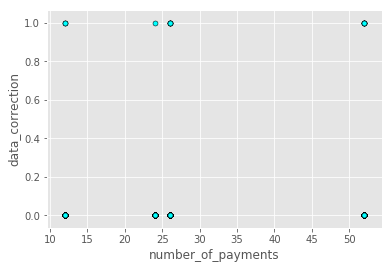

('Variables:', 'source', 'number_of_payments')


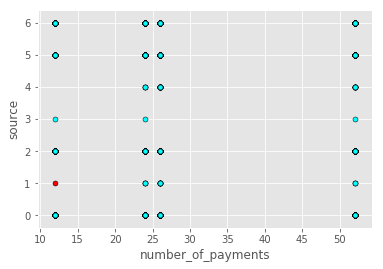

('Variables:', 'initial_decision', 'number_of_payments')


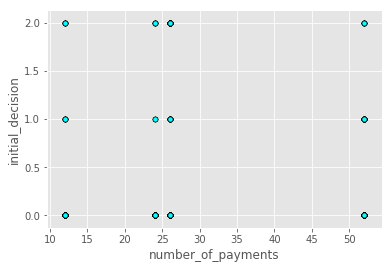

('Variables:', 'age', 'number_of_payments')


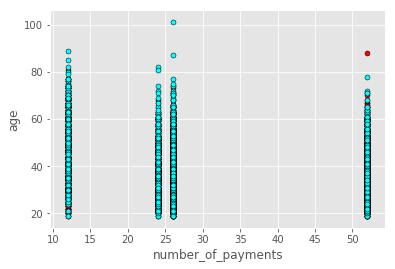

('Variables:', 'approval_amount', 'data_correction')


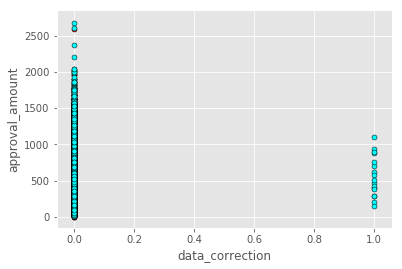

('Variables:', 'recommendation', 'data_correction')


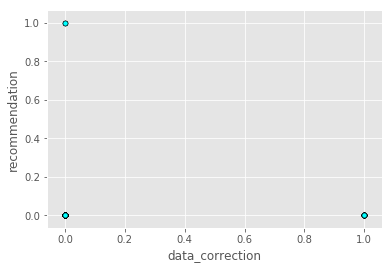

('Variables:', 'contacted', 'data_correction')


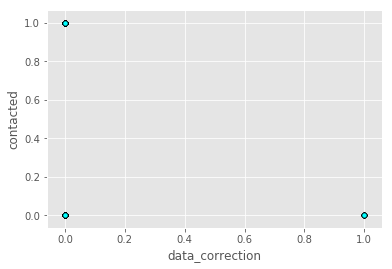

('Variables:', 'email_contacted_ts', 'data_correction')


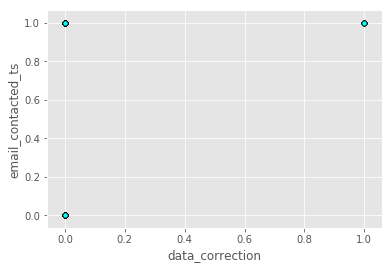

('Variables:', 'sms_contacted_ts', 'data_correction')


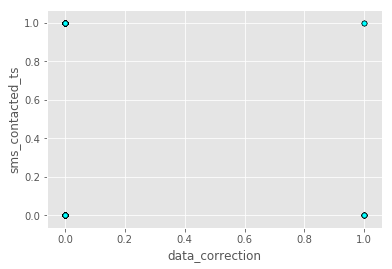

('Variables:', 'state', 'data_correction')


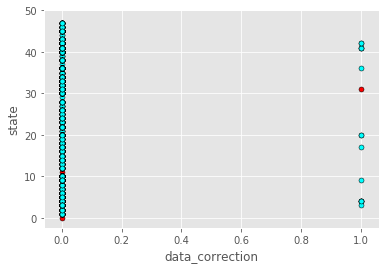

('Variables:', 'city', 'data_correction')


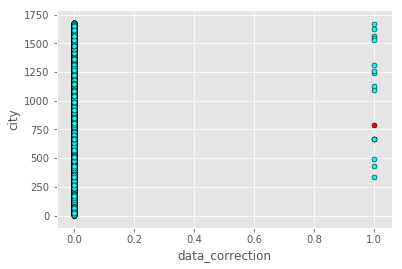

('Variables:', 'zip_code', 'data_correction')


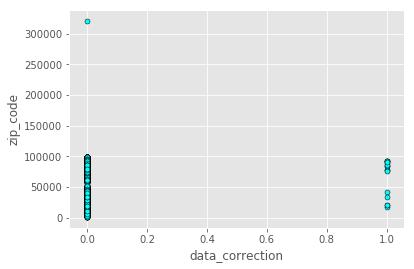

('Variables:', 'rent_or_own', 'data_correction')


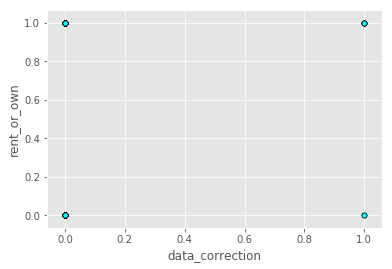

('Variables:', 'months_at_current_residence', 'data_correction')


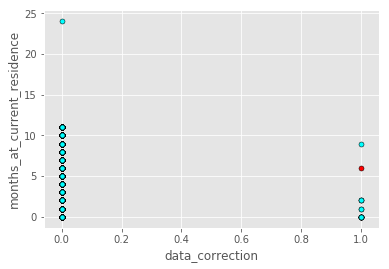

('Variables:', 'years_at_current_residence', 'data_correction')


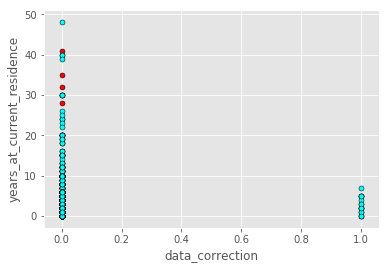

('Variables:', 'direct_deposit', 'data_correction')


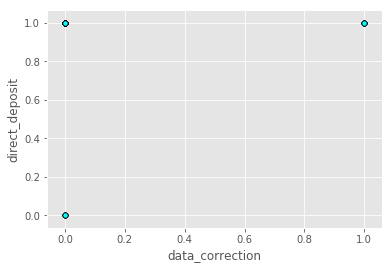

('Variables:', 'language_preference', 'data_correction')


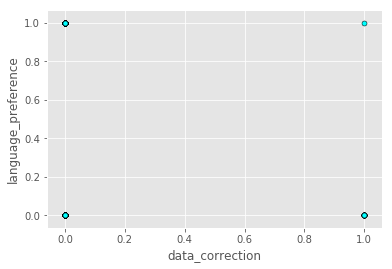

('Variables:', 'payment_frequency', 'data_correction')


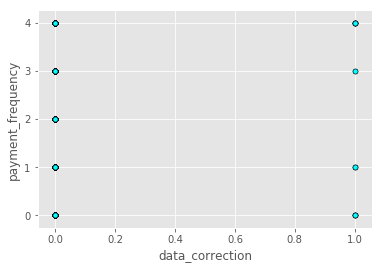

('Variables:', 'scheduled_payment_amt', 'data_correction')


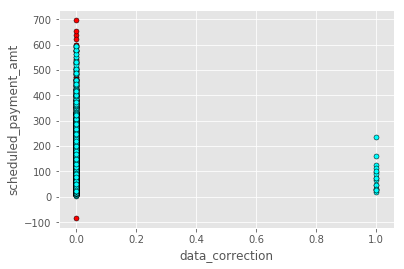

('Variables:', 'past_due_amt', 'data_correction')


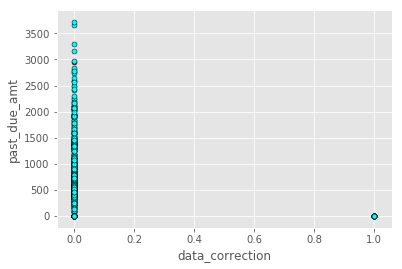

('Variables:', 'account_payment_method', 'data_correction')


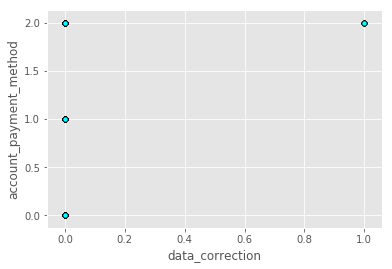

('Variables:', 'days_past_due', 'data_correction')


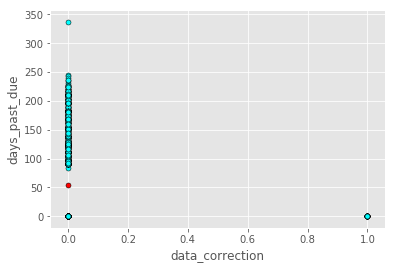

('Variables:', 'number_of_payments', 'data_correction')


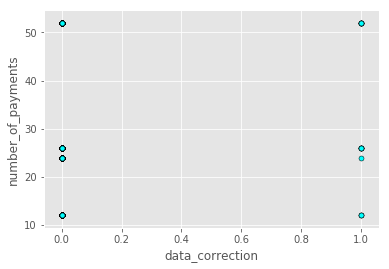

('Variables:', 'source', 'data_correction')


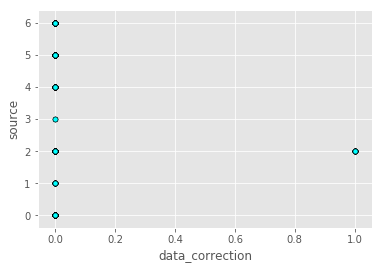

('Variables:', 'initial_decision', 'data_correction')


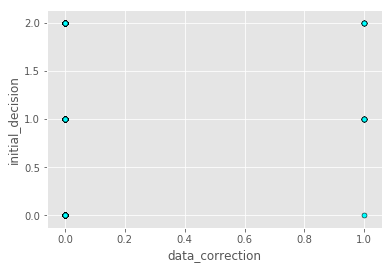

('Variables:', 'age', 'data_correction')


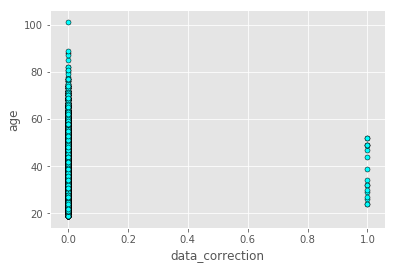

('Variables:', 'approval_amount', 'source')


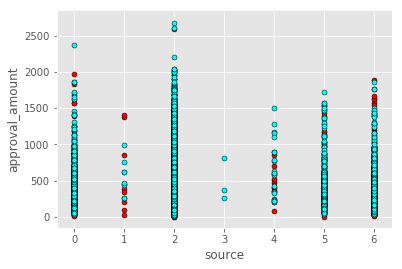

('Variables:', 'recommendation', 'source')


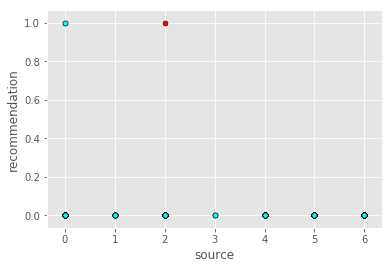

('Variables:', 'contacted', 'source')


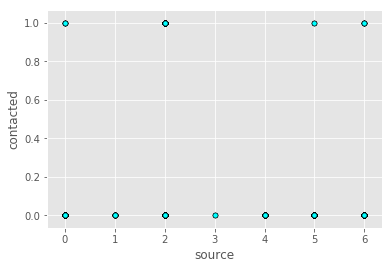

('Variables:', 'email_contacted_ts', 'source')


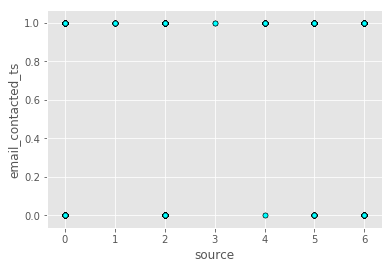

('Variables:', 'sms_contacted_ts', 'source')


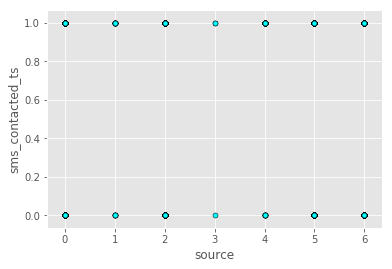

('Variables:', 'state', 'source')


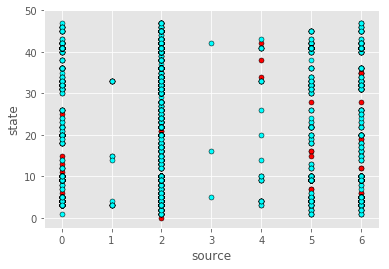

('Variables:', 'city', 'source')


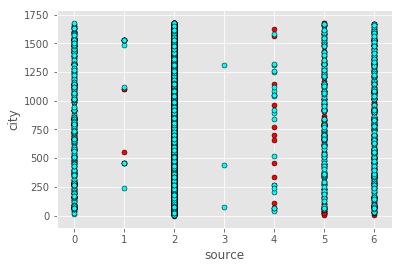

('Variables:', 'zip_code', 'source')


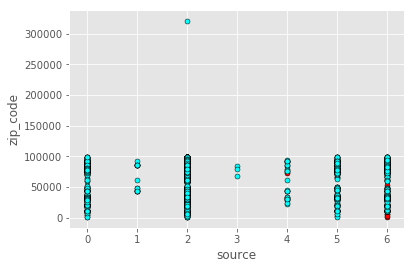

('Variables:', 'rent_or_own', 'source')


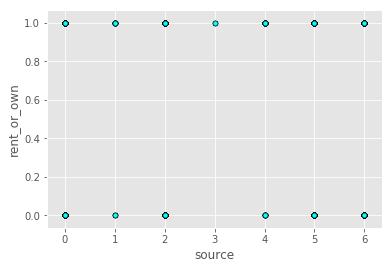

('Variables:', 'months_at_current_residence', 'source')


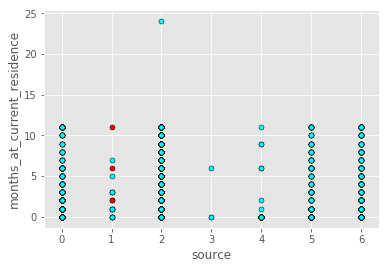

('Variables:', 'years_at_current_residence', 'source')


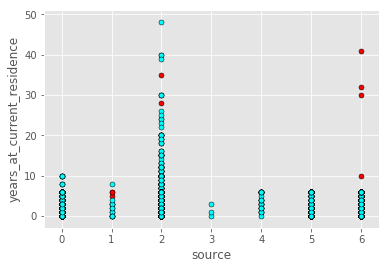

('Variables:', 'direct_deposit', 'source')


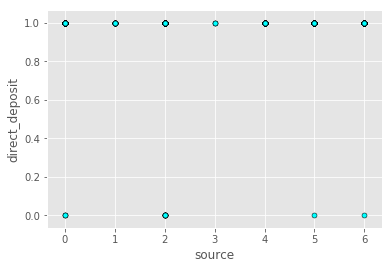

('Variables:', 'language_preference', 'source')


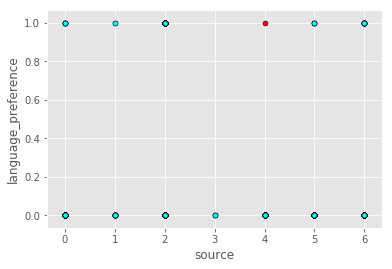

('Variables:', 'payment_frequency', 'source')


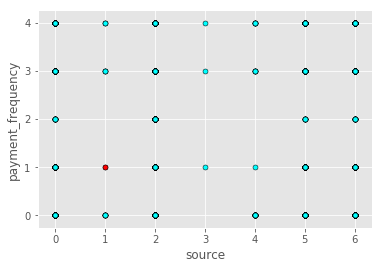

('Variables:', 'scheduled_payment_amt', 'source')


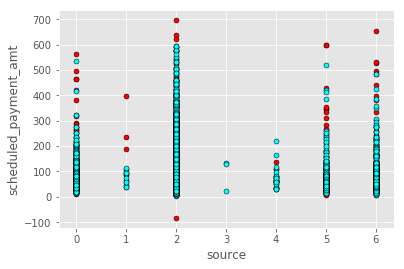

('Variables:', 'past_due_amt', 'source')


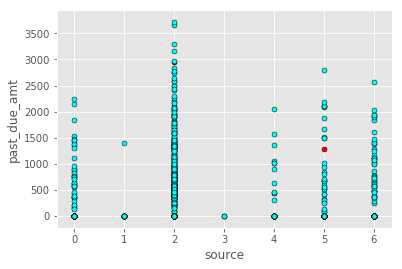

('Variables:', 'account_payment_method', 'source')


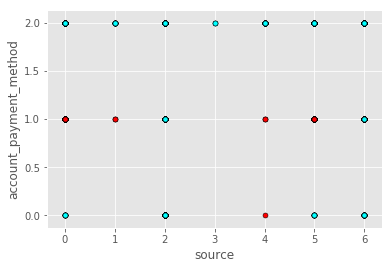

('Variables:', 'days_past_due', 'source')


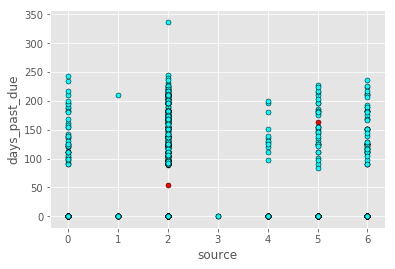

('Variables:', 'number_of_payments', 'source')


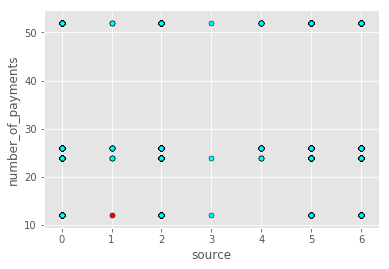

('Variables:', 'data_correction', 'source')


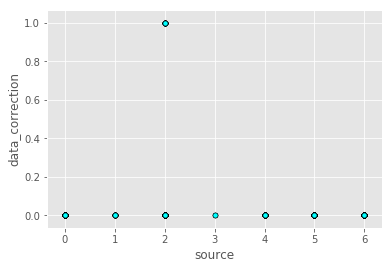

('Variables:', 'initial_decision', 'source')


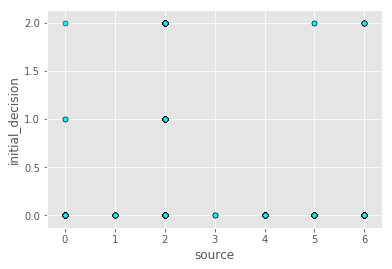

('Variables:', 'age', 'source')


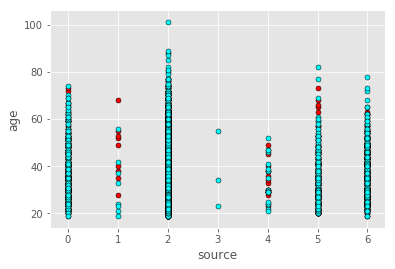

('Variables:', 'approval_amount', 'initial_decision')


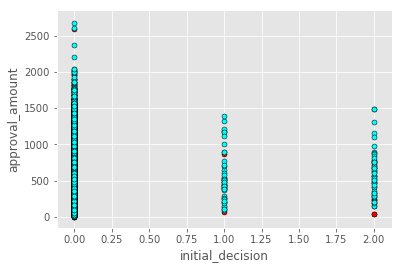

('Variables:', 'recommendation', 'initial_decision')


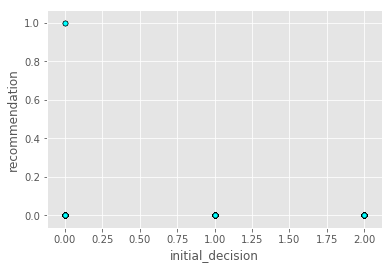

('Variables:', 'contacted', 'initial_decision')


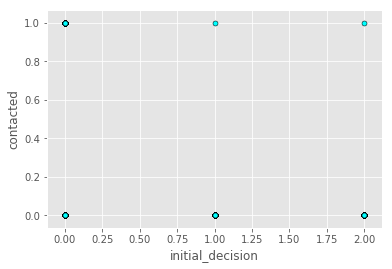

('Variables:', 'email_contacted_ts', 'initial_decision')


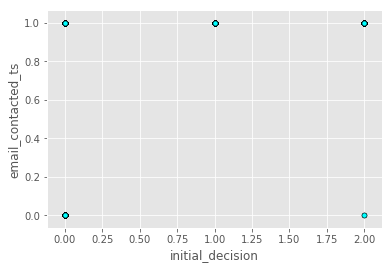

('Variables:', 'sms_contacted_ts', 'initial_decision')


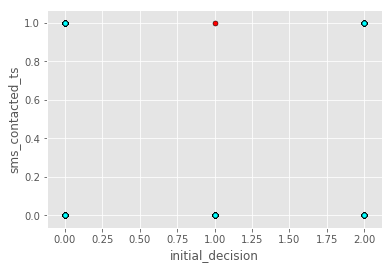

('Variables:', 'state', 'initial_decision')


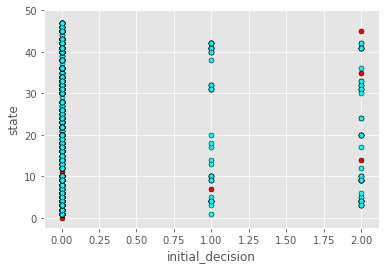

('Variables:', 'city', 'initial_decision')


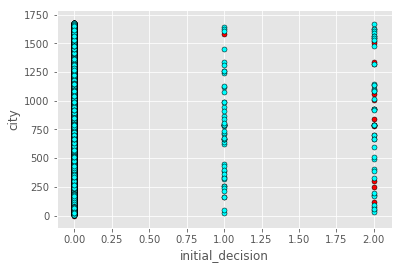

('Variables:', 'zip_code', 'initial_decision')


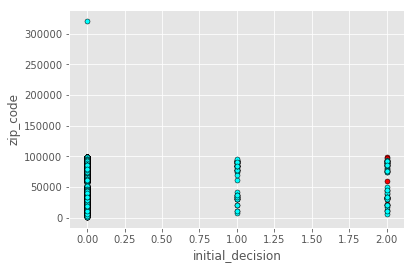

('Variables:', 'rent_or_own', 'initial_decision')


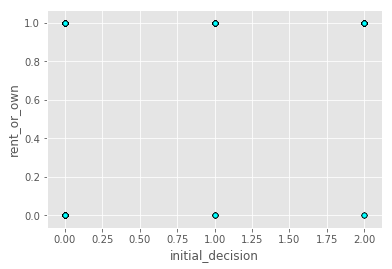

('Variables:', 'months_at_current_residence', 'initial_decision')


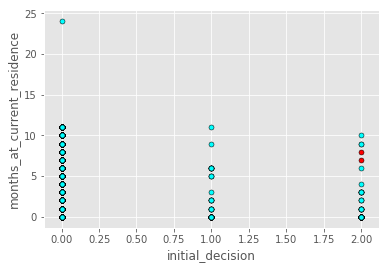

('Variables:', 'years_at_current_residence', 'initial_decision')


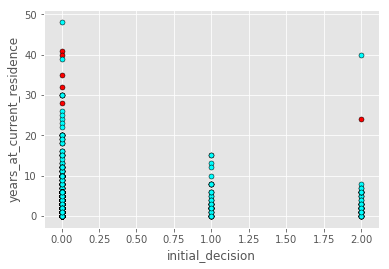

('Variables:', 'direct_deposit', 'initial_decision')


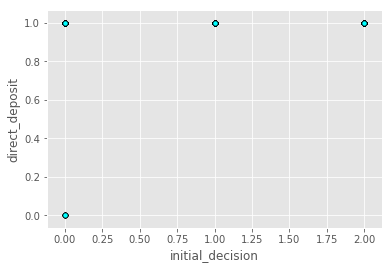

('Variables:', 'language_preference', 'initial_decision')


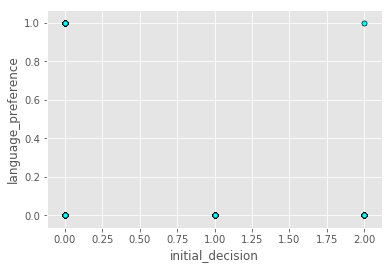

('Variables:', 'payment_frequency', 'initial_decision')


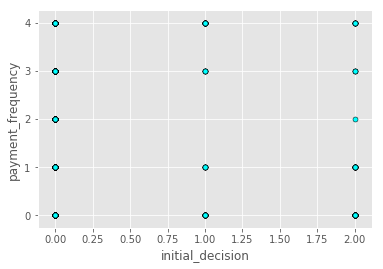

('Variables:', 'scheduled_payment_amt', 'initial_decision')


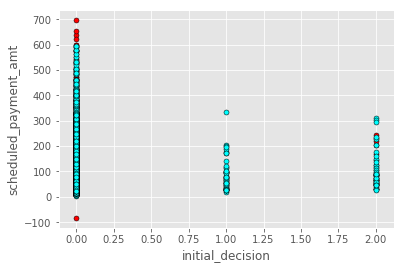

('Variables:', 'past_due_amt', 'initial_decision')


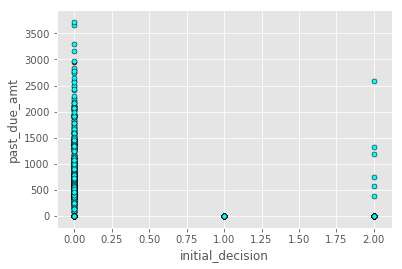

('Variables:', 'account_payment_method', 'initial_decision')


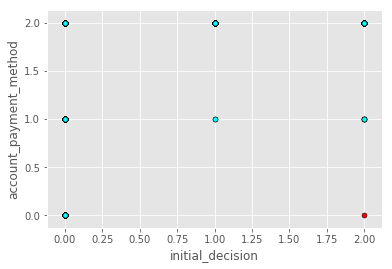

('Variables:', 'days_past_due', 'initial_decision')


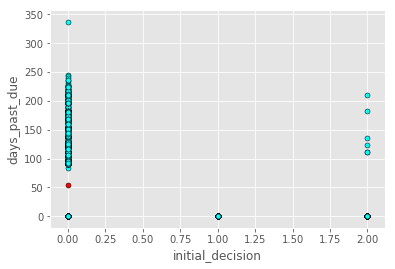

('Variables:', 'number_of_payments', 'initial_decision')


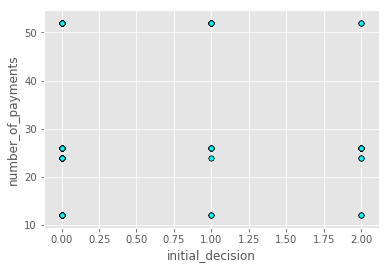

('Variables:', 'data_correction', 'initial_decision')


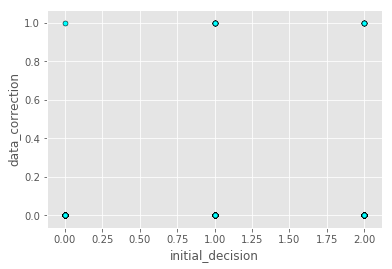

('Variables:', 'source', 'initial_decision')


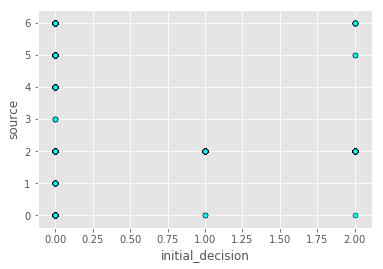

('Variables:', 'age', 'initial_decision')


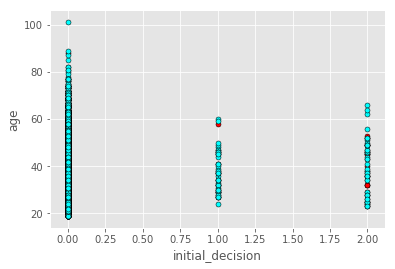

('Variables:', 'approval_amount', 'age')


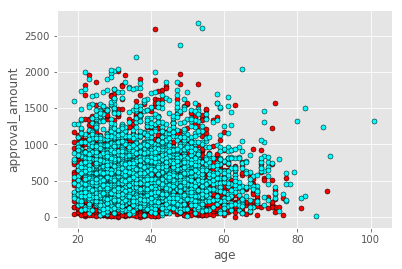

('Variables:', 'recommendation', 'age')


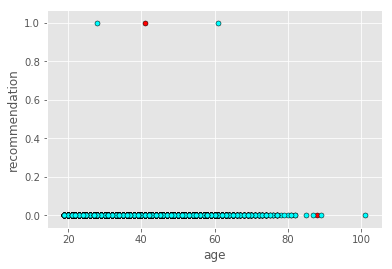

('Variables:', 'contacted', 'age')


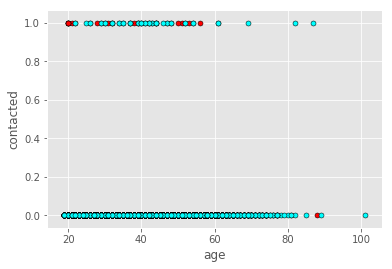

('Variables:', 'email_contacted_ts', 'age')


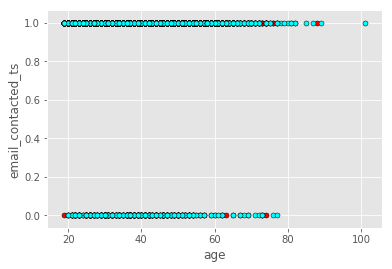

('Variables:', 'sms_contacted_ts', 'age')


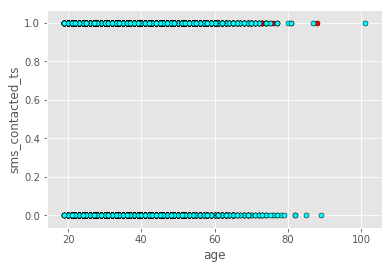

('Variables:', 'state', 'age')


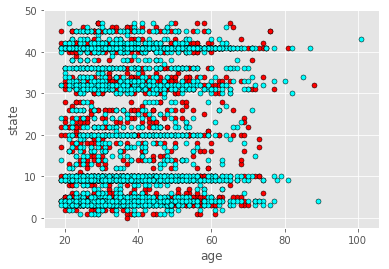

('Variables:', 'city', 'age')


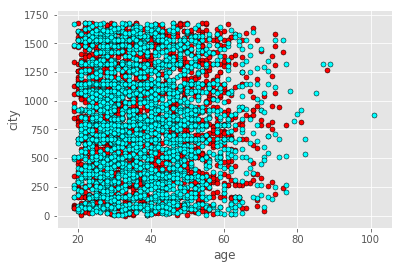

('Variables:', 'zip_code', 'age')


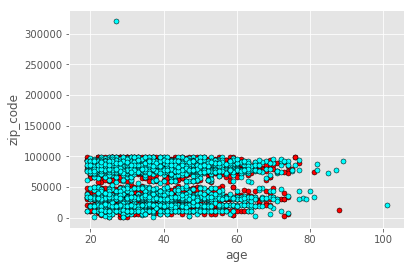

('Variables:', 'rent_or_own', 'age')


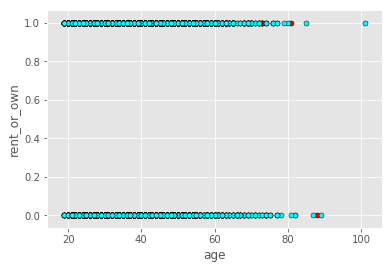

('Variables:', 'months_at_current_residence', 'age')


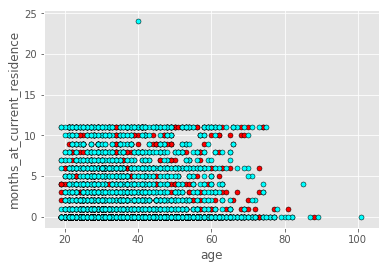

('Variables:', 'years_at_current_residence', 'age')


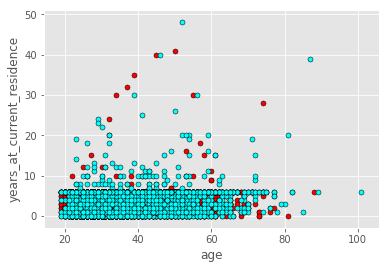

('Variables:', 'direct_deposit', 'age')


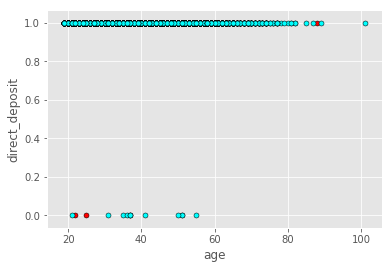

('Variables:', 'language_preference', 'age')


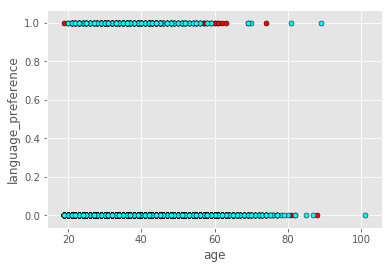

('Variables:', 'payment_frequency', 'age')


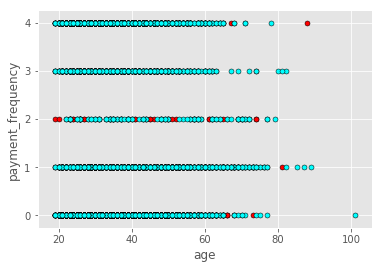

('Variables:', 'scheduled_payment_amt', 'age')


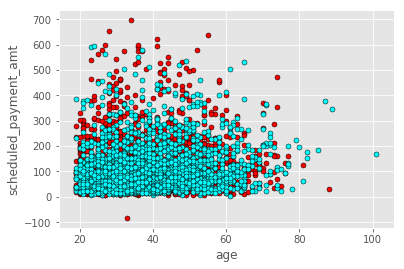

('Variables:', 'past_due_amt', 'age')


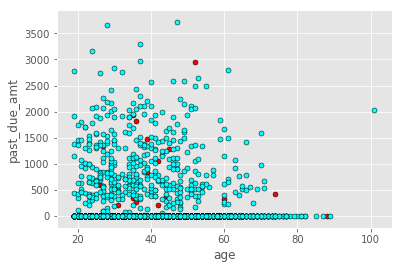

('Variables:', 'account_payment_method', 'age')


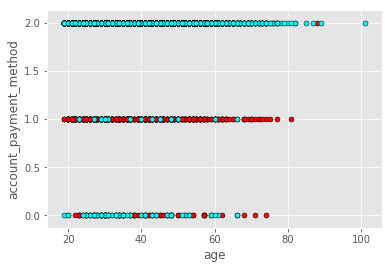

('Variables:', 'days_past_due', 'age')


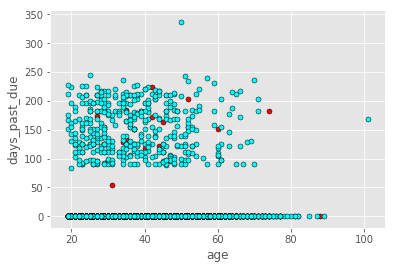

('Variables:', 'number_of_payments', 'age')


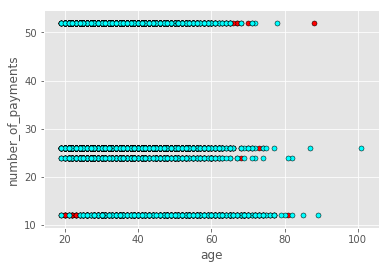

('Variables:', 'data_correction', 'age')


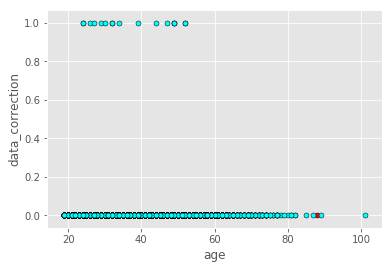

('Variables:', 'source', 'age')


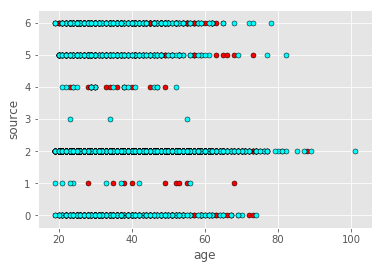

('Variables:', 'initial_decision', 'age')


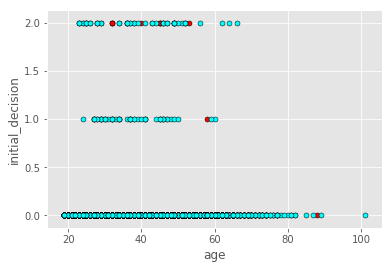

In [87]:
plotRelationsWithColumns(features,redeem_true_indexSecond,redeem_false_indexSecond)

In [97]:
newFeatures = features[["account_payment_method","approval_amount","scheduled_payment_amt","days_past_due","past_due_amt" ,"age","zip_code","city","sms_contacted_ts","state","years_at_current_residence","months_at_current_residence","source","email_contacted_ts","payment_frequency","number_of_payments"]]

Index([u'approval_amount', u'recommendation', u'contacted',
       u'email_contacted_ts', u'sms_contacted_ts', u'state', u'city',
       u'zip_code', u'rent_or_own', u'months_at_current_residence',
       u'years_at_current_residence', u'direct_deposit',
       u'language_preference', u'payment_frequency', u'scheduled_payment_amt',
       u'past_due_amt', u'account_payment_method', u'days_past_due',
       u'number_of_payments', u'data_correction', u'source',
       u'initial_decision', u'age'],
      dtype='object')

In [98]:
X_train, X_test, y_train, y_test = train_test_split(newFeatures,labels,test_size=0.20,random_state=13)

In [99]:
RandomForestModel = RandomForestClassifier(min_samples_leaf=5,min_samples_split=20,n_estimators=1000, max_depth= 5, random_state=10)
RandomForestModel.fit(X_train, y_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=5, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=20,
            min_weight_fraction_leaf=0.0, n_estimators=1000, n_jobs=None,
            oob_score=False, random_state=10, verbose=0, warm_start=False)

In [106]:
print("Train Score: ")
y_predict = RandomForestModel.predict(X_train)
rf = accuracy_score(y_train,y_predict)
rf

Train Score: 


0.73964354527938347

In [105]:
print("Test Score: ")
y_predict = RandomForestModel.predict(X_test)
rf = accuracy_score(y_test,y_predict)
rf

Test Score: 


0.75240847784200382

In [107]:
RandomForestModel.get_params()

{'bootstrap': True,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 5,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 5,
 'min_samples_split': 20,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 1000,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 10,
 'verbose': 0,
 'warm_start': False}

In [114]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import ShuffleSplit
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
scores = cross_val_score(RandomForestModel,features,labels, cv=cv)
scores

array([ 0.7177264 ,  0.72736031,  0.71483622,  0.72928709,  0.72061657])

In [115]:
print("Training Accuracy: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

Training Accuracy: 0.72 (+/- 0.01)


# Definimos un proceso para Random Forest y Desicion Tree

In [117]:
from sklearn.tree import DecisionTreeClassifier

# Pruebas con los parametros en desicion tree

# Pruebas con Desicion Tree

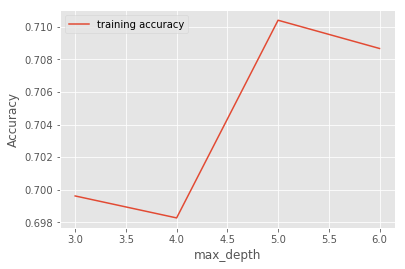

In [119]:
maxDepth = [3,4,5,6]
Acurracy = list()
for atri in maxDepth:
    # se construye el modelo de clasificacion
    clf_entropy = DecisionTreeClassifier(criterion = "entropy", random_state = 100,
    max_depth=atri, min_samples_leaf=5)
    cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
    scores = cross_val_score(clf_entropy,features,labels, cv=cv)
    Acurracy.append(scores.mean())
plt.plot(maxDepth, Acurracy, label="training accuracy")
plt.ylabel("Accuracy")
plt.xlabel("max_depth")
plt.legend()
    

    
    

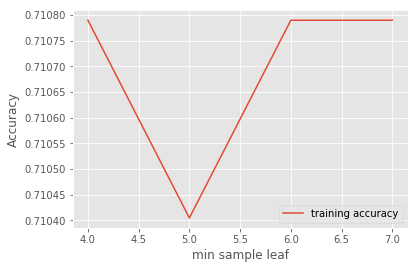

In [120]:
min_samples_leaf = [4,5,6,7]
Acurracy = list()
for atri in min_samples_leaf:
    # se construye el modelo de clasificacion
    clf_entropy = DecisionTreeClassifier(criterion = "entropy", random_state = 100,
    max_depth=5, min_samples_leaf=atri)
    cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
    scores = cross_val_score(clf_entropy,features,labels, cv=cv)
    Acurracy.append(scores.mean())
plt.plot(min_samples_leaf, Acurracy, label="training accuracy")
plt.ylabel("Accuracy")
plt.xlabel("min sample leaf")
plt.legend()

# Conclusión

Para este caso los mejores parametros son maxDepth = 5 y min_sample_lef = 6

# Pruebas con Random Forest

# n_estimators

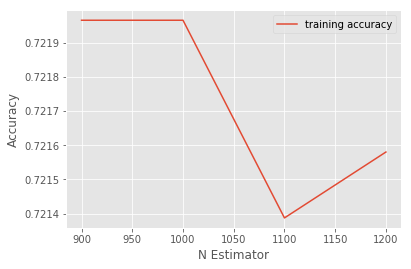

In [122]:
listAttrib = [900,1000,1100,1200]
Acurracy = list()
for atri in listAttrib:
    # se construye el modelo de clasificacion
    RandomForestModel = RandomForestClassifier(min_samples_leaf=5,min_samples_split=20,n_estimators=atri, max_depth= 5, random_state=10)
    cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
    scores = cross_val_score(RandomForestModel,features,labels, cv=cv)
    Acurracy.append(scores.mean())
plt.plot(listAttrib, Acurracy, label="training accuracy")
plt.ylabel("Accuracy")
plt.xlabel("N Estimator")
plt.legend()

# max_depth

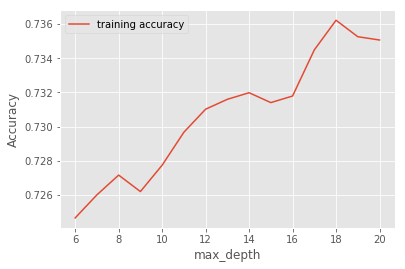

In [125]:
listAttrib = [6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]
Acurracy = list()
for atri in listAttrib:
    # se construye el modelo de clasificacion
    RandomForestModel = RandomForestClassifier(min_samples_leaf=5,min_samples_split=20,n_estimators=1000, max_depth= atri, random_state=10)
    cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
    scores = cross_val_score(RandomForestModel,features,labels, cv=cv)
    Acurracy.append(scores.mean())
plt.plot(listAttrib, Acurracy, label="training accuracy")
plt.ylabel("Accuracy")
plt.xlabel("max_depth")
plt.legend()

# min_samples_split

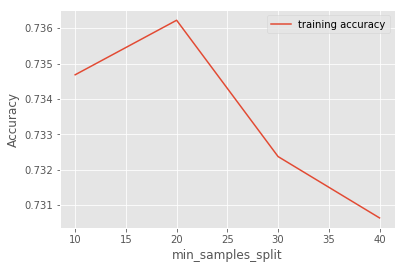

In [126]:
listAttrib = [10,20,30,40]
Acurracy = list()
for atri in listAttrib:
    # se construye el modelo de clasificacion
    RandomForestModel = RandomForestClassifier(min_samples_leaf=5,min_samples_split=atri,n_estimators=1000, max_depth=18, random_state=10)
    cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
    scores = cross_val_score(RandomForestModel,features,labels, cv=cv)
    Acurracy.append(scores.mean())
plt.plot(listAttrib, Acurracy, label="training accuracy")
plt.ylabel("Accuracy")
plt.xlabel("min_samples_split")
plt.legend()

# min_samples_leaf

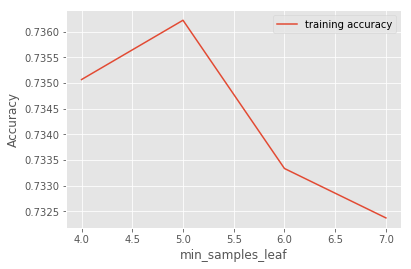

In [127]:
listAttrib = [4,5,6,7]
Acurracy = list()
for atri in listAttrib:
    # se construye el modelo de clasificacion
    RandomForestModel = RandomForestClassifier(min_samples_leaf=atri,min_samples_split=20,n_estimators=1000, max_depth=18, random_state=10)
    cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
    scores = cross_val_score(RandomForestModel,features,labels, cv=cv)
    Acurracy.append(scores.mean())
plt.plot(listAttrib, Acurracy, label="training accuracy")
plt.ylabel("Accuracy")
plt.xlabel("min_samples_leaf")
plt.legend()

# Conclusión

Los mejores parámetros n_estimators=1000,max_depth=18,min_samples_split=20 y min_samples_leaf = 5